# The landscape of cancer driver genes
Landscape of all cancer driver genes detected by the method across all cohorts

In [215]:
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import os
import numpy as np
import warnings
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import re
from itertools import chain
from matplotlib.ticker import MaxNLocator
from adjustText import adjust_text
from matplotlib.colors import Normalize

In [216]:
# Names and colors

colors_dict = {"Oncodrive3D" : "#ffad48", 
              "HotMAPS" : "#024b79", 
              "OncodriveCLUSTL" : "#43b7c2", 
              "smRegions" : "lightgray", 
              "CBaSE" : "lightgray", 
              "dNdScv" : "lightgray", 
              "MutPanning" : "lightgray", 
              "OncodriveFML" : "lightgray",
              "Random" : "pink"}

names_dict = {"o3d" : "Oncodrive3D", 
             "hotmaps" : "HotMAPS", 
             "clustl" : "OncodriveCLUSTL", 
             "smreg" : "smRegions", 
             "cbase" : "CBaSE", 
             "dndscv" : "dNdScv", 
             "mutpan" : "MutPanning", 
             "fml" : "OncodriveFML",
             "random" : "Random"}

In [217]:
SUBDIR = "human_mane_raw"
RUN = "run_2024-07-01_16-04-14"
# lst_methods = ["o3d", "hotmaps", "clustl", "smreg", "cbase", "seismic", "dndscv", "mutpan", "fml", "random"]
# lst_methods = ["o3d", "hotmaps", "clustl", "random"]

datasets = f"/workspace/projects/clustering_3d/o3d_analysys/datasets/"
input_path = f"{datasets}/input/cancer_202404"
cohort_df = pd.read_csv(f"{input_path}/cohorts.tsv", sep="\t")
cohort_df = cohort_df[~cohort_df.COHORT.str.startswith("ICGC")].reset_index(drop=True)
o3d_output_dir = f"{datasets}/output/cancer_202404/o3d_output/{SUBDIR}/{RUN}"
intogen_output = f"{datasets}/output/cancer_202404/intogen_output"
genetable_path = f"/workspace/projects/clustering_3d/o3d_analysys/o3d_paper/data/results/{SUBDIR}/{RUN}.genetable.tsv"
drivers_df = pd.read_table(f"{input_path}/drivers.tsv")
uniq_drivers_df = pd.read_table(f"{input_path}/unique_drivers.tsv")

cgc_df = pd.read_csv(f"{input_path}/CGC_list_v99.tsv", sep = "\t")
display(cgc_df)

oncotree_df = pd.read_csv(f"{datasets}/input/cancer_202404/oncotree.tsv", sep="\t")
display(oncotree_df)

oncokb_df = pd.read_csv(f"{input_path}/oncokb_list_20240712.tsv", sep = "\t")
oncokb_df = oncokb_df[["Hugo Symbol", "OncoKB Annotated", "MSK-IMPACT", "MSK-HEME", "FOUNDATION ONE", "FOUNDATION ONE HEME", "Vogelstein"]]
oncokb_df

,Gene Symbol,Name,Entrez GeneId,Genome Location,Tier,Hallmark,Chr Band,Somatic,Germline,Tumour Types(Somatic),Tumour Types(Germline),Cancer Syndrome,Tissue Type,Molecular Genetics,Role in Cancer,Mutation Types,Translocation Partner,Other Germline Mut,Other Syndrome,Synonyms
0,A1CF,APOBEC1 complementation factor,29974.0,10:50799421-50885675,2,NaN,10q11.23,yes,NaN,melanoma,NaN,NaN,E,NaN,oncogene,Mis,NaN,NaN,NaN,"ACF,ACF64,ACF65,APOBEC1CF,ASP,CCDS73133.1,ENSG..."
1,ABI1,abl-interactor 1,10006.0,10:26746593-26860935,1,Yes,10p12.1,yes,NaN,AML,NaN,NaN,L,Dom,"TSG, fusion",T,KMT2A,NaN,NaN,"ABI-1,CCDS7150.1,E3B1,ENSG00000136754.17,NM_00..."
2,ABL1,v-abl Abelson murine leukemia viral oncogene h...,25.0,9:130713946-130885683,1,Yes,9q34.12,yes,NaN,"CML, ALL, T-ALL",NaN,NaN,L,Dom,"oncogene, fusion","T, Mis","BCR, ETV6, NUP214",NaN,NaN,"ABL,CCDS35165.1,ENSG00000097007.17,JTK7,NM_007..."
3,ABL2,"c-abl oncogene 2, non-receptor tyrosine kinase",27.0,1:179099327-179229601,1,NaN,1q25.2,yes,NaN,AML,NaN,NaN,L,Dom,"oncogene, fusion",T,ETV6,NaN,NaN,"ABLL,ARG,CCDS30947.1,ENSG00000143322.19,NM_007..."
4,ACKR3,atypical chemokine receptor 3,57007.0,2:236569641-236582358,1,Yes,2q37.3,yes,NaN,lipoma,NaN,NaN,M,Dom,"oncogene, fusion",T,HMGA2,NaN,NaN,"CCDS2516.1,CMKOR1,CXCR7,ENSG00000144476.5,GPR1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
738,ZNF429,zinc finger protein 429,353088.0,19:21505564-21538078,2,NaN,19p12,yes,NaN,GBM,NaN,NaN,O,NaN,NaN,Mis,NaN,NaN,NaN,"CCDS42537.1,ENSG00000197013.9,NM_001001415.2,N..."
739,ZNF479,zinc finger protein 479,90827.0,7:57119614-57139864,2,NaN,7p11.2,yes,NaN,"lung cancer, bladder carcinoma, prostate carci...",NaN,NaN,E,NaN,NaN,Mis,NaN,NaN,NaN,"CCDS43590.1,ENSG00000185177.12,KR19,NM_033273...."
740,ZNF521,zinc finger protein 521,25925.0,18:25061926-25352152,1,NaN,18q11.2,yes,NaN,ALL,NaN,NaN,L,Dom,"oncogene, fusion",T,PAX5,NaN,NaN,"CCDS32806.1,EHZF,ENSG00000198795.10,Evi3,NM_01..."
741,ZNRF3,zinc and ring finger 3,84133.0,22:28883592-29057487,2,NaN,22q12.1,yes,NaN,"colorectal cancer, adrenocortical carcinoma, g...",NaN,NaN,E,NaN,TSG,"N, F, Mis",NaN,NaN,NaN,"BK747E2.3,CCDS56225.1,ENSG00000183579.15,FLJ22..."


,ID,PARENT,NAMES
0,AA,SOFT_TISSUE,Aggressive Angiomyxoma
1,AASTR,DIFG,Anaplastic Astrocytoma
2,ABC,DLBCLNOS,Activated B-cell Type
3,ABL,AMLNOS,Acute Basophilic Leukemia
4,ACA,ADRENAL_GLAND,Adrenocortical Adenoma
...,...,...,...
883,WDLS,LIPO,Well-Differentiated Liposarcoma
884,WDTC,THYROID,Well-Differentiated Thyroid Cancer
885,WM,LPL,Waldenstrom Macroglobulinemia
886,WPSCC,PSCC,Warty Penile Squamous Cell Carcinoma


,Hugo Symbol,OncoKB Annotated,MSK-IMPACT,MSK-HEME,FOUNDATION ONE,FOUNDATION ONE HEME,Vogelstein
0,ABL1,Yes,Yes,Yes,Yes,Yes,Yes
1,AKT1,Yes,Yes,Yes,Yes,Yes,Yes
2,ALK,Yes,Yes,Yes,Yes,Yes,Yes
3,AMER1,Yes,Yes,Yes,Yes,Yes,Yes
4,APC,Yes,Yes,Yes,Yes,Yes,Yes
...,...,...,...,...,...,...,...
1149,ZFP36L1,Yes,No,No,No,No,No
1150,ZFP36L2,Yes,No,No,No,No,No
1151,ZNF24,No,No,No,No,Yes,No
1152,ZNF331,No,No,No,No,No,No


In [218]:
cgc_df["Role in Cancer"].unique()

array(['oncogene', 'TSG, fusion', 'oncogene, fusion', 'fusion', 'TSG',
       nan, 'oncogene, TSG', 'oncogene, TSG, fusion'], dtype=object)

In [219]:
oncokb_df = pd.read_csv(f"{input_path}/oncokb_list_20240712.tsv", sep = "\t")
oncokb_df = oncokb_df[["Hugo Symbol", "OncoKB Annotated", "MSK-IMPACT", "MSK-HEME", "FOUNDATION ONE", "FOUNDATION ONE HEME", "Vogelstein"]]
oncokb_df

,Hugo Symbol,OncoKB Annotated,MSK-IMPACT,MSK-HEME,FOUNDATION ONE,FOUNDATION ONE HEME,Vogelstein
0,ABL1,Yes,Yes,Yes,Yes,Yes,Yes
1,AKT1,Yes,Yes,Yes,Yes,Yes,Yes
2,ALK,Yes,Yes,Yes,Yes,Yes,Yes
3,AMER1,Yes,Yes,Yes,Yes,Yes,Yes
4,APC,Yes,Yes,Yes,Yes,Yes,Yes
...,...,...,...,...,...,...,...
1149,ZFP36L1,Yes,No,No,No,No,No
1150,ZFP36L2,Yes,No,No,No,No,No
1151,ZNF24,No,No,No,No,Yes,No
1152,ZNF331,No,No,No,No,No,No


In [220]:
genetable = pd.read_csv(genetable_path, sep="\t", dtype={1 : str, 2 : str, 3 : int})
genetable = genetable[[not cohort.startswith("ICGC") for cohort in genetable["Cohort"]]].reset_index(drop=True)
genetable_subset = genetable[genetable["Cohort"].str.startswith("TCGA")]
genetable_subset

,Gene,Uniprot_ID,o3d_status,CGC,Fish,o3d_rank,o3d_pval,o3d_qval,cbase_rank,cbase_pval,...,clustl_pval,clustl_qval,fml_rank,fml_pval,fml_qval,smreg_rank,smreg_pval,smreg_qval,Cancer,Cohort
3062778,NFE2L2,Q16236,Processed,1,0,0.0,0.0,0.0,6.0,0.000000,...,0.002892,0.380525,3.0,0.000001,0.001441,NaN,NaN,NaN,LUSC,TCGA_WXS_LUSC
3062779,TP53,K7PPA8,Processed,1,0,1.0,0.0,0.0,11.0,0.000000,...,0.000055,0.073971,1.0,0.000001,0.001441,0.0,9.534979e-56,1.202361e-51,LUSC,TCGA_WXS_LUSC
3062780,PIK3CA,P42336,Processed,1,0,2.0,0.0,0.0,53.0,0.000388,...,0.000004,0.007465,29.0,0.000310,0.148955,1.0,8.013395e-12,5.052445e-08,LUSC,TCGA_WXS_LUSC
3062781,CDKN2A,K7PML8,Processed,1,0,3.0,0.0,0.0,5.0,0.000000,...,0.000399,0.266155,5.0,0.000001,0.001441,NaN,NaN,NaN,LUSC,TCGA_WXS_LUSC
3062782,HRAS,P01112,Processed,1,0,4.0,0.0,0.0,990.0,0.033670,...,0.003380,0.380525,2313.0,0.129510,0.927878,2046.0,1.413890e-01,7.547557e-01,LUSC,TCGA_WXS_LUSC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4582141,XKRY2,NaN,NaN,0,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGNG,TCGA_WXS_PGNG
4582142,BCORL2,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGNG,TCGA_WXS_PGNG
4582143,CYorf15A,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGNG,TCGA_WXS_PGNG
4582144,CYorf15B,NaN,NaN,0,0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGNG,TCGA_WXS_PGNG


In [221]:
len(cohort_df.CANCER_TYPE.unique())
cohort_df.CANCER_TYPE.unique()

array(['BLCA', 'EGC', 'LMS', 'STAD', 'MEL', 'AML', 'HCC', 'UCEC', 'EPM',
       'COADREAD', 'GB', 'ANSC', 'RCC', 'OS', 'BCC', 'RMS', 'PRAD', 'ACC',
       'WDTC', 'ES', 'UTUC', 'GIST', 'LIPO', 'MBL', 'ANGS', 'GBC', 'ALL',
       'LUNG', 'BRCA', 'RBL', 'CLLSLL', 'BLADDER', 'SCLC', 'NSCLC',
       'STOMACH', 'SKCM', 'NETNOS', 'SOFT_TISSUE', 'SARCNOS', 'COAD',
       'HNSC', 'SIC', 'CHOL', 'ESCC', 'DLBCLNOS', 'GBM', 'HGGNOS', 'NBL',
       'ESCA', 'CSCC', 'SKIN', 'LUAD', 'CEAD', 'PLMESO', 'LGGNOS', 'PAAD',
       'OVT', 'LUSC', 'SACA', 'CESC', 'CCRCC', 'PANCREAS', 'ACYC', 'MT',
       'PROSTATE', 'READ', 'PCM', 'BL', 'VULVA', 'PAST', 'ATRT', 'PANET',
       'NHL', 'CHRCC', 'MDS', 'NPC', 'LIHB', 'WT', 'MGCT', 'UCS', 'UM',
       'THYM', 'PRCC', 'PGNG'], dtype=object)

## Cancer type specific CGC

In [222]:
def capitalize_words(text):
    
    return ' '.join(word.capitalize() for word in text.split())


def is_in_sub(tissue, sub_dict):

    key_ix = np.array([key in tissue for key in sub_dict.keys()]).flatten()
    is_in = key_ix.any()

    if is_in:
        tissue = np.array(list(sub_dict.keys()))[key_ix]
        return is_in, tissue
    else:
        return is_in, np.nan


def get_parent_tissues_dict(lst_tissues, oncotree_df):

    tissue_parent_dict = {}
    upper_ttypes = ["SOLID", "BOWEL", "OTHER", "CANCER", "NON_SOLID", np.nan]
    for tissue in lst_tissues:
        parent = tissue
        while parent not in upper_ttypes:
            if parent not in upper_ttypes:
                if parent not in upper_ttypes:
                    tissue_parent_dict[tissue] = parent
                    parent = oncotree_df[oncotree_df["ID"] == parent].PARENT.values
                    if len(parent) == 0:
                        parent = "OTHER"
                    else:
                        parent = parent[0]

    return tissue_parent_dict


def get_cgc_ttypes_to_process(cgc_ttypes):
    """
    Save ttypes that are not directly found in our data
    """
    
    cgc_ttypes_to_process = []
    for tissues in cgc_ttypes:
        if not pd.isnull(tissues):
            tissues = tissues.split(",")
            for tissue in tissues:
                tissue = tissue.lstrip()
                if tissue not in all_ids and tissue not in cgc_ttypes_to_process:
                    cgc_ttypes_to_process.append(tissue)
    
    return cgc_ttypes_to_process
    

def get_cgc_ttypes_dict(cgc_ttypes_to_process, cgc_tissue_internal_dict):
    """
    Get a dictionary to map any tissue appearing in the 
    tissue lst of CGC genes to known tissue annotation
    """
    
    cgc_tissue_dict = {}
    n_to_process_0 = len(cgc_ttypes_to_process)
    n = 0
    n_to_process = 0
    
    while n_to_process < n_to_process_0:
        #print("iter", n, n_to_process, n_to_process_0)
        n_to_process_0 = len(cgc_ttypes_to_process)
        n += 1
        # Process the ttypes trying to retrieve a reference tissue
        for tissue in cgc_ttypes_to_process:
            is_sub, sub_tissue = is_in_sub(tissue, cgc_tissue_internal_dict)
            if tissue.upper() in all_ids:
                cgc_tissue_dict[tissue] = tissue.upper()
                cgc_ttypes_to_process.remove(tissue)
            elif capitalize_words(tissue) in oncotree_names:
                cgc_tissue_dict[tissue] = oncotree_df[oncotree_df["NAMES"] == capitalize_words(tissue)].ID.values[0]
                cgc_ttypes_to_process.remove(tissue)
            elif is_sub:
                # if len(sub_tissue) > 1:
                #     print(tissue, "LEN > 1", sub_tissue)
                sub_tissue = sub_tissue[0]
                cgc_tissue_dict[tissue] = cgc_tissue_internal_dict[sub_tissue]
                cgc_ttypes_to_process.remove(tissue)
    
        n_to_process = len(cgc_ttypes_to_process)
    
    for tissue in cgc_ttypes_to_process:
        cgc_tissue_dict[tissue] = "OTHER"

    return cgc_tissue_dict


cgc_tissue_internal_dict = {
    "pancrea" : "PANCREAS",
    "oesophag" : "STOMACH",
    "stomach" : "STOMACH",
    "thyroid" : "THYROID",
    "neuroblastoma" : "BRAIN",
    "colorectal" : "COADREAD",
    "ovarian" : "OVARY",
    "glioma" : "BRAIN",
    "colon" : "COADREAD",
    "CNS" : "CNS",
    "lung" : "LUNG",
    "endometri" : "UCEC",
    "melanoma" : "SKIN",
    "uterine" : "UTERUS",
    "breast" : "BRCA",
    "gastric" : "STOMACH",
    "hepato" : "LIVER",
    "hepatic" : "LIVER",
    "AML" : "AML",
    "head" : "HEAD_NECK",
    "neck" : "HEAD_NECK",
    "renal" : "KIDNEY",
    "leukaemia" : "LEUKAEMIA",
    "AEL" : "LEUKAEMIA",
    "AL" : "LEUKAEMIA",
    "central nervous system" : "CNS",
    "skin" : "SKIN",
    "biliary" : "LIVER",
    "kidney" : "KIDNEY",
    "intracranial" : "HEAD_NECK",
    "prostate" : "PROSTATE",
    "pulmonary" : "LUNG",
    "ovary" : "OVARY",
    "epithelio" : "SKIN",
    "CLL" : "LEUKAEMIA",
    "lymphoma" : "LYMPHOMA",
    "soft tissue" : "SOFT_TISSUE",
    "bladder" : "BLADDER",
    "squamous cell" : "CUP",
    "GBM" : "GB",
    "prostae" : "PROSTATE",
    "sarcoma" : "SARC",
    "urothelial" : "BLADDER",
    "Lung" : "LUNG",
    "urothelial" : "UTERUS",
    "salivary" : "HEAD_NECK",
    "intestine" : "COADREAD",
    "bone" : "BONE",
    "peritoneal" : "PERITONEUM",
}

In [223]:
# Soft tissue issue (to discuss)
cohort_df.COHORT = cohort_df.COHORT.replace("TCGA_WXS_SOFT_TISSUE", "TCGA_WXS_SARC")
cohort_df.CANCER_TYPE = cohort_df.CANCER_TYPE.replace("SOFT_TISSUE", "SARC")
cohort_df.CANCER_TYPE = cohort_df.CANCER_TYPE.replace("SARCNOS", "SARC")
cohort_df.CANCER_TYPE.unique()

array(['BLCA', 'EGC', 'LMS', 'STAD', 'MEL', 'AML', 'HCC', 'UCEC', 'EPM',
       'COADREAD', 'GB', 'ANSC', 'RCC', 'OS', 'BCC', 'RMS', 'PRAD', 'ACC',
       'WDTC', 'ES', 'UTUC', 'GIST', 'LIPO', 'MBL', 'ANGS', 'GBC', 'ALL',
       'LUNG', 'BRCA', 'RBL', 'CLLSLL', 'BLADDER', 'SCLC', 'NSCLC',
       'STOMACH', 'SKCM', 'NETNOS', 'SARC', 'COAD', 'HNSC', 'SIC', 'CHOL',
       'ESCC', 'DLBCLNOS', 'GBM', 'HGGNOS', 'NBL', 'ESCA', 'CSCC', 'SKIN',
       'LUAD', 'CEAD', 'PLMESO', 'LGGNOS', 'PAAD', 'OVT', 'LUSC', 'SACA',
       'CESC', 'CCRCC', 'PANCREAS', 'ACYC', 'MT', 'PROSTATE', 'READ',
       'PCM', 'BL', 'VULVA', 'PAST', 'ATRT', 'PANET', 'NHL', 'CHRCC',
       'MDS', 'NPC', 'LIHB', 'WT', 'MGCT', 'UCS', 'UM', 'THYM', 'PRCC',
       'PGNG'], dtype=object)

In [224]:
cohorts_id = cohort_df.CANCER_TYPE.unique() 
oncotree_id = oncotree_df.ID.unique()
oncotree_parentid = oncotree_df.PARENT.unique()
oncotree_names = oncotree_df.NAMES.unique()
all_ids = np.concatenate((cohorts_id, oncotree_id, oncotree_parentid))
cgc_ttypes = cgc_df["Tumour Types(Somatic)"].unique()
len(all_ids)

1140

In [225]:
oncotree_parentid

array(['SOFT_TISSUE', 'DIFG', 'DLBCLNOS', 'AMLNOS', 'ADRENAL_GLAND',
       'BRCA', 'SACA', 'LGT', 'MDS/MPN', 'CUP', 'SELT', 'CPT', 'MEL',
       'BONE', 'SKIN', 'SOLID', 'BOWEL', 'ENCG', 'MBN', 'OTHER', 'MTNN',
       'MNM', 'ALCL', 'LNM', 'LNET', 'EMBT', 'AMBL', 'AMBLNWS', 'AMLRGA',
       'AML', 'AMPULLA_OF_VATER', 'MNET', 'MNGT', 'EPMT', 'RMS', 'OHNCA',
       'SM', 'ALAL', 'GINET', 'PBS', 'BGCT', 'PROSTATE', 'BREAST',
       'BRAIN', 'BLADDER', 'LCLC', 'ALL', 'BLLRGA', 'BLL', 'PT', 'PSCC',
       'BTOV', 'OVT', 'CERVIX', 'COADREAD', nan, 'CHDM', 'MMBC', 'ODGC',
       'NCCRCC', 'RCC', 'KIDNEY', 'CEAD', 'MPN', 'HL', 'PTLD', 'MP',
       'IPN', 'OS', 'OM', 'MCD', 'CML', 'CMML', 'NSCLC', 'SCHW', 'LUNG',
       'APAD', 'SBC', 'CHS', 'LIPO', 'FL', 'DMBL', 'STAD', 'HDCN',
       'STOMACH', 'CHOL', 'MZL', 'MBC', 'NSGCT', 'EGC', 'USARC', 'ET',
       'TLL', 'GTD', 'BFN', 'LIVER', 'SCST', 'GBC', 'ICPN', 'GB', 'CEMU',
       'PNS', 'UTERUS', 'SBLU', 'DCS', 'ESS', 'GINETES', 'MBT', 'OOVC',
 

In [226]:
print(len(cgc_df["Tumour Types(Somatic)"].unique()))

423


In [227]:
# Convert CGC tissue list into the known tissue annotation

cgc_ttypes_to_process = get_cgc_ttypes_to_process(cgc_ttypes)
cgc_ttypes_dict = get_cgc_ttypes_dict(cgc_ttypes_to_process, cgc_tissue_internal_dict)

cgc_df["CANCER_TYPE"] = cgc_df["Tumour Types(Somatic)"].apply(lambda x: ["OTHER"] if pd.isnull(x) else x.split(","))
cgc_df["CANCER_TYPE"] = cgc_df["CANCER_TYPE"].apply(lambda x: ["OTHER" if pd.isnull(tissue) else tissue.lstrip() if tissue.lstrip() not in cgc_ttypes_dict.keys() else cgc_ttypes_dict[tissue.lstrip()] for tissue in x])
cgc_df["CANCER_TYPE"]

0                          [MEL]
1                          [AML]
2          [CML, ALL, LEUKAEMIA]
3                          [AML]
4                        [OTHER]
                 ...            
738                        [GBM]
739    [LUNG, BLADDER, PROSTATE]
740                        [ALL]
741     [COADREAD, ACC, STOMACH]
742             [MDS, LEUKAEMIA]
Name: CANCER_TYPE, Length: 743, dtype: object

In [228]:
# Get lst of unique tissue appearing in CGC lst
flattened_list = list(chain.from_iterable(cgc_df["CANCER_TYPE"].values))
unique_cgc_ttypes = np.unique(flattened_list)
unique_cgc_ttypes

array(['ACC', 'ACML', 'ACYC', 'AFH', 'ALCL', 'ALL', 'AML', 'ANGL', 'ANGS',
       'ARMS', 'ASPS', 'BILIARY_TRACT', 'BL', 'BLADDER', 'BONE', 'BRAIN',
       'BRCA', 'BREAST', 'CCRCC', 'CCS', 'CHBL', 'CHOL', 'CHS', 'CML',
       'CMML', 'CNL', 'CNS', 'COAD', 'COADREAD', 'CUP', 'DESM', 'DFSP',
       'DIPG', 'EMCHS', 'ERMS', 'ES', 'ESS', 'FA', 'FL', 'GB', 'GBM',
       'GIST', 'GNG', 'HCC', 'HEAD_NECK', 'HL', 'HMBL', 'JMML', 'KIDNEY',
       'LCH', 'LEUKAEMIA', 'LIHB', 'LIPO', 'LIVER', 'LM', 'LUAD', 'LUNG',
       'LYMPHOMA', 'MBL', 'MCD', 'MCHS', 'MCL', 'MDS', 'MEL', 'MFS',
       'MNG', 'MPN', 'MYCHS', 'MZL', 'NBL', 'NFIB', 'NHL', 'NSCLC', 'ODG',
       'OTHER', 'OVARY', 'PANCREAS', 'PAST', 'PERITONEUM', 'PGNG', 'PHC',
       'PMBL', 'PPB', 'PROSTATE', 'PTAD', 'RAML', 'RBL', 'RCC', 'RMS',
       'SARC', 'SCLC', 'SKCM', 'SKIN', 'SMZL', 'SOFT_TISSUE', 'STOMACH',
       'SYNS', 'TGCT', 'THAP', 'THYROID', 'UCEC', 'ULM', 'UM', 'UTERUS',
       'WM'], dtype='<U13')

In [229]:
# Get a dict to upper parent tissue for each tissue appearing in CGC lst and our cohorts

cgc_tissue_parent_dict = get_parent_tissues_dict(unique_cgc_ttypes, oncotree_df)

cohorts_tissue_parent_dict = get_parent_tissues_dict(cohort_df.CANCER_TYPE.unique(), oncotree_df)
cohorts_tissue_parent_dict["SARC"] = "SOFT_TISSUE"
cohorts_tissue_parent_dict["SOFT_TISSUE"] = "SOFT_TISSUE"
cohorts_tissue_parent_dict

{'BLCA': 'BLADDER',
 'EGC': 'STOMACH',
 'LMS': 'SOFT_TISSUE',
 'STAD': 'STOMACH',
 'MEL': 'SKIN',
 'AML': 'MYELOID',
 'HCC': 'LIVER',
 'UCEC': 'UTERUS',
 'EPM': 'BRAIN',
 'COADREAD': 'COADREAD',
 'GB': 'BRAIN',
 'ANSC': 'ANSC',
 'RCC': 'KIDNEY',
 'OS': 'BONE',
 'BCC': 'SKIN',
 'RMS': 'SOFT_TISSUE',
 'PRAD': 'PROSTATE',
 'ACC': 'ADRENAL_GLAND',
 'WDTC': 'THYROID',
 'ES': 'BONE',
 'UTUC': 'BLADDER',
 'GIST': 'SOFT_TISSUE',
 'LIPO': 'SOFT_TISSUE',
 'MBL': 'BRAIN',
 'ANGS': 'SOFT_TISSUE',
 'GBC': 'BILIARY_TRACT',
 'ALL': 'LYMPH',
 'LUNG': 'LUNG',
 'BRCA': 'BREAST',
 'RBL': 'EYE',
 'CLLSLL': 'LYMPH',
 'BLADDER': 'BLADDER',
 'SCLC': 'LUNG',
 'NSCLC': 'LUNG',
 'STOMACH': 'STOMACH',
 'SKCM': 'SKIN',
 'NETNOS': 'CUP',
 'SARC': 'SOFT_TISSUE',
 'COAD': 'COADREAD',
 'HNSC': 'HEAD_NECK',
 'SIC': 'SIC',
 'CHOL': 'BILIARY_TRACT',
 'ESCC': 'STOMACH',
 'DLBCLNOS': 'LYMPH',
 'GBM': 'BRAIN',
 'HGGNOS': 'BRAIN',
 'NBL': 'PNS',
 'ESCA': 'STOMACH',
 'CSCC': 'SKIN',
 'SKIN': 'SKIN',
 'LUAD': 'LUNG',
 'CEAD':

In [230]:
# Get general cancer type for our cohorts
cohort_df["GENERAL_CANCER_TYPE"] = cohort_df.CANCER_TYPE.apply(lambda x: cohorts_tissue_parent_dict[x])
cohort_df

,COHORT,CANCER_TYPE,PLATFORM,MUTATIONS,SAMPLES,GENERAL_CANCER_TYPE
0,HARTWIG_WGS_BLCA_2023,BLCA,WGS,5017561,144,BLADDER
1,HARTWIG_WGS_EGC_2023,EGC,WGS,573540,21,STOMACH
2,HARTWIG_WGS_LMS_2023,LMS,WGS,339549,43,SOFT_TISSUE
3,CBIOP_WGS_STAD_ONCOSG_2018,STAD,WGS,861309,147,STOMACH
4,CBIOP_WXS_CM_VALLEN_2018,MEL,WXS,132960,151,SKIN
...,...,...,...,...,...,...
210,TCGA_WXS_PRCC,PRCC,WXS,34566,276,KIDNEY
211,TCGA_WXS_PRAD,PRAD,WXS,34239,494,PROSTATE
212,TCGA_WXS_PLMESO,PLMESO,WXS,3980,82,PLEURA
213,TCGA_WXS_SARC,SARC,WXS,31484,234,SOFT_TISSUE


In [231]:
# Get general cancer type for CGC lst
cgc_df["GENERAL_CANCER_TYPE"] = cgc_df["CANCER_TYPE"].apply(lambda x: 
                                                            ["OTHER" if pd.isnull(tissue) or tissue == "OTHER" else 
                                                             cgc_tissue_parent_dict[tissue] for tissue in x] if len(x) > 0 else ["OTHER"])
cgc_df = cgc_df[["Gene Symbol", "Tumour Types(Somatic)", "CANCER_TYPE", "GENERAL_CANCER_TYPE", "Synonyms"]]
cgc_df

,Gene Symbol,Tumour Types(Somatic),CANCER_TYPE,GENERAL_CANCER_TYPE,Synonyms
0,A1CF,melanoma,[MEL],[SKIN],"ACF,ACF64,ACF65,APOBEC1CF,ASP,CCDS73133.1,ENSG..."
1,ABI1,AML,[AML],[MYELOID],"ABI-1,CCDS7150.1,E3B1,ENSG00000136754.17,NM_00..."
2,ABL1,"CML, ALL, T-ALL","[CML, ALL, LEUKAEMIA]","[MYELOID, LYMPH, LEUKAEMIA]","ABL,CCDS35165.1,ENSG00000097007.17,JTK7,NM_007..."
3,ABL2,AML,[AML],[MYELOID],"ABLL,ARG,CCDS30947.1,ENSG00000143322.19,NM_007..."
4,ACKR3,lipoma,[OTHER],[OTHER],"CCDS2516.1,CMKOR1,CXCR7,ENSG00000144476.5,GPR1..."
...,...,...,...,...,...
738,ZNF429,GBM,[GBM],[BRAIN],"CCDS42537.1,ENSG00000197013.9,NM_001001415.2,N..."
739,ZNF479,"lung cancer, bladder carcinoma, prostate carci...","[LUNG, BLADDER, PROSTATE]","[LUNG, BLADDER, PROSTATE]","CCDS43590.1,ENSG00000185177.12,KR19,NM_033273...."
740,ZNF521,ALL,[ALL],[LYMPH],"CCDS32806.1,EHZF,ENSG00000198795.10,Evi3,NM_01..."
741,ZNRF3,"colorectal cancer, adrenocortical carcinoma, g...","[COADREAD, ACC, STOMACH]","[COADREAD, ADRENAL_GLAND, STOMACH]","BK747E2.3,CCDS56225.1,ENSG00000183579.15,FLJ22..."


In [232]:
cohort_df[cohort_df["GENERAL_CANCER_TYPE"] == "SKIN"]

,COHORT,CANCER_TYPE,PLATFORM,MUTATIONS,SAMPLES,GENERAL_CANCER_TYPE
4,CBIOP_WXS_CM_VALLEN_2018,MEL,WXS,132960,151,SKIN
16,STJUDE_WGS_D_CM_2018,MEL,WGS,101075,7,SKIN
17,CBIOP_WXS_BCC_UNIGE_2016_TREAT,BCC,WXS,14061,11,SKIN
41,HARTWIG_WGS_SKCM_2023,SKCM,WGS,28349563,299,SKIN
58,CBIOP_WXS_CSCC_UCSF_2018,CSCC,WXS,146195,83,SKIN
59,HARTWIG_WGS_SKIN_2023,SKIN,WGS,2795337,26,SKIN
72,CBIOP_WXS_SKCM_BROAD,MEL,WXS,157355,88,SKIN
93,CBIOP_WXS_BCC_UNIGE_2016_UNTREAT,BCC,WXS,159247,76,SKIN
141,OTHER_WXS_SCC_NATCOM2018,CSCC,WXS,62487,38,SKIN
152,TCGA_WXS_MEL,MEL,WXS,571852,466,SKIN


## Heatmap

### First iter

In [1041]:
def get_hits(genetable_df, alpha=0.01):
    
    genetable_df = genetable_df[genetable_df["o3d_qval"] < 0.01]
    genetable_df = genetable_df[["Gene", "Uniprot_ID", "Cancer", "Cohort", "CGC", "Fish", "o3d_qval"]].reset_index(drop=True)
    genetable_df = genetable_df.rename(columns={"o3d_qval" : "Oncodrive3D"})
    genetable_df["Oncodrive3D"] = 1
    
    return genetable_df


def get_cgc_specific(hits_df, cgc_df, cohorts_parent_dict):

    hits_df["General_cancer"] = hits_df.Cancer.apply(lambda x: cohorts_parent_dict[x])
    hits_df["CGC_specific"] = hits_df.apply(lambda x: 
                                        x["General_cancer"] in cgc_df[cgc_df["Gene Symbol"] == x["Gene"]].GENERAL_CANCER_TYPE.values[0] 
                                        if x["CGC"] == 1 else 0, axis=1).astype(int)
    hits_df["Not_CGC"] = hits_df.apply(lambda x: 1 if x["CGC"] != 1 else 0, axis=1)
    hits_df["CGC_not_specific"] = hits_df.apply(lambda x: 1 if x["CGC"] == 1 and x["CGC_specific"] == 0 else 0, axis=1)

    return hits_df


def get_cgc_specific_count_for_ttype(hits_df_ttype):

    hits_df_ttype = hits_df_ttype[["Gene", "Oncodrive3D", "CGC_specific", "Not_CGC", "CGC_not_specific"]].drop_duplicates().reset_index(drop=True)
    hits_df_ttype = hits_df_ttype.drop(columns=["Gene"]).sum()

    return hits_df_ttype


def get_gene_cohorts_binary(genetable_df, 
                            cohort_df, 
                            top_cohorts_n=None, 
                            top_genes_n=None, 
                            anomaly_dict=None,
                            rm_empty_cols=True,
                            log_score=True,
                            cgc_specific=False,
                            cgc_df=None, 
                            cohorts_parent_dict=None,
                            grouped_by_cancer=False):

    hits_df = get_hits(genetable_df)

    # Count by general cancer
    if grouped_by_cancer:
        hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
        hits_df = hits_df.drop(columns=["Uniprot_ID", "Cancer", "Cohort", "Fish"]).drop_duplicates().reset_index(drop=True)
        target_col = "General_cancer"
        # Get count of cancer a gene has been detected as significant across all cohorts
        gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D").sort_values("Oncodrive3D", ascending=False).set_index("Gene")
        # For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
        cohort_hits_count = hits_df.groupby("General_cancer").apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False)

    # Count by cohort
    else:
        target_col = "Cohort"
        if cgc_specific:
            hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_parent_dict)
            cohort_cgc_count = hits_df.groupby("Cohort").apply(lambda x: pd.Series({
                    "CGC_specific": sum(x["CGC_specific"]),
                    "CGC_not_specific": sum(x["CGC_not_specific"]),
                    "Not_CGC": sum(x["Not_CGC"])
                })).reset_index()
        else:
            hits_df["Not_CGC"] = hits_df.apply(lambda x: 1 if x["CGC"] != 1 else 0, axis=1)
            cohort_cgc_count = hits_df.groupby("Cohort").apply(lambda x: pd.Series({
                "CGC": sum(x["CGC"]),
                "Not_CGC": sum(x["Not_CGC"])
            })).reset_index()
    
        gene_hits_count = hits_df.groupby("Gene").sum()[["Oncodrive3D"]].sort_values("Oncodrive3D", ascending=False)
        cohort_hits_count = hits_df.groupby("Cohort").sum()[["Oncodrive3D"]].sort_values("Oncodrive3D", ascending=False)
    
    if top_genes_n is None:
        top_genes_n = len(gene_hits_count)
    if top_cohorts_n is None:
        top_cohorts_n = len(cohort_hits_count)
    top_genes = gene_hits_count[:top_genes_n].index
    top_cohorts = cohort_hits_count[:top_cohorts_n].index

    # Get df anomaly and binary
    df_anomaly = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    df_binary = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    for cohort in top_cohorts:
        genes = hits_df[hits_df[target_col] == cohort].Gene.values
        genes = [gene for gene in genes if gene in df_anomaly.columns]
        # Df anomaly
        scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
        df_anomaly.loc[cohort, genes] = scores
        # Df binary
        df_binary.loc[cohort, genes] = 1

    df_anomaly = df_anomaly.T 
    df_binary = df_binary.T 
    if len(cohort_df) == 1:
        df_anomaly = df_anomaly.loc[hits_df.Gene]
        df_binary = df_binary.loc[hits_df.Gene]
        
    if rm_empty_cols:
        df_anomaly = df_anomaly.loc[:, ~(df_anomaly == 0).all()]
        df_binary = df_binary.loc[:, ~(df_binary == False).all()]

    gene_hits_count = gene_hits_count.loc[df_anomaly.index]
    cohort_hits_count = cohort_hits_count.loc[[cohort for cohort in cohort_hits_count.index if cohort in df_anomaly.columns]]

    if not grouped_by_cancer:
        cohort_hits_count = cohort_hits_count.merge(cohort_cgc_count, on="Cohort")
    
    return df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count
    

def get_gene_annotation(df, genetable):
    
    cgc_genes = genetable[genetable["CGC"] == 1].Gene.unique()
    fish_genes = genetable[genetable["Fish"] == 1].Gene.unique()
    gene_annotation = ["CGC" if gene in cgc_genes else "Fishy" if gene in fish_genes else "Not annotated" for gene in df.index]
    gene_annotation = pd.Series(gene_annotation, name="Annotation")
    lut = {"CGC": '#ff7f0e', 
           "Fishy": '#2ca02c', 
           "Not annotated": '#7f7f7f',
           "Not CGC" : '#7f7f7f'}
    gene_colors = gene_annotation.map(lut)
    
    return gene_colors, lut


def get_anomaly_df(genetable_df, o3d_output_dir):
    
    lst_cohort = []
    for cohort in genetable_df.Cohort.unique():
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        df_cohort = pd.read_csv(f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv")
        df_cohort = df_cohort[["Cohort", "Gene", "Uniprot_ID", "qval", "C_gene", "C_pos", "Score_obs_sim_top_vol"]]
        df_cohort = df_cohort.dropna(subset="qval").rename(columns={"Score_obs_sim_top_vol" : "Clustering_score"})
        lst_cohort.append(df_cohort)

    anomaly_df = pd.concat(lst_cohort).reset_index(drop=True)
    anomaly_df = anomaly_df.merge(genetable_df[["Cohort", "Gene", "CGC", "Fish"]].drop_duplicates(), on=["Cohort", "Gene"], how="left")
    anomaly_df.Cohort = anomaly_df.Cohort.replace("TCGA_WXS_SOFT_TISSUE", "TCGA_WXS_SARC")
    
    return anomaly_df


def create_custom_colormap(cmap="Reds"):
    colors = sns.color_palette(cmap, as_cmap=True)
    colors = colors(np.linspace(0, 0.9, 256)) # Soften the dark color
    
    return LinearSegmentedColormap.from_list("CustomReds", colors)


def plot_landscape(df, gene_colors, lut, 
                   gene_hits_count, cohort_hits_count,
                   df_anomaly=None,
                   figsize=(16,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   divergent_palette=False,
                   color_gene=False,
                   plot_cgc_specific=False,
                   right_ax_ylabel="Cohort count"):
    
    if df_anomaly is not None:
        df_binary = df
        df = df_anomaly
        cmap = "vlag"
        cmap = create_custom_colormap()
    else:
        colors = ["lightgray", "gray"] 
        cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))
    if divergent_palette:
        cmap = sns.color_palette("coolwarm", as_cmap=True)

    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    #col_labels = [ctype_dict[cohort] for cohort  in col_labels]

    gene_sums = gene_hits_count["Oncodrive3D"].values
    cohort_sums = cohort_hits_count["Oncodrive3D"].values
    
    if plot_cgc_specific:
        cgc_specific = cohort_hits_count["CGC_specific"].values
        cgc_not_specific = cohort_hits_count["CGC_not_specific"].values
        not_cgc = cohort_hits_count["Not_CGC"].values  
    else:
        cgc = cohort_hits_count["CGC"].values
        not_cgc = cohort_hits_count["Not_CGC"].values

    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, 2, figsize=figsize, gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios})
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,1]

    # Create the heatmap
    if df_anomaly is not None and divergent_palette:
        vmax = df_anomaly.max().max()
        vmin = -vmax
    else:
        vmax, vmin = None, None
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black", vmax=vmax, vmin=vmin)
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)

    # Add bars for the top axis
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5)
    ax4.set_yticks(np.arange(len(gene_sums)))
    ax4.set_yticklabels([])
    ax4.set_xlabel(right_ax_ylabel, fontsize=10.5)
    ax4.invert_yaxis()

    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)

    # Add bars for the right axis
    
    if plot_cgc_specific:                #                #ffbb80
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, 
                color="#fec34e", edgecolor='black', label='CGC in cancer', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_not_specific, bottom=cgc_specific, 
                color="#ffe5b3", edgecolor='black', label='CGC in other cancer', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), not_cgc, bottom=np.array(cgc_specific) + np.array(cgc_not_specific), 
                color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)
    else:
        ax1.bar(np.arange(len(cohort_hits_count)), cgc, color="#ffbb80", edgecolor='black', label='CGC', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, bottom=cgc, color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)
    ax1.set_xticks(np.arange(len(cohort_sums)))
    ax1.set_ylabel("Gene count", fontsize=11)
    ax1.set_xticklabels([])
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    # Details
    ax2.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    ax1.margins(x=ax1_margin, tight=True)
    ax4.margins(y=ax4_margin, tight=True)

    handles, labels = ax3.get_legend_handles_labels()
    if intogen_label:
        handles.append(mpatches.Patch(facecolor=lut["Detected"], edgecolor="black", label='Detected', lw=0.5))
        handles.append(mpatches.Patch(facecolor=lut["Not detected"], edgecolor="black", label="Not detected", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, 
                            title="Detected in IntOGen", title_fontsize=11, fontsize=11)
    elif plot_cgc_specific:
        handles.append(mpatches.Patch(facecolor="#fec34e", edgecolor="black", label='CGC in cancer', lw=0.5))
        handles.append(mpatches.Patch(facecolor="#ffe5b3", edgecolor="black", label="CGC in other cancer", lw=0.5))
        handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    else:
        handles.append(mpatches.Patch(facecolor="#ffbb80", edgecolor="black", label='CGC', lw=0.5))
        handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    if color_gene:
        for i, label in enumerate(ax3.get_yticklabels()):
            label.set_color(gene_colors[i])
        for text in legend.get_texts():
            text.set_color(lut[text.get_text()])
    
    if df_anomaly is not None:
        # Set cbar
        cbar_ax = fig.add_axes(cbar_loc) 
        cbar = fig.colorbar(ax3.collections[0], cax=cbar_ax)
        cbar.set_label('Log clustering score', fontsize=11) 
        
        # Overlay stars on top of the heatmap
        for i in range(len(row_labels)):
            for j in range(len(col_labels)):
                if df_binary.iloc[i, j] == 1:
                    ax3.text(j + 0.5, i + 0.65, '*', ha='center', va='center', fontsize=12, color='black')
           
        # Overlay ^ for IntOGen hits
        if intogen_label_table is not None:   
            for i in range(len(row_labels)):
                for j in range(len(col_labels)):
                    if intogen_label_table.iloc[i, j] == 1:
                        ax3.text(j + 0.5, i + 0.65, '^', ha='center', va='top', fontsize=12, color='black')

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()


def plot_o3d_cgc_hits(hits_df, filename=None):
    """
    Plot summary CGC hits of Oncodrive3D across genetable
    """
    
    s = hits_df[["Oncodrive3D", "CGC", "CGC_specific", "CGC_not_specific", "Not_CGC"]].sum()
    s.index = "All", "CGC", "CGC\nin\ncancer", "CGC\nin\nother\ncancer", "Not CGC"
    
    plt.figure(figsize=(4, 3))
    plt.bar(s.index, s.values, color=["#A1C9F4", "#ffa04d", "#fec34e", "#ffe5b3", "#d9d9d9"], edgecolor='black', lw=0.5)
    
    plt.xlabel(None)
    plt.ylabel('Genes-cohorts count', fontsize=12)
    plt.xticks(fontsize=11)
    
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

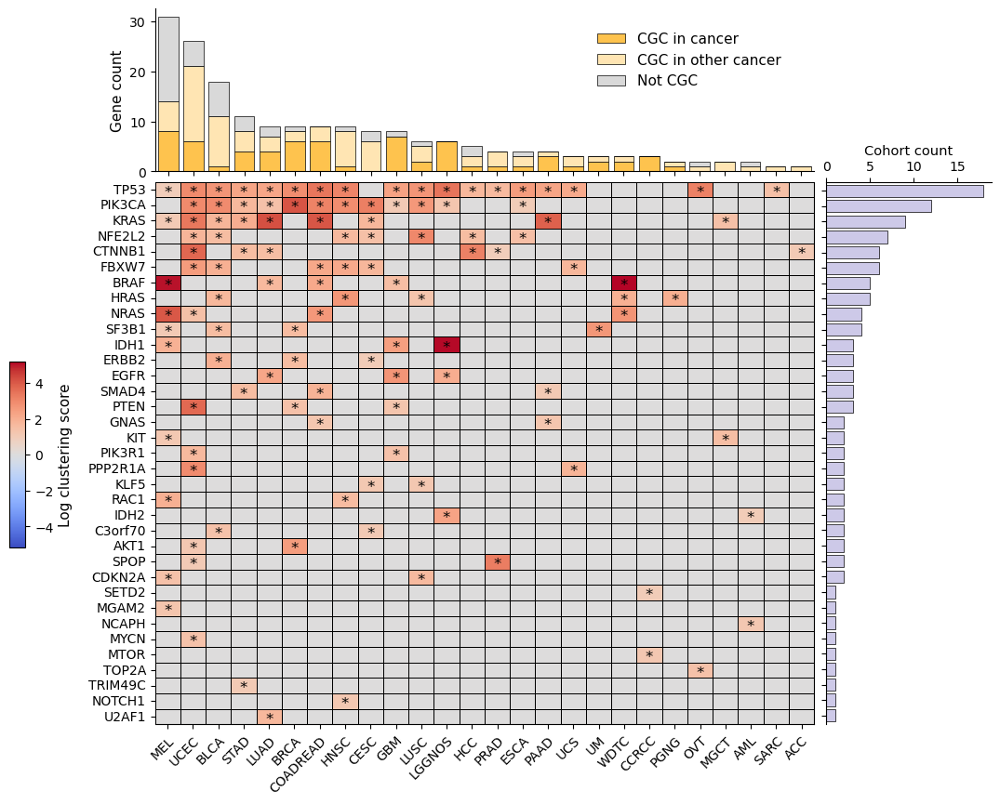

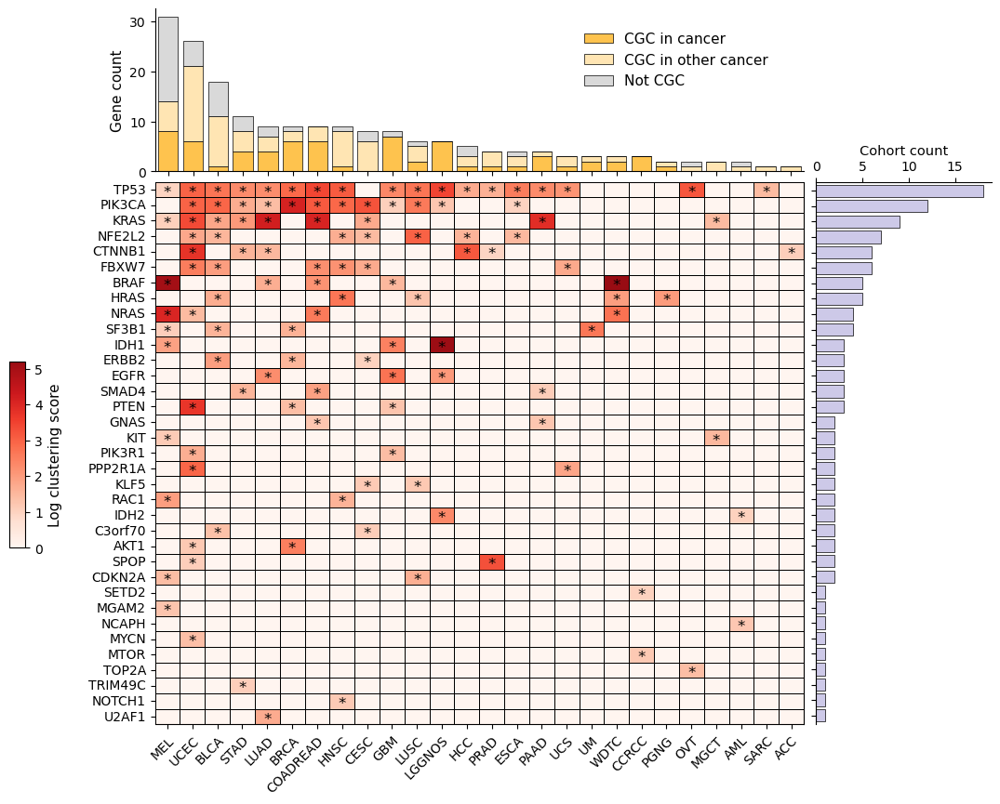

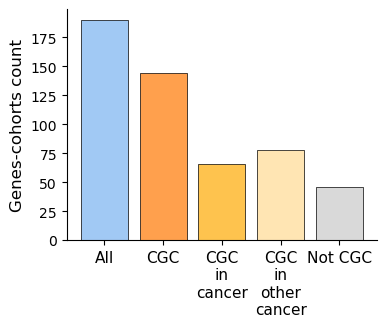

In [622]:
top_cohorts_n=None
top_genes_n=35

o3d_output = get_anomaly_df(genetable_subset, o3d_output_dir)
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                             cohort_df, 
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             anomaly_dict=anomaly_dict,
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict)

df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               df_anomaly=df_anomaly,
               figsize=(11.6,10),
               width_ratios=[1, 0.25],
               height_ratios=[0.3, 1],
               legend_box=(-0.2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.03,
               divergent_palette=True,
               plot_cgc_specific=True)

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               df_anomaly=df_anomaly,
               figsize=(11.6,10),
               width_ratios=[1, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-0.2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.03,
               filename="landscape_heatmap_tcga.png",
               plot_cgc_specific=True)


# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

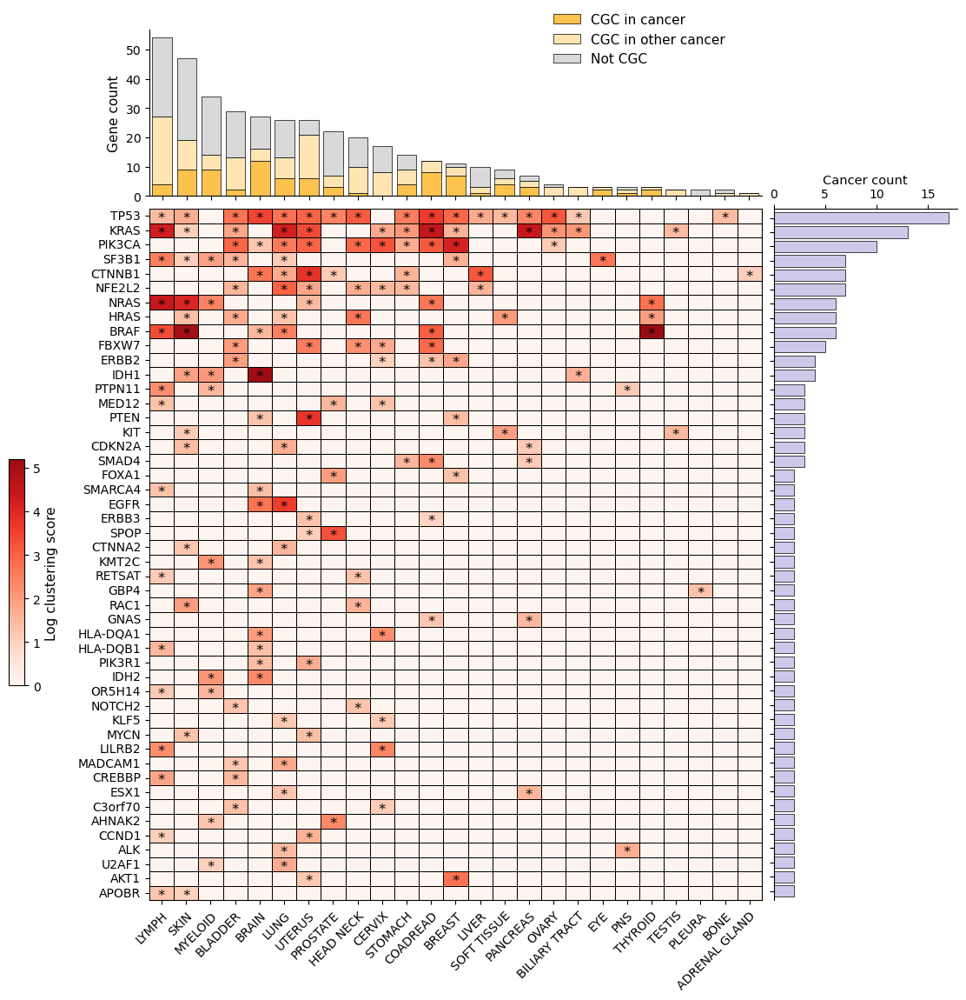

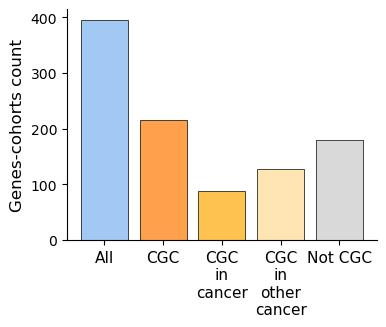

In [623]:
top_cohorts_n=None
top_genes_n=48 

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()

anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             anomaly_dict=anomaly_dict,
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

# Landscape
plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               df_anomaly=df_anomaly,
               figsize=(12,13),
               width_ratios=[1, 0.3],
               height_ratios=[0.24, 1],
               legend_box=(-0.2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")
    

# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

### Annotated landscape with fixed gene sorting

In [1042]:
def get_gene_cohorts_binary(genetable_df, 
                            cohort_df, 
                            o3d_output_dir,
                            top_cohorts_n=None, 
                            top_genes_n=None, 
                            rm_empty_cols=True,
                            log_score=True,
                            cgc_df=None, 
                            cohorts_parent_dict=None,
                            grouped_by_cancer=False,
                            sort_by_score_only=False):

    # Get hits df and clustering score info
    hits_df = get_hits(genetable_df)
    o3d_output = get_anomaly_df(genetable_df, o3d_output_dir)

    # Count by general cancer
    if grouped_by_cancer:
        o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
        o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()
        anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                                  o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                                  o3d_output["Clustering_score"].values)}
        max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)
        target_col = "General_cancer"
        
    # Count by cohort
    else:
        o3d_output = get_anomaly_df(genetable_df, o3d_output_dir)
        anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                                  o3d_output["Cohort"].values, 
                                                                                  o3d_output["Clustering_score"].values)}
        max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)
        target_col = "Cohort"

    hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
    cols_to_drop = ["Uniprot_ID", "Cancer", "Fish"]
    if grouped_by_cancer:
        cols_to_drop.append("Cohort")
    hits_df = hits_df.drop(columns=cols_to_drop).drop_duplicates().reset_index(drop=True)
    
    # Get count of cancer a gene has been detected as significant across all cohorts
    gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D")
    gene_hits_count = gene_hits_count.merge(max_score_df[["Gene", "Clustering_score"]], on="Gene", how="left")
    if sort_by_score_only:
        gene_hits_count = gene_hits_count.sort_values('Clustering_score', ascending=False).set_index("Gene")
    else:
        gene_hits_count = gene_hits_count.sort_values(by=['Oncodrive3D', 'Clustering_score'], ascending=[False, False]).set_index("Gene")
    # For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
    cohort_hits_count = hits_df.groupby(target_col).apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False)
    
    if top_genes_n is None:
        top_genes_n = len(gene_hits_count)
    if top_cohorts_n is None:
        top_cohorts_n = len(cohort_hits_count)
    top_genes = gene_hits_count[:top_genes_n].index
    top_cohorts = cohort_hits_count[:top_cohorts_n].index

    # Get df anomaly and binary
    df_anomaly = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    df_binary = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    for cohort in top_cohorts:
        genes = hits_df[hits_df[target_col] == cohort].Gene.values
        genes = [gene for gene in genes if gene in df_anomaly.columns]
        # Df anomaly
        scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
        df_anomaly.loc[cohort, genes] = scores
        # Df binary
        df_binary.loc[cohort, genes] = 1

    df_anomaly = df_anomaly.T 
    df_binary = df_binary.T 
    if len(cohort_df) == 1:
        df_anomaly = df_anomaly.loc[hits_df.Gene]
        df_binary = df_binary.loc[hits_df.Gene]
        
    if rm_empty_cols:
        df_anomaly = df_anomaly.loc[:, ~(df_anomaly == 0).all()]
        df_binary = df_binary.loc[:, ~(df_binary == False).all()]

    gene_hits_count = gene_hits_count.loc[df_anomaly.index]
    cohort_hits_count = cohort_hits_count.loc[[cohort for cohort in cohort_hits_count.index if cohort in df_anomaly.columns]]

    return df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count


def plot_landscape(df, 
                   gene_colors, 
                   lut, 
                   gene_hits_count, 
                   cohort_hits_count,
                   colors_dict,
                   names_dict,
                   annot_df,
                   df_anomaly=None,
                   figsize=(16,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   ax6_margin=0.018,
                   ax6_xmargin=0.07,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   divergent_palette=False,
                   color_gene=False,
                   plot_cgc_specific=False,
                   right_ax_ylabel="Cohort count"):
    
    if df_anomaly is not None:
        df_binary = df
        df = df_anomaly
        cmap = "vlag"
        cmap = create_custom_colormap()
    else:
        colors = ["lightgray", "gray"] 
        cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))
    if divergent_palette:
        cmap = sns.color_palette("coolwarm", as_cmap=True)
    
    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    #col_labels = [ctype_dict[cohort] for cohort  in col_labels]
    
    gene_sums = gene_hits_count["Oncodrive3D"].values
    cohort_sums = cohort_hits_count["Oncodrive3D"].values
    
    if plot_cgc_specific:
        cgc_specific = cohort_hits_count["CGC_specific"].values
        cgc_not_specific = cohort_hits_count["CGC_not_specific"].values
        not_cgc = cohort_hits_count["Not_CGC"].values  
    else:
        cgc = cohort_hits_count["CGC"].values
        not_cgc = cohort_hits_count["Not_CGC"].values
    
    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, 4, 
                           figsize=figsize, 
                           gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios})
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,3]
    ax5 = ax[0,2]
    ax6 = ax[1,1]
    ax7 = ax[0,3]
    ax8 = ax[1,2]
    
    # Create the heatmap
    if df_anomaly is not None and divergent_palette:
        vmax = df_anomaly.max().max()
        vmin = -vmax
    else:
        vmax, vmin = None, None
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black", vmax=vmax, vmin=vmin)
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    
    # Add bars for the right axis
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5)
    ax4.set_yticks(np.arange(len(gene_sums)))
    ax4.set_yticklabels([])
    ax4.set_xlabel(right_ax_ylabel, fontsize=10.5)
    ax4.invert_yaxis()
    
    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)


    # Add annotation track
    # ====================
    lst_dbs = ["cgc", "oncokb", "msk_impact", "fondone", "vogelstein", "intogen"]
    lst_methods = ["hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
    
    genes = annot_df['Gene']
    annot_methods_df = annot_df.copy()[lst_methods]
    annot_df = annot_df[lst_dbs]
    
    # Loop through each column
    indices = annot_df.index.tolist()
    ax6.scatter([0] * len(indices), indices, color="white")
    for j, col in enumerate(annot_df.columns):
        # Get the indices where the value is 1
        indices = annot_df.index[annot_df[col] == 1].tolist()
        ax6.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    ax6.set_yticks(np.arange(len(gene_sums)))
    ax6.set_yticklabels([])
    ax6.set_xticks(range(len(annot_df.columns)))
    ax6.set_xticklabels([names_dict[col] for col in annot_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    ax6.invert_yaxis()
    ax6.xaxis.tick_top()
    ax6.xaxis.set_label_position('top')


    # Annotation Intogen methods
    # ==========================
    
    # Loop through each column
    indices = annot_methods_df.index.tolist()
    ax8.scatter([0] * len(indices), indices, color="white")
    for j, col in enumerate(annot_methods_df.columns):
        indices = annot_methods_df.index[annot_methods_df[col] == 1].tolist()
        ax8.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    ax8.set_yticks(np.arange(len(gene_sums)))
    ax8.set_yticklabels([])
    ax8.set_xticks(range(len(annot_methods_df.columns)))
    ax8.set_xticklabels([names_dict[col] for col in annot_methods_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    ax8.invert_yaxis()
    
    ax8.xaxis.tick_top()
    ax8.xaxis.set_label_position('top')

    
    # Add bars for the top axis 
    # =========================

    if plot_cgc_specific: 
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, 
                color="#fec34e", edgecolor='black', label='CGC in cancer', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_not_specific, bottom=cgc_specific, 
                color="#ffe5b3", edgecolor='black', label='CGC in other cancer', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), not_cgc, bottom=np.array(cgc_specific) + np.array(cgc_not_specific), 
                color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)
    else:
        ax1.bar(np.arange(len(cohort_hits_count)), cgc, color="#ffbb80", edgecolor='black', label='CGC', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, bottom=cgc, color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)
    ax1.set_xticks(np.arange(len(cohort_sums)))
    ax1.set_ylabel("Gene count", fontsize=11)
    ax1.set_xticklabels([])
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    
    # Details
    # =======
    
    ax2.remove()
    ax5.remove()
    ax7.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    ax1.margins(x=ax1_margin, tight=True)
    ax4.margins(y=ax4_margin, tight=True)
    ax6.margins(y=ax6_margin, x=ax6_xmargin, tight=True)
    ax8.margins(y=ax6_margin, x=ax6_xmargin, tight=True)
    
    handles, labels = ax3.get_legend_handles_labels()
    if intogen_label:
        handles.append(mpatches.Patch(facecolor=lut["Detected"], edgecolor="black", label='Detected', lw=0.5))
        handles.append(mpatches.Patch(facecolor=lut["Not detected"], edgecolor="black", label="Not detected", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, 
                            title="Detected in IntOGen", title_fontsize=11, fontsize=11)
    elif plot_cgc_specific:
        handles.append(mpatches.Patch(facecolor="#fec34e", edgecolor="black", label='CGC in cancer', lw=0.5))
        handles.append(mpatches.Patch(facecolor="#ffe5b3", edgecolor="black", label="CGC in other cancer", lw=0.5))
        handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    else:
        handles.append(mpatches.Patch(facecolor="#ffbb80", edgecolor="black", label='CGC', lw=0.5))
        handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    if color_gene:
        for i, label in enumerate(ax3.get_yticklabels()):
            label.set_color(gene_colors[i])
        for text in legend.get_texts():
            text.set_color(lut[text.get_text()])
    
    if df_anomaly is not None:
        # Cbar
        cbar_ax = fig.add_axes(cbar_loc) 
        cbar = fig.colorbar(ax3.collections[0], cax=cbar_ax)
        cbar.set_label('Log clustering score', fontsize=11) 
        
        # Overlay stars on top of the heatmap
        for i in range(len(row_labels)):
            for j in range(len(col_labels)):
                if df_binary.iloc[i, j] == 1:
                    ax3.text(j + 0.5, i + 0.65, '*', ha='center', va='center', fontsize=12, color='black')
           
        # Overlay ^ for IntOGen hits
        if intogen_label_table is not None:   
            for i in range(len(row_labels)):
                for j in range(len(col_labels)):
                    if intogen_label_table.iloc[i, j] == 1:
                        ax3.text(j + 0.5, i + 0.65, '^', ha='center', va='top', fontsize=12, color='black')

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()


def get_annot_gene_df(genes_lst,
                      genetable_df,
                      intogen_drivers_df, 
                      oncokb_df, 
                      cgc_df, 
                      alpha = 0.01,
                      lst_methods = ["hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]):

    genes = pd.Series(genes_lst)
    
    unique_hits_dict = {}
    unique_hits_dict["cgc"] = cgc_df["Gene Symbol"].values
    unique_hits_dict["oncokb"] = oncokb_df.loc[oncokb_df["OncoKB Annotated"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["msk_impact"] = oncokb_df.loc[oncokb_df["MSK-IMPACT"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["msk_heme"] = oncokb_df.loc[oncokb_df["MSK-HEME"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["fondone"] = oncokb_df.loc[oncokb_df["FOUNDATION ONE"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["fondone_heme"] = oncokb_df.loc[oncokb_df["FOUNDATION ONE HEME"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["vogelstein"] = oncokb_df.loc[oncokb_df["Vogelstein"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["intogen"] = intogen_drivers_df.SYMBOL.values
    
    # Get unique hits for each method in Intogen and O3D
    for method in lst_methods:
        unique_hits_dict[method] = genetable_df[genetable_df[f"{method}_qval"] < alpha].Gene.unique()
    
    # Get df
    annot_df = {}
    annot_df["Gene"] = genes
    for annot in unique_hits_dict.keys():
        annot_df[annot] = genes.isin(unique_hits_dict[annot]).astype(int)
    
    return pd.DataFrame(annot_df)

In [1043]:
colors_dict = {"Oncodrive3D" : "#ffad48", 
              "HotMAPS" : "#024b79", 
              "OncodriveCLUSTL" : "#43b7c2", 
              "smRegions" : "#c2f1ce", 
              "CBaSE" : "#ffb8b3", 
              "SEISMIC" : "#ede5ff", 
              "dNdScv" : "#edd7c5", 
              "MutPanning" : "#cee4d8", 
              "OncodriveFML" : "#bbd9f6",
              "IntOGen" : "#A6D854",
              "OncoKB" : "#66C2A5",
              "CGC" : "#FFA04D",
              "MSK-IMPACT" : "#FB9A99",
              "MSK-IMPACT Heme" : "#E31A1C",
              "FoundationOne" : "#CAB2D6",
              "FoundationOne Heme" : "#6A3D9A",
              "Vogelstein" : "#E5C494"}

names_dict = {"o3d" : "Oncodrive3D", 
             "hotmaps" : "HotMAPS", 
             "clustl" : "OncodriveCLUSTL", 
             "smreg" : "smRegions", 
             "cbase" : "CBaSE", 
             "seismic" : "SEISMIC", 
             "dndscv" : "dNdScv", 
             "mutpan" : "MutPanning", 
             "fml" : "OncodriveFML",
             "intogen" : "IntOGen",
             "oncokb" : "OncoKB",
             "cgc" : "CGC",
             "msk_impact" : "MSK-IMPACT",
             "msk_heme" : "MSK-IMPACT Heme",
             "fondone" : "FoundationOne",
             "fondone_heme" : "FoundationOne Heme", 
             "vogelstein" : "Vogelstein"}

annot_cols = ["Gene", 
              "cgc", 
              "oncokb", 
              "msk_impact", 
              "fondone", 
              "vogelstein", 
              "intogen", 
              "hotmaps", 
              "clustl", 
              "smreg", 
              "cbase",
              "dndscv", 
              "mutpan", 
              "fml"]

/tmp/jobs/spellegrini/9964934/ipykernel_20268/917191271.py:33: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)


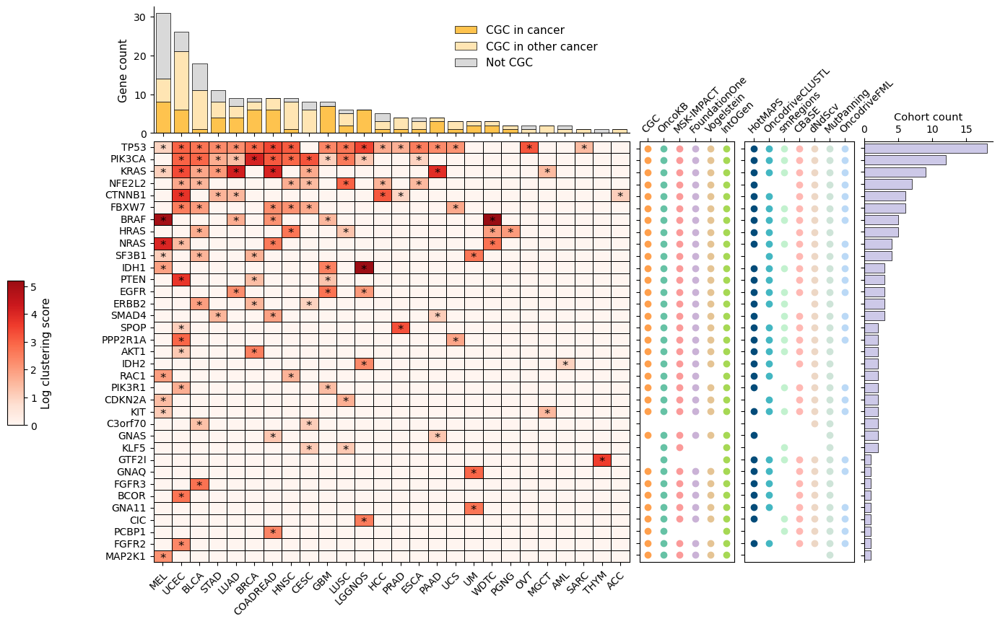

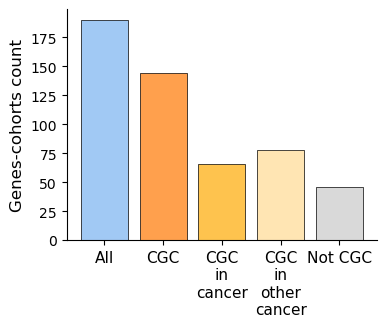

In [626]:
top_cohorts_n=None
top_genes_n=35

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=False)

df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable_subset, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(15,10),
               width_ratios=[1, 0.2, 0.23, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.03,
               filename="landscape_heatmap_tcga.png",
               plot_cgc_specific=True)


# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

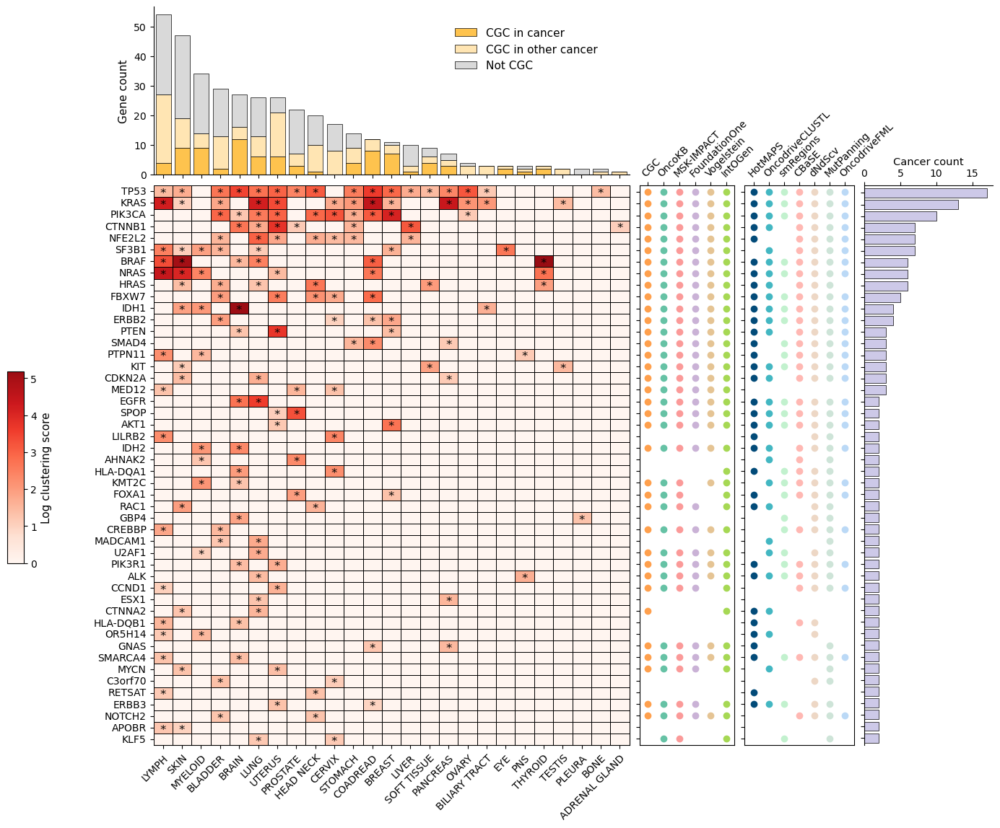

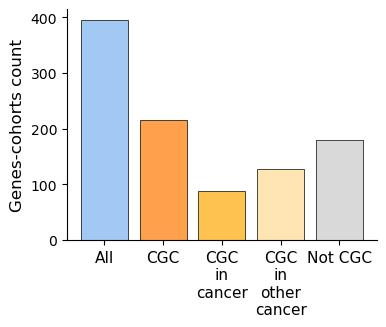

In [627]:
top_cohorts_n=None
top_genes_n=48

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(15,13.3),
               width_ratios=[1, 0.2, 0.23, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.012,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count",
               filename="landscape_heatmap.png",)

# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

### Sort by max score and add max score track

In [1048]:
def plot_landscape(df, 
                   gene_hits_count, 
                   cohort_hits_count,
                   colors_dict,
                   names_dict,
                   annot_df,
                   df_anomaly=None,
                   figsize=(15,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   ax6_margin=0.018,
                   ax6_xmargin=0.07,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   plot_max_score=False,
                   right_ax_ylabel="Cohort count"):
    

    df_binary = df
    df = df_anomaly
    cmap = create_custom_colormap()
    
    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    #col_labels = [ctype_dict[cohort] for cohort  in col_labels]
    
    gene_sums = gene_hits_count["Oncodrive3D"].values
    cohort_sums = cohort_hits_count["Oncodrive3D"].values
    
    cgc_specific = cohort_hits_count["CGC_specific"].values
    cgc_not_specific = cohort_hits_count["CGC_not_specific"].values
    not_cgc = cohort_hits_count["Not_CGC"].values  

    ncols = 5 if plot_max_score else 4
    
    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, ncols, 
                           figsize=figsize, 
                           gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios})
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,3]
    ax5 = ax[0,2]
    ax6 = ax[1,1]
    ax7 = ax[0,3]
    ax8 = ax[1,2]
    ax9 = ax[0,4] if plot_max_score else None
    ax10 = ax[1,4] if plot_max_score else None
    
    # Create the heatmap
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black")
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)

    
    # Add counts of cohort or cancer for each gene
    # ============================================
    
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5)
    ax4.set_yticks(np.arange(len(gene_sums)))
    ax4.set_yticklabels([])
    ax4.set_xlabel(right_ax_ylabel, fontsize=10.5)
    ax4.invert_yaxis()
    
    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)

    
    # Add max score track
    # ===================
    max_scores = np.log(gene_hits_count["Clustering_score"])
    norm = Normalize(vmin=df_anomaly.min().min(), vmax=df_anomaly.max().max())
    colors = cmap(norm(max_scores))

    
    ax10.barh(np.arange(len(gene_sums)), max_scores, color=colors, edgecolor="black", lw=0.5)
    ax10.set_yticks(np.arange(len(gene_sums)))
    ax10.set_yticklabels([])
    ax10.set_xlabel("Max log\nclustering score", fontsize=10.5)
    ax10.invert_yaxis()
    
    ax10.xaxis.tick_top()
    ax10.xaxis.set_label_position('top')
    ax10.spines['bottom'].set_visible(False)
    ax10.spines['right'].set_visible(False)

    
    # Add annotation track
    # ====================
    lst_dbs = ["cgc", "oncokb", "msk_impact", "fondone", "vogelstein", "intogen"]
    lst_methods = ["hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
    
    genes = annot_df['Gene']
    annot_methods_df = annot_df.copy()[lst_methods]
    annot_df = annot_df[lst_dbs]
    
    # Loop through each column
    indices = annot_df.index.tolist()
    ax6.scatter([0] * len(indices), indices, color="white")
    for j, col in enumerate(annot_df.columns):
        # Get the indices where the value is 1
        indices = annot_df.index[annot_df[col] == 1].tolist()
        ax6.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    ax6.set_yticks(np.arange(len(gene_sums)))
    ax6.set_yticklabels([])
    ax6.set_xticks(range(len(annot_df.columns)))
    ax6.set_xticklabels([names_dict[col] for col in annot_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    ax6.invert_yaxis()
    ax6.xaxis.tick_top()
    ax6.xaxis.set_label_position('top')


    # Annotation Intogen methods
    # ==========================
    
    # Loop through each column
    indices = annot_methods_df.index.tolist()
    ax8.scatter([0] * len(indices), indices, color="white")
    for j, col in enumerate(annot_methods_df.columns):
        indices = annot_methods_df.index[annot_methods_df[col] == 1].tolist()
        ax8.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    ax8.set_yticks(np.arange(len(gene_sums)))
    ax8.set_yticklabels([])
    ax8.set_xticks(range(len(annot_methods_df.columns)))
    ax8.set_xticklabels([names_dict[col] for col in annot_methods_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    ax8.invert_yaxis()
    
    ax8.xaxis.tick_top()
    ax8.xaxis.set_label_position('top')

    
    # Add bars for the top axis 
    # =========================

    ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, 
            color="#fec34e", edgecolor='black', label='CGC in cancer', lw=0.5)
    ax1.bar(np.arange(len(cohort_hits_count)), cgc_not_specific, bottom=cgc_specific, 
            color="#ffe5b3", edgecolor='black', label='CGC in other cancer', lw=0.5)
    ax1.bar(np.arange(len(cohort_hits_count)), not_cgc, bottom=np.array(cgc_specific) + np.array(cgc_not_specific), 
            color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)

    ax1.set_xticks(np.arange(len(cohort_sums)))
    ax1.set_ylabel("Gene count", fontsize=11)
    ax1.set_xticklabels([])
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    
    # Details
    # =======
    
    ax2.remove()
    ax5.remove()
    ax7.remove()
    if plot_max_score:
        ax9.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    ax1.margins(x=ax1_margin, tight=True)
    ax4.margins(y=ax4_margin, tight=True)
    ax6.margins(y=ax6_margin, x=ax6_xmargin, tight=True)
    ax8.margins(y=ax6_margin, x=ax6_xmargin, tight=True)
    ax10.margins(y=ax4_margin, tight=True)
    
    handles, labels = ax3.get_legend_handles_labels()
    handles.append(mpatches.Patch(facecolor="#fec34e", edgecolor="black", label='CGC in cancer', lw=0.5))
    handles.append(mpatches.Patch(facecolor="#ffe5b3", edgecolor="black", label="CGC in other cancer", lw=0.5))
    handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
    legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    
    if df_anomaly is not None:
        # Cbar
        cbar_ax = fig.add_axes(cbar_loc) 
        cbar = fig.colorbar(ax3.collections[0], cax=cbar_ax)
        cbar.set_label('Log clustering score', fontsize=11) 
        
        # Overlay stars on top of the heatmap
        for i in range(len(row_labels)):
            for j in range(len(col_labels)):
                if df_binary.iloc[i, j] == 1:
                    ax3.text(j + 0.5, i + 0.65, '*', ha='center', va='center', fontsize=12, color='black')
           
    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

#### TCGA

/tmp/jobs/spellegrini/9964934/ipykernel_20268/917191271.py:33: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)


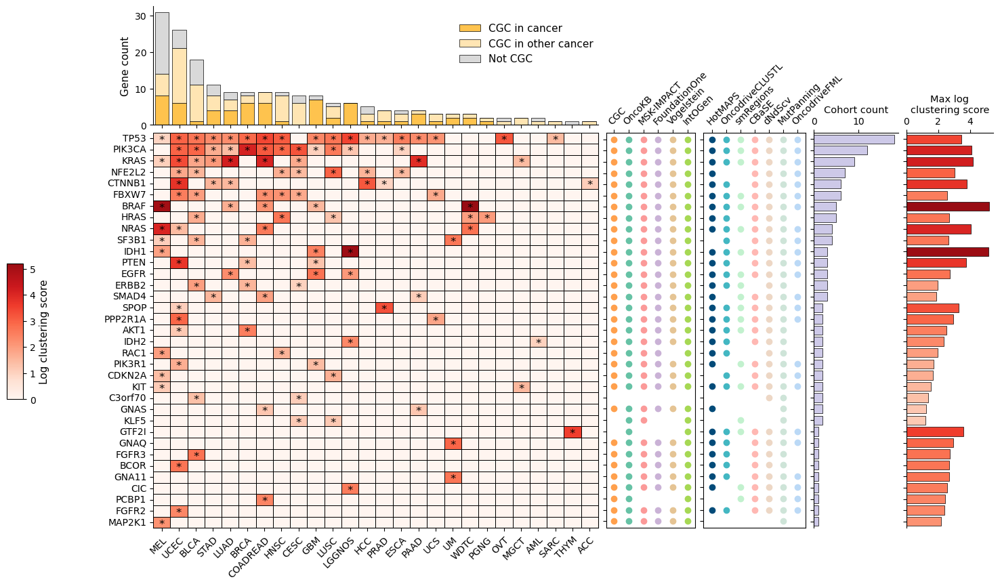

In [217]:
top_cohorts_n=None
top_genes_n=35
df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=False,
                                                                                             sort_by_score_only=False)

df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable_subset, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(16,10),
               width_ratios=[1, 0.2, 0.23, 0.19, 0.195],
               height_ratios=[0.3, 1],
               legend_box=(-3.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.03,
               plot_max_score=True)

/tmp/jobs/spellegrini/9964934/ipykernel_20268/917191271.py:33: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)


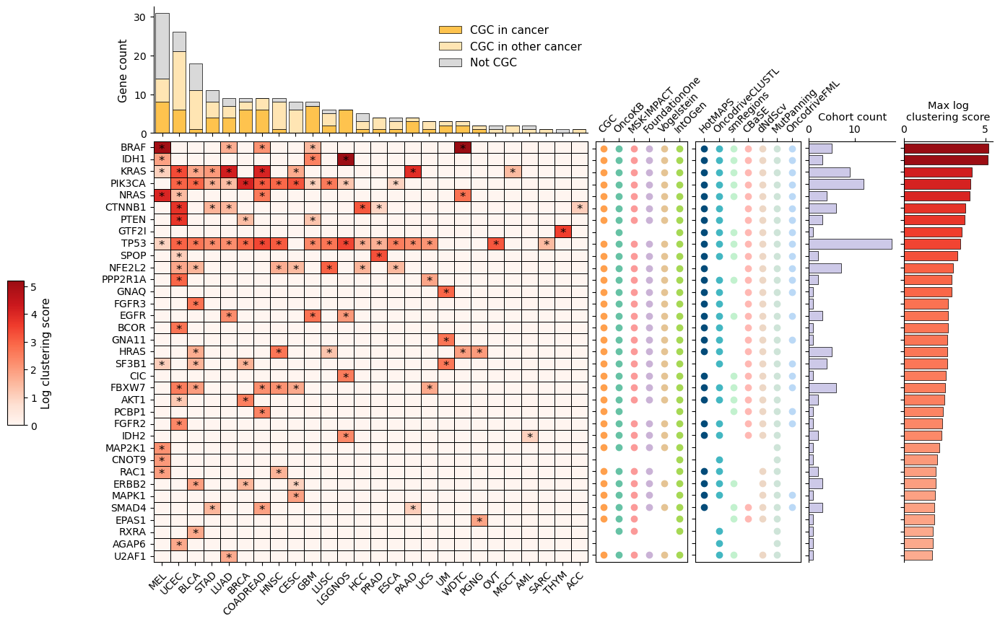

In [399]:
top_cohorts_n=None
top_genes_n=35

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=False,
                                                                                             sort_by_score_only=True)

df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable_subset, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(15,10),
               width_ratios=[0.95, 0.2, 0.23, 0.19, 0.195],
               height_ratios=[0.3, 1],
               legend_box=(-3.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.03,
               plot_max_score=True)

#### All cohorts

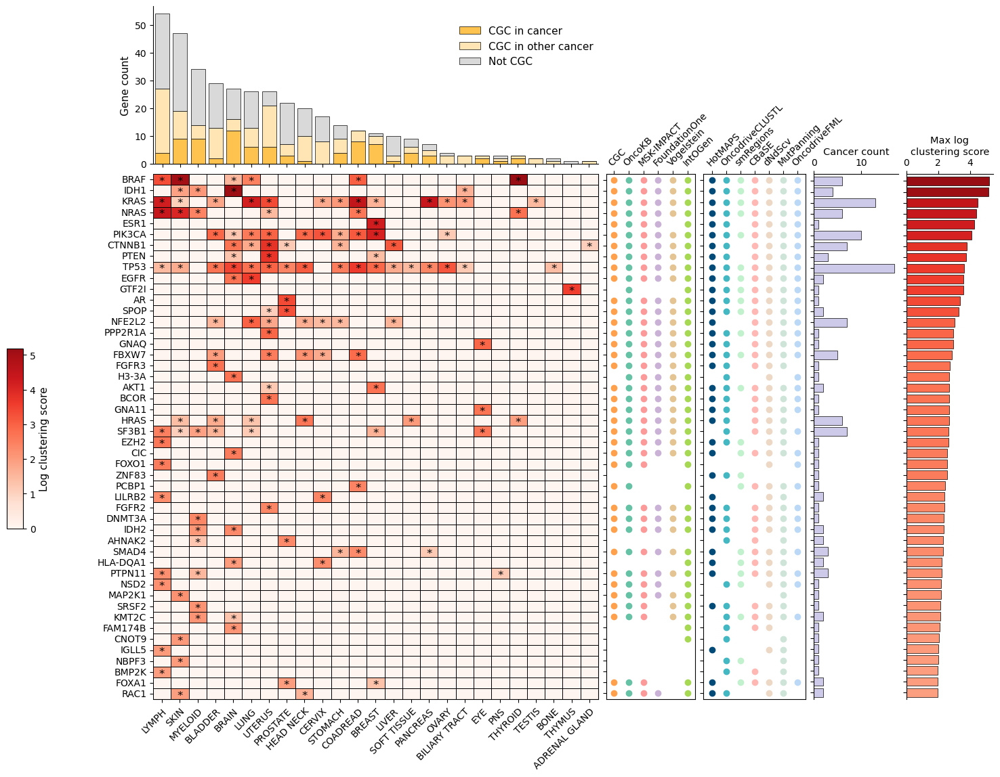

In [397]:
top_cohorts_n=None
top_genes_n=48

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True,
                                                                                             sort_by_score_only=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(16,13.3),
               width_ratios=[1, 0.2, 0.23, 0.19, 0.195],
               height_ratios=[0.3, 1],
               legend_box=(-3.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.012,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.03,
               plot_max_score=True,
               right_ax_ylabel="Cancer count",
               filename="landscape_heatmap_by_score.png",)

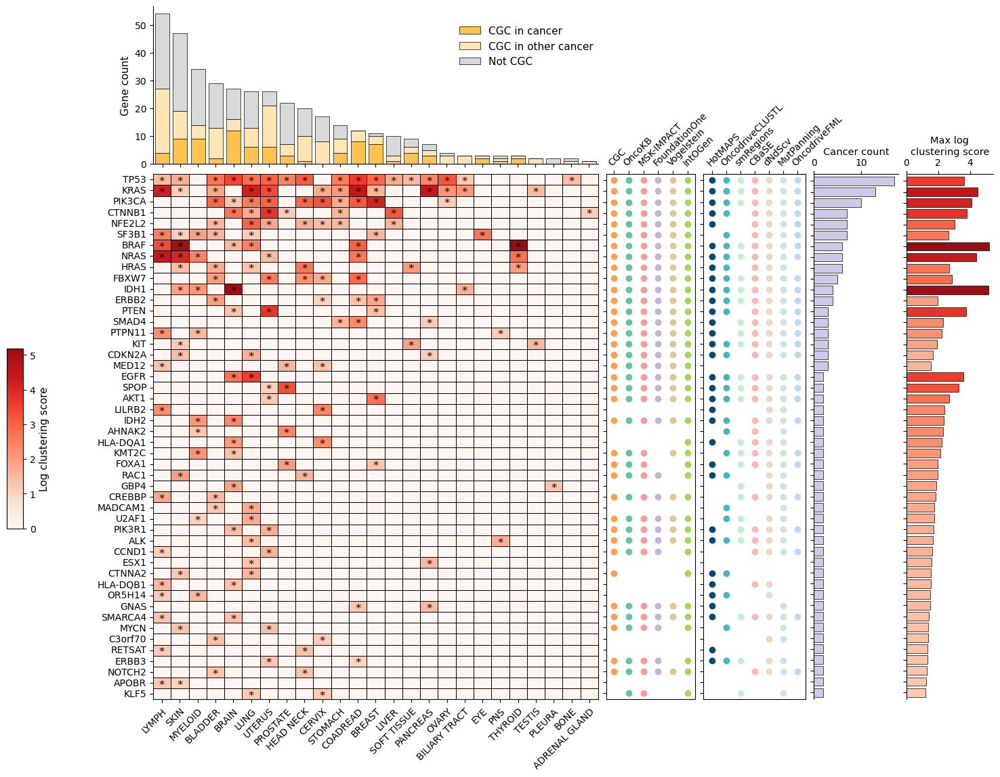

In [274]:
top_cohorts_n=None
top_genes_n=48

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True,
                                                                                             sort_by_score_only=False)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(16,13.3),
               width_ratios=[1, 0.2, 0.23, 0.19, 0.195],
               height_ratios=[0.3, 1],
               legend_box=(-3.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.012,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.03,
               plot_max_score=True,
               right_ax_ylabel="Cancer count")

### Add number of cohorts and missense mutations tracks

In [233]:
def get_hits(genetable_df, alpha=0.01):
    
    genetable_df = genetable_df[genetable_df["o3d_qval"] < 0.01]
    genetable_df = genetable_df[["Gene", "Uniprot_ID", "Cancer", "Cohort", "CGC", "Fish", "o3d_qval"]].reset_index(drop=True)
    genetable_df = genetable_df.rename(columns={"o3d_qval" : "Oncodrive3D"})
    genetable_df["Oncodrive3D"] = 1
    
    return genetable_df


def get_cgc_specific(hits_df, cgc_df, cohorts_parent_dict):

    hits_df["General_cancer"] = hits_df.Cancer.apply(lambda x: cohorts_parent_dict[x])
    hits_df["CGC_specific"] = hits_df.apply(lambda x: 
                                        x["General_cancer"] in cgc_df[cgc_df["Gene Symbol"] == x["Gene"]].GENERAL_CANCER_TYPE.values[0] 
                                        if x["CGC"] == 1 else 0, axis=1).astype(int)
    hits_df["Not_CGC"] = hits_df.apply(lambda x: 1 if x["CGC"] != 1 else 0, axis=1)
    hits_df["CGC_not_specific"] = hits_df.apply(lambda x: 1 if x["CGC"] == 1 and x["CGC_specific"] == 0 else 0, axis=1)

    return hits_df


def get_cgc_specific_count_for_ttype(hits_df_ttype):

    hits_df_ttype = hits_df_ttype[["Gene", "Oncodrive3D", "CGC_specific", "Not_CGC", "CGC_not_specific"]].drop_duplicates().reset_index(drop=True)
    hits_df_ttype = hits_df_ttype.drop(columns=["Gene"]).sum()

    return hits_df_ttype
    

def get_gene_annotation(df, genetable):
    
    cgc_genes = genetable[genetable["CGC"] == 1].Gene.unique()
    fish_genes = genetable[genetable["Fish"] == 1].Gene.unique()
    gene_annotation = ["CGC" if gene in cgc_genes else "Fishy" if gene in fish_genes else "Not annotated" for gene in df.index]
    gene_annotation = pd.Series(gene_annotation, name="Annotation")
    lut = {"CGC": '#ff7f0e', 
           "Fishy": '#2ca02c', 
           "Not annotated": '#7f7f7f',
           "Not CGC" : '#7f7f7f'}
    gene_colors = gene_annotation.map(lut)
    
    return gene_colors, lut


def get_anomaly_df(genetable_df, o3d_output_dir):
    
    lst_cohort = []
    for cohort in genetable_df.Cohort.unique():
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        df_cohort = pd.read_csv(f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv")
        df_cohort = df_cohort[["Cohort", "Gene", "Uniprot_ID", "qval", "C_gene", "C_pos", "Score_obs_sim_top_vol"]]
        df_cohort = df_cohort.dropna(subset="qval").rename(columns={"Score_obs_sim_top_vol" : "Clustering_score"})
        lst_cohort.append(df_cohort)

    anomaly_df = pd.concat(lst_cohort).reset_index(drop=True)
    anomaly_df = anomaly_df.merge(genetable_df[["Cohort", "Gene", "CGC", "Fish"]].drop_duplicates(), on=["Cohort", "Gene"], how="left")
    anomaly_df.Cohort = anomaly_df.Cohort.replace("TCGA_WXS_SOFT_TISSUE", "TCGA_WXS_SARC")
    
    return anomaly_df


def create_custom_colormap(cmap="Reds"):
    colors = sns.color_palette(cmap, as_cmap=True)
    colors = colors(np.linspace(0, 0.9, 256)) # Soften the dark color
    
    return LinearSegmentedColormap.from_list("CustomReds", colors)


def plot_o3d_cgc_hits(hits_df, filename=None):
    """
    Plot summary CGC hits of Oncodrive3D across genetable
    """
    
    s = hits_df[["Oncodrive3D", "CGC", "CGC_specific", "CGC_not_specific", "Not_CGC"]].sum()
    s.index = "All", "CGC", "CGC\nin\ncancer", "CGC\nin\nother\ncancer", "Not CGC"
    
    plt.figure(figsize=(4, 3))
    plt.bar(s.index, s.values, color=["#A1C9F4", "#ffa04d", "#fec34e", "#ffe5b3", "#d9d9d9"], edgecolor='black', lw=0.5)
    
    plt.xlabel(None)
    plt.ylabel('Genes-cohorts count', fontsize=12)
    plt.xticks(fontsize=11)
    
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()


def get_annot_gene_df(genes_lst,
                      genetable_df,
                      intogen_drivers_df, 
                      oncokb_df, 
                      cgc_df, 
                      alpha = 0.01,
                      lst_methods = ["hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]):

    genes = pd.Series(genes_lst)
    
    unique_hits_dict = {}
    unique_hits_dict["cgc"] = cgc_df["Gene Symbol"].values
    unique_hits_dict["oncokb"] = oncokb_df.loc[oncokb_df["OncoKB Annotated"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["msk_impact"] = oncokb_df.loc[oncokb_df["MSK-IMPACT"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["msk_heme"] = oncokb_df.loc[oncokb_df["MSK-HEME"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["fondone"] = oncokb_df.loc[oncokb_df["FOUNDATION ONE"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["fondone_heme"] = oncokb_df.loc[oncokb_df["FOUNDATION ONE HEME"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["vogelstein"] = oncokb_df.loc[oncokb_df["Vogelstein"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["intogen"] = intogen_drivers_df.SYMBOL.values
    
    # Get unique hits for each method in Intogen and O3D
    for method in lst_methods:
        unique_hits_dict[method] = genetable_df[genetable_df[f"{method}_qval"] < alpha].Gene.unique()
    
    # Get df
    annot_df = {}
    annot_df["Gene"] = genes
    for annot in unique_hits_dict.keys():
        annot_df[annot] = genes.isin(unique_hits_dict[annot]).astype(int)
    
    return pd.DataFrame(annot_df)

In [234]:
def get_gene_cohorts_binary(genetable_df, 
                            cohort_df, 
                            o3d_output_dir,
                            top_cohorts_n=None, 
                            top_genes_n=None, 
                            rm_empty_cols=True,
                            log_score=True,
                            cgc_df=None, 
                            cohorts_parent_dict=None,
                            grouped_by_organ=False,
                            sort_by_score_only=False,
                            genes_in_one_cohort=False):

    # Get hits df and clustering score info
    hits_df = get_hits(genetable_df)
    o3d_output = get_anomaly_df(genetable_df, o3d_output_dir)

    # Count of mut
    cohort_mut_count = get_cohort_mut_count(cohort_df, o3d_output_dir)
    cohort_mut_count["Cohort"] = cohort_mut_count.Cohort.replace("TCGA_WXS_SOFT_TISSUE", "TCGA_WXS_SARC")

    # Count by general cancer
    if grouped_by_organ:
        o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
        o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()
        anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                                  o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                                  o3d_output["Clustering_score"].values)}
        max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)
        target_col = "General_cancer"
        
    # Count by cohort
    else:
        o3d_output = get_anomaly_df(genetable_df, o3d_output_dir)
        anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                                  o3d_output["Cohort"].values, 
                                                                                  o3d_output["Clustering_score"].values)}
        max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)
        target_col = "Cohort"

    hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)

    # Mut count
    cols_to_drop = ["Uniprot_ID", "Cancer", "Fish"]
    if grouped_by_organ:
        cohort_mut_count["Cohort_count"] = 1
        cohort_mut_count = cohort_mut_count.groupby("General_cancer").sum()
        cols_to_drop.append("Cohort")
    else:
        cohort_mut_count = cohort_mut_count.set_index("Cohort")
        
    hits_df = hits_df.drop(columns=cols_to_drop).drop_duplicates().reset_index(drop=True)
    
    # Get count of cancer a gene has been detected as significant across all cohorts
    gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D")
    gene_hits_count = gene_hits_count.merge(max_score_df[["Gene", "Clustering_score"]], on="Gene", how="left")
    if sort_by_score_only:
        gene_hits_count = gene_hits_count.sort_values('Clustering_score', ascending=False).set_index("Gene")
    else:
        gene_hits_count = gene_hits_count.sort_values(by=['Oncodrive3D', 'Clustering_score'], ascending=[False, False]).set_index("Gene")
    if genes_in_one_cohort:
        gene_hits_count = gene_hits_count[gene_hits_count["Oncodrive3D"] == 1]
    # For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
    cohort_hits_count = hits_df.groupby(target_col).apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False)
    # Add mut count
    cohort_hits_count = cohort_hits_count.merge(cohort_mut_count, left_index=True, right_index=True)
    
    if top_genes_n is None:
        top_genes_n = len(gene_hits_count)
    if top_cohorts_n is None:
        top_cohorts_n = len(cohort_hits_count)
    top_genes = gene_hits_count[:top_genes_n].index
    top_cohorts = cohort_hits_count[:top_cohorts_n].index

    # Get df anomaly and binary
    df_anomaly = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    df_binary = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    for cohort in top_cohorts:
        genes = hits_df[hits_df[target_col] == cohort].Gene.values
        genes = [gene for gene in genes if gene in df_anomaly.columns]
        # Df anomaly
        scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
        df_anomaly.loc[cohort, genes] = scores
        # Df binary
        df_binary.loc[cohort, genes] = 1

    df_anomaly = df_anomaly.T 
    df_binary = df_binary.T 
    if len(cohort_df) == 1:
        df_anomaly = df_anomaly.loc[hits_df.Gene]
        df_binary = df_binary.loc[hits_df.Gene]
        
    if rm_empty_cols:
        df_anomaly = df_anomaly.loc[:, ~(df_anomaly == 0).all()]
        df_binary = df_binary.loc[:, ~(df_binary == False).all()]

    gene_hits_count = gene_hits_count.loc[df_anomaly.index]
    cohort_hits_count = cohort_hits_count.loc[[cohort for cohort in cohort_hits_count.index if cohort in df_anomaly.columns]]

    return df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count


def get_cohort_mut_count(cohorts_df, o3d_output_dir):

    lst_rows = []

    for cohort, ttype in cohort_df[["COHORT", "GENERAL_CANCER_TYPE"]].values:
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        path_csv = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv"
        if os.path.exists(path_csv):
            df_o3d = pd.read_csv(path_csv)
            mut, clust_mut = df_o3d[["Mut_in_gene", "Clust_mut"]].sum().values
            lst_rows.append((cohort, ttype, mut, clust_mut))
        else:
            print(f"Path doesn't exist: {path_csv}")

    return pd.DataFrame(lst_rows, columns=["Cohort", "General_cancer", "Mut", "Clust_mut"]).astype({"Mut" : int, "Clust_mut" : int})

In [235]:
def plot_landscape(df, 
                   gene_hits_count, 
                   cohort_hits_count,
                   colors_dict,
                   names_dict,
                   annot_df,
                   df_anomaly=None,
                   figsize=(15,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   ax6_margin=0.018,
                   ax6_xmargin=0.07,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   plot_max_score=False,
                   plot_cohort_count_top=False,
                   plot_cohort_count_right=True,
                   log_mut_count=True,
                   grouped_by_organ=False):
    

    df_binary = df
    df = df_anomaly
    cmap = create_custom_colormap()
    
    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    #col_labels = [ctype_dict[cohort] for cohort  in col_labels]
    
    gene_sums = gene_hits_count["Oncodrive3D"].values
    cohort_sums = cohort_hits_count["Oncodrive3D"].values
    
    cgc_specific = cohort_hits_count["CGC_specific"].values
    cgc_not_specific = cohort_hits_count["CGC_not_specific"].values
    not_cgc = cohort_hits_count["Not_CGC"].values  

    ncols = 5 if plot_max_score else 4
    nrows = 4
    
    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(nrows, ncols, 
                           figsize=figsize, 
                           gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios})
    ax1 = ax[2,0]
    ax2 = ax[2,1]
    ax3 = ax[3,0]
    ax4 = ax[3,3]
    ax5 = ax[2,2]
    ax6 = ax[3,1]
    ax7 = ax[2,3]
    ax8 = ax[3,2]
    ax9 = ax[2,4] if plot_max_score else None
    if plot_cohort_count_right:
        if plot_max_score:
            ax10 = ax[3,4]
        else:
            ax10 = None
        # ax10 = ax[3,4] if plot_max_score else None
    else:
        if plot_max_score:
            ax[3,4].remove()
            ax10 = ax4
        else:
            ax10 = None
        # ax10 = ax4 if plot_max_score else None
    ax11 = ax[1,0]
    ax12 = ax[0,0]

    n = 0 if plot_max_score else 1
    for i in range(2):
        for j in range(1, 5-n):
            ax[i,j].remove()

    
    # Create the heatmap
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black")
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)

    
    # Add counts of cohort or organ for each gene
    # ============================================
    
    if grouped_by_organ:
        ax4_ylabel = "Organs count"
        cancer_or_organ = "organ"
    else:
        ax4_ylabel = "Cohorts count"
        cancer_or_organ = "cancer"
    if plot_cohort_count_right:
        ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5)
        ax4.set_yticks(np.arange(len(gene_sums)))
        ax4.set_yticklabels([])
        ax4.set_xlabel(ax4_ylabel, fontsize=10.5)
        ax4.invert_yaxis()
        
        ax4.xaxis.tick_top()
        ax4.xaxis.set_label_position('top')
        ax4.spines['bottom'].set_visible(False)
        ax4.spines['right'].set_visible(False)

    
    # Add max score track
    # ===================
    
    if plot_max_score:
        max_scores = np.log(gene_hits_count["Clustering_score"])
        norm = Normalize(vmin=df_anomaly.min().min(), vmax=df_anomaly.max().max())
        colors = cmap(norm(max_scores))
    
        
        ax10.barh(np.arange(len(gene_sums)), max_scores, color=colors, edgecolor="black", lw=0.5)
        ax10.set_yticks(np.arange(len(gene_sums)))
        ax10.set_yticklabels([])
        ax10.set_xlabel("Max log\nclustering score", fontsize=10.5)
        ax10.invert_yaxis()
        
        ax10.xaxis.tick_top()
        ax10.xaxis.set_label_position('top')
        ax10.spines['bottom'].set_visible(False)
        ax10.spines['right'].set_visible(False)

    
    # Add annotation track
    # ====================
    lst_dbs = ["cgc", "oncokb", "msk_impact", "fondone", "vogelstein", "intogen"]
    lst_methods = ["hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
    
    genes = annot_df['Gene']
    annot_methods_df = annot_df.copy()[lst_methods]
    annot_df = annot_df[lst_dbs]
    
    # Loop through each column
    indices = annot_df.index.tolist()
    ax6.scatter([0] * len(indices), indices, color="white")
    for j, col in enumerate(annot_df.columns):
        # Get the indices where the value is 1
        indices = annot_df.index[annot_df[col] == 1].tolist()
        ax6.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    ax6.set_yticks(np.arange(len(gene_sums)))
    ax6.set_yticklabels([])
    ax6.set_xticks(range(len(annot_df.columns)))
    ax6.set_xticklabels([names_dict[col] for col in annot_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    ax6.invert_yaxis()
    ax6.xaxis.tick_top()
    ax6.xaxis.set_label_position('top')


    # Annotation Intogen methods
    # ==========================
    
    # Loop through each column
    indices = annot_methods_df.index.tolist()
    ax8.scatter([0] * len(indices), indices, color="white")
    for j, col in enumerate(annot_methods_df.columns):
        indices = annot_methods_df.index[annot_methods_df[col] == 1].tolist()
        ax8.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    ax8.set_yticks(np.arange(len(gene_sums)))
    ax8.set_yticklabels([])
    ax8.set_xticks(range(len(annot_methods_df.columns)))
    ax8.set_xticklabels([names_dict[col] for col in annot_methods_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    ax8.invert_yaxis()
    
    ax8.xaxis.tick_top()
    ax8.xaxis.set_label_position('top')

    
    # Add bars for the top axis 
    # =========================

    ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, 
            color="#fec34e", edgecolor='black', label=f'CGC in {cancer_or_organ}', lw=0.5)
    ax1.bar(np.arange(len(cohort_hits_count)), cgc_not_specific, bottom=cgc_specific, 
            color="#ffe5b3", edgecolor='black', label=f'CGC in other {cancer_or_organ}', lw=0.5)
    ax1.bar(np.arange(len(cohort_hits_count)), not_cgc, bottom=np.array(cgc_specific) + np.array(cgc_not_specific), 
            color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)

    ax1.set_xticks(np.arange(len(cohort_sums)))
    ax1.set_ylabel("Genes count", fontsize=11)
    ax1.set_xticklabels([])
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)


    # Add mut count
    # =============
    
    mut_count = cohort_hits_count["Mut"].values     
    if log_mut_count:
        ax11_ylabel = "Log mut\ncount" if plot_cohort_count_top else "Log mut count"
        mut_count = np.log(mut_count)
    else:
        ax11_ylabel = "Mutations count"
    ax11.bar(np.arange(len(cohort_hits_count)), mut_count, 
         color="#BDD7E7", edgecolor='black', lw=0.5)
    # mut_count = cohort_hits_count["Mut"].values
    # clust_mut_count = cohort_hits_count["Clust_mut"].values
    # mut_count -= clust_mut_count
    # ax11.bar(np.arange(len(cohort_hits_count)), mut_count, 
    #         color="#fec34e", edgecolor='black', label='Missense mutations', lw=0.5)
    # ax11.bar(np.arange(len(cohort_hits_count)), clust_mut_count, bottom=mut_count, 
    #         color="#ffe5b3", edgecolor='black', label='Mutations in clusters', lw=0.5)

    ax11.set_xticks(np.arange(len(cohort_sums)))
    ax11.set_ylabel(ax11_ylabel, fontsize=11)
    ax11.set_xticklabels([])
    ax11.spines['top'].set_visible(False)
    ax11.spines['right'].set_visible(False)


    # Add cohort count
    # ================
    
    if plot_cohort_count_top:
        ax12.bar(np.arange(len(cohort_hits_count)), cohort_hits_count["Cohort_count"].values, 
             color="#c7eaea", edgecolor='black', lw=0.5)
        ax12.set_xticks(np.arange(len(cohort_sums)))
        ax12.set_ylabel("Cohorts count", fontsize=11)
        ax12.set_xticklabels([])
        ax12.spines['top'].set_visible(False)
        ax12.spines['right'].set_visible(False)
    else:
        ax12.remove()
    
    
    # Details
    # =======
    
    ax2.remove()
    ax5.remove()
    ax7.remove()
    if plot_max_score:
        ax9.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    ax1.margins(x=ax1_margin, tight=True)
    ax11.margins(x=ax1_margin, tight=True)
    ax4.margins(y=ax4_margin, tight=True)
    ax6.margins(y=ax6_margin, x=ax6_xmargin, tight=True)
    ax8.margins(y=ax6_margin, x=ax6_xmargin, tight=True)
    if plot_max_score:
        ax10.margins(y=ax4_margin, tight=True)
    if plot_cohort_count_top:
        ax12.margins(x=ax1_margin, tight=True)
    
    handles, labels = ax3.get_legend_handles_labels()
    handles.append(mpatches.Patch(facecolor="#fec34e", edgecolor="black", label=f'CGC in {cancer_or_organ}', lw=0.5))
    handles.append(mpatches.Patch(facecolor="#ffe5b3", edgecolor="black", label=f"CGC in other {cancer_or_organ}", lw=0.5))
    handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
    legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    
    if df_anomaly is not None:
        # Cbar
        cbar_ax = fig.add_axes(cbar_loc) 
        cbar = fig.colorbar(ax3.collections[0], cax=cbar_ax)
        cbar.set_label('Log clustering score', fontsize=11) 
    
        # Overlay stars on top of the heatmap
        for i in range(len(row_labels)):
            for j in range(len(col_labels)):
                if df_binary.iloc[i, j] == 1:
                    ax3.text(j + 0.5, i + 0.65, '*', ha='center', va='center', fontsize=12, color='black')

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

In [236]:
colors_dict = {"Oncodrive3D" : "#ffad48", 
              "HotMAPS" : "#024b79", 
              "OncodriveCLUSTL" : "#43b7c2", 
              "smRegions" : "#c2f1ce", 
              "CBaSE" : "#ffb8b3", 
              "SEISMIC" : "#ede5ff", 
              "dNdScv" : "#edd7c5", 
              "MutPanning" : "#cee4d8", 
              "OncodriveFML" : "#bbd9f6",
              "IntOGen" : "#A6D854",
              "OncoKB" : "#66C2A5",
              "CGC" : "#FFA04D",
              "MSK-IMPACT" : "#FB9A99",
              "MSK-IMPACT Heme" : "#E31A1C",
              "FoundationOne" : "#CAB2D6",
              "FoundationOne Heme" : "#6A3D9A",
              "Vogelstein" : "#E5C494"}

names_dict = {"o3d" : "Oncodrive3D", 
             "hotmaps" : "HotMAPS", 
             "clustl" : "OncodriveCLUSTL", 
             "smreg" : "smRegions", 
             "cbase" : "CBaSE", 
             "seismic" : "SEISMIC", 
             "dndscv" : "dNdScv", 
             "mutpan" : "MutPanning", 
             "fml" : "OncodriveFML",
             "intogen" : "IntOGen",
             "oncokb" : "OncoKB",
             "cgc" : "CGC",
             "msk_impact" : "MSK-IMPACT",
             "msk_heme" : "MSK-IMPACT Heme",
             "fondone" : "FoundationOne",
             "fondone_heme" : "FoundationOne Heme", 
             "vogelstein" : "Vogelstein"}

annot_cols = ["Gene", 
              "cgc", 
              "oncokb", 
              "msk_impact", 
              "fondone", 
              "vogelstein", 
              "intogen", 
              "hotmaps", 
              "clustl", 
              "smreg", 
              "cbase",
              "dndscv", 
              "mutpan", 
              "fml"]

#### TCGA

Path doesn't exist: /workspace/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


/tmp/jobs/spellegrini/9964934/ipykernel_19740/3385835942.py:38: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)


,Oncodrive3D,CGC_specific,Not_CGC,CGC_not_specific,General_cancer,Mut,Clust_mut
Cohort,,,,,,,
TCGA_WXS_MEL,31,8,17,6,SKIN,199877,1674
TCGA_WXS_UCEC,26,6,5,15,UTERUS,65768,1183
TCGA_WXS_BLCA,18,1,7,10,BLADDER,64303,584
TCGA_WXS_STAD,11,4,3,4,STOMACH,42258,363
TCGA_WXS_LUAD,9,4,2,3,LUNG,98457,646
TCGA_WXS_BRCA,9,6,1,2,BREAST,47827,701
TCGA_WXS_COADREAD,9,6,0,3,COADREAD,41668,672
TCGA_WXS_HNSC,9,1,1,7,HEAD_NECK,53606,541
TCGA_WXS_CESC,8,0,2,6,CERVIX,25831,173


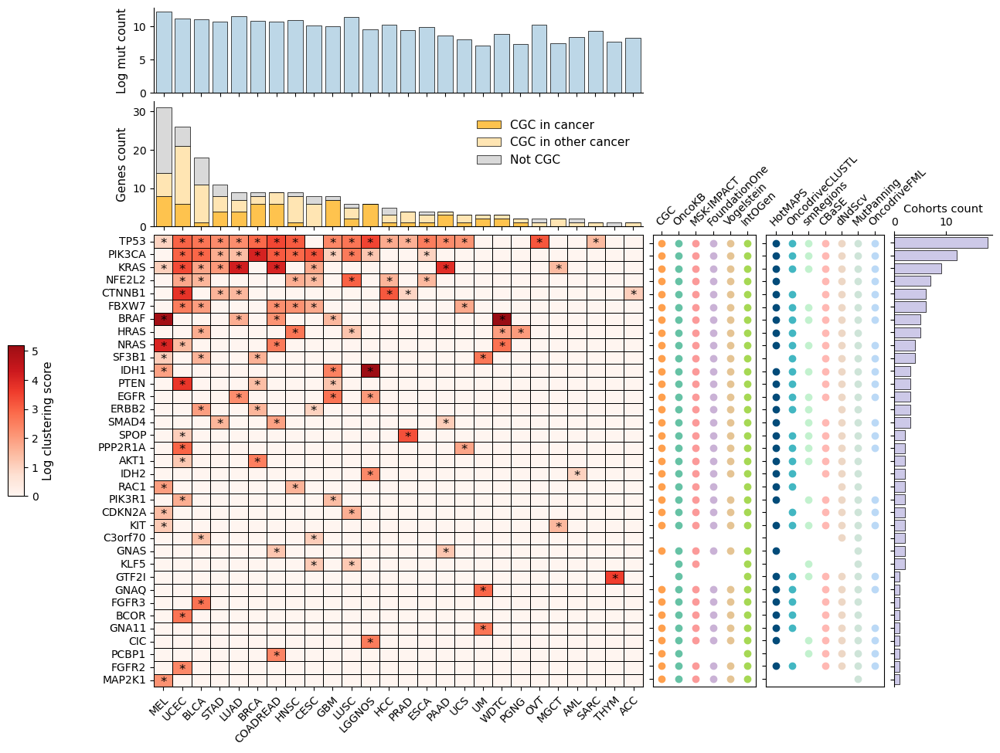

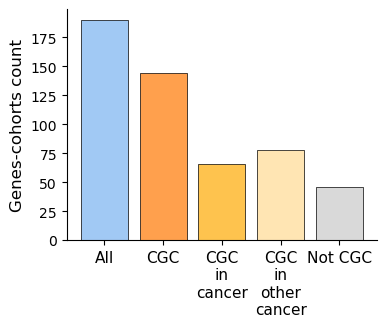

In [184]:
top_cohorts_n=None
top_genes_n=35

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_organ=False,
                                                                                             sort_by_score_only=False)

display(cohort_hits_count)
df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable_subset, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(14,13),
               width_ratios=[0.95, 0.2, 0.23, 0.19],
               height_ratios=[0.17, 0.17, 0.25, 0.9],
               cbar_loc=[-0.01, 0.3, 0.015, .15],
               legend_box=(-2.6, 1.28),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.045,
               plot_cohort_count_top=False,
               plot_max_score=False)

# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

Path doesn't exist: /workspace/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


/tmp/jobs/spellegrini/9964934/ipykernel_19740/1104244601.py:38: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)


,Oncodrive3D,CGC_specific,Not_CGC,CGC_not_specific,General_cancer,Mut,Clust_mut
Cohort,,,,,,,
TCGA_WXS_MEL,31,8,17,6,SKIN,199877,1674
TCGA_WXS_UCEC,26,6,5,15,UTERUS,65768,1183
TCGA_WXS_BLCA,18,1,7,10,BLADDER,64303,584
TCGA_WXS_STAD,11,4,3,4,STOMACH,42258,363
TCGA_WXS_LUAD,9,4,2,3,LUNG,98457,646
TCGA_WXS_BRCA,9,6,1,2,BREAST,47827,701
TCGA_WXS_COADREAD,9,6,0,3,COADREAD,41668,672
TCGA_WXS_HNSC,9,1,1,7,HEAD_NECK,53606,541
TCGA_WXS_CESC,8,0,2,6,CERVIX,25831,173


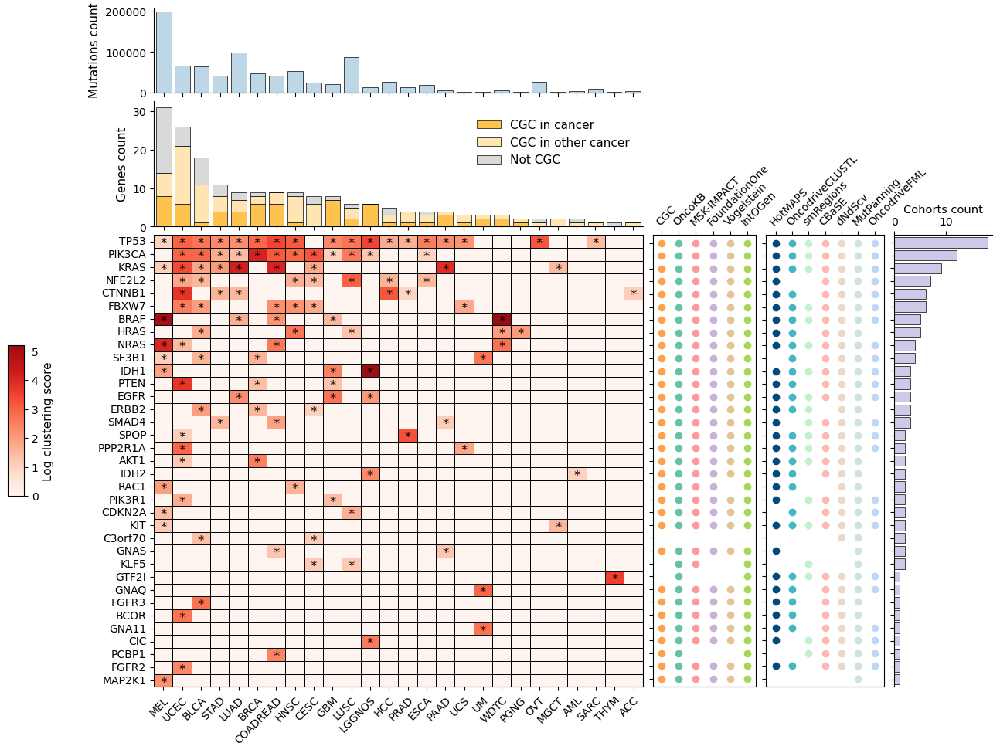

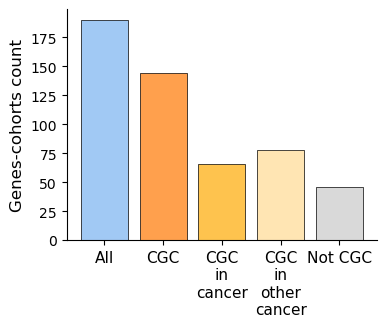

In [240]:
top_cohorts_n=None
top_genes_n=35

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_organ=False,
                                                                                             sort_by_score_only=False)

display(cohort_hits_count)
df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable_subset, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(14,13),
               width_ratios=[0.95, 0.2, 0.23, 0.19],
               height_ratios=[0.17, 0.17, 0.25, 0.9],
               cbar_loc=[-0.01, 0.3, 0.015, .15],
               legend_box=(-2.6, 1.28),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.045,
               log_mut_count=False,
               plot_cohort_count_top=False,
               plot_max_score=False)

plot_o3d_cgc_hits(hits_df)

#### All cohorts

Path doesn't exist: /workspace/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


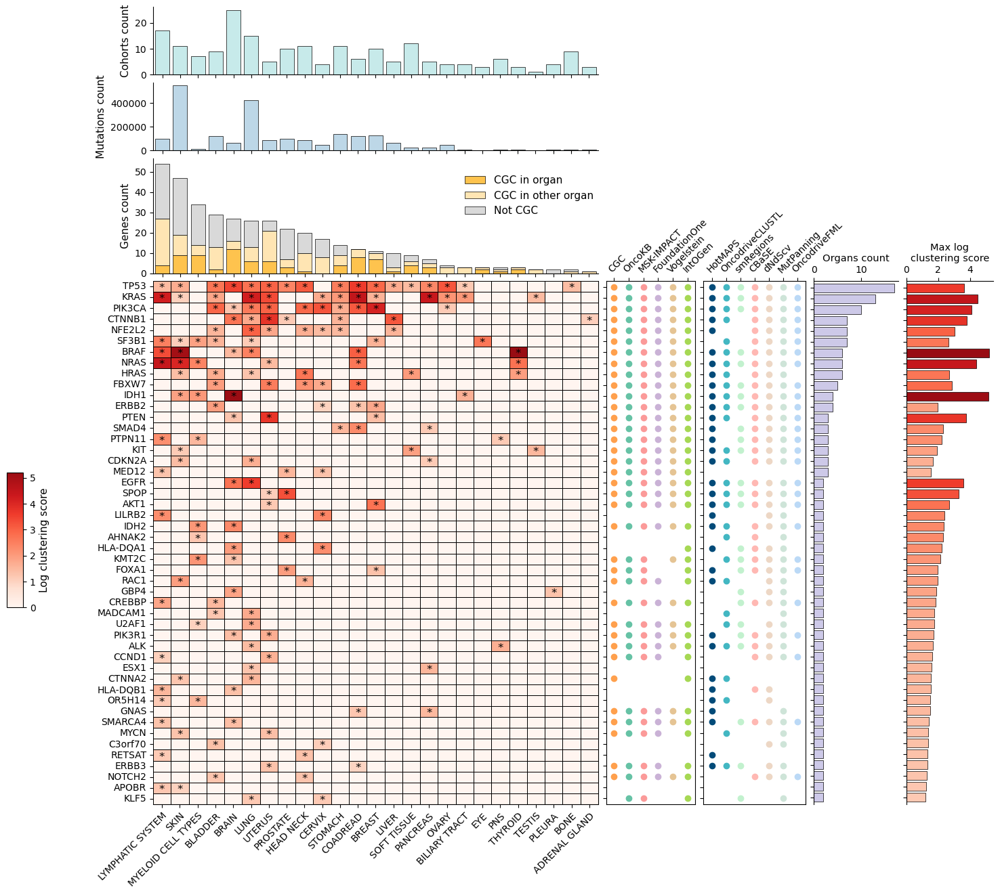

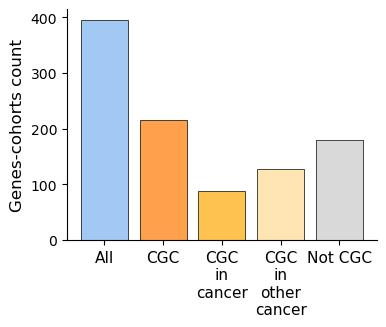

In [241]:
top_cohorts_n=None
top_genes_n=48

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_organ=True,
                                                                                             sort_by_score_only=False)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
df_anomaly.columns = [cancer.replace("LYMPH", "LYMPHATIC SYSTEM") for cancer in df_anomaly.columns]
df_anomaly.columns = [cancer.replace("MYELOID", "MYELOID CELL TYPES") for cancer in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(16,15.3),
               width_ratios=[1, 0.2, 0.23, 0.19, 0.195],
               height_ratios=[0.13, 0.13, 0.22, 1],
               cbar_loc=[-0.01, 0.3, 0.015, .13],
               legend_box=(-3.5, 1.22),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.012,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.04,
               plot_max_score=True,
               plot_cohort_count_top=True,
               log_mut_count=False,
               grouped_by_organ=True)

plot_o3d_cgc_hits(hits_df)

Path doesn't exist: /workspace/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


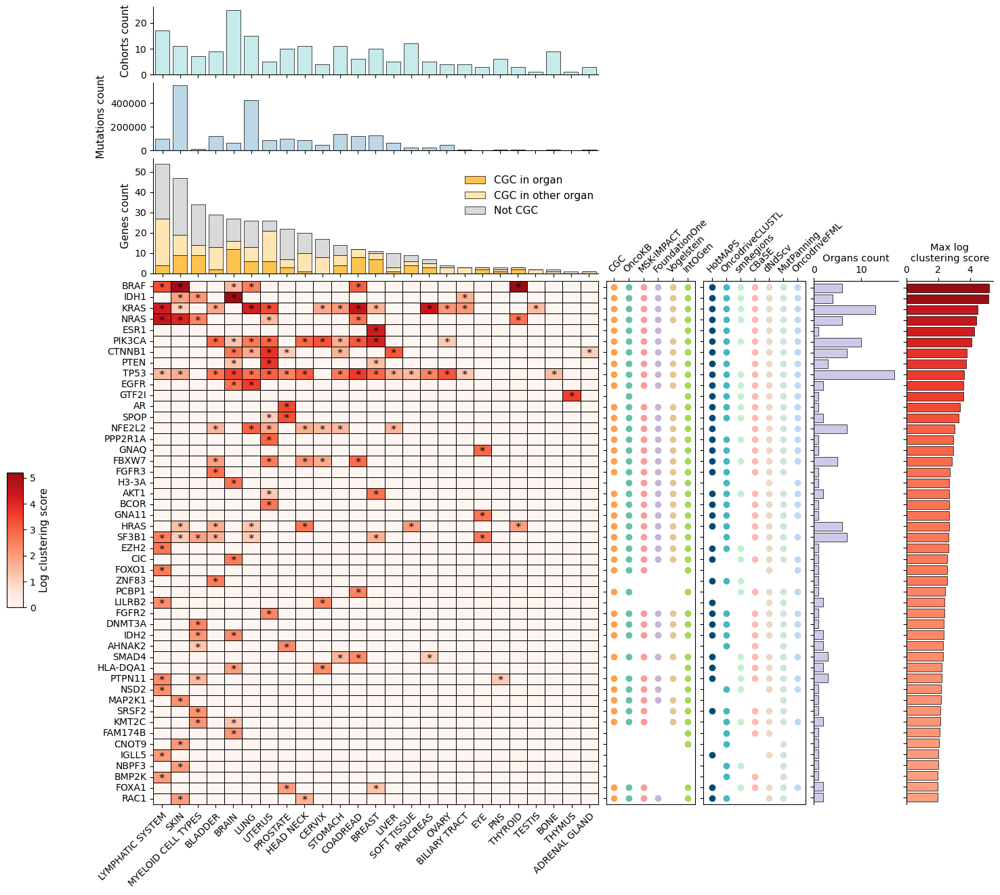

In [237]:
top_cohorts_n=None
top_genes_n=48

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_organ=True,
                                                                                             sort_by_score_only=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
df_anomaly.columns = [cancer.replace("LYMPH", "LYMPHATIC SYSTEM") for cancer in df_anomaly.columns]
df_anomaly.columns = [cancer.replace("MYELOID", "MYELOID CELL TYPES") for cancer in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(16,15.3),
               width_ratios=[1, 0.2, 0.23, 0.19, 0.195],
               height_ratios=[0.13, 0.13, 0.22, 1],
               cbar_loc=[-0.01, 0.3, 0.015, .13],
               legend_box=(-3.5, 1.22),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.012,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.04,
               plot_max_score=True,
               plot_cohort_count_top=True,
               log_mut_count=False,
               grouped_by_organ=True)

##### Plot for genes detected in only one organ

Path doesn't exist: /workspace/projects/clustering_3d/o3d_analysys/datasets//output/cancer_202404/o3d_output/human_mane_raw/run_2024-07-01_16-04-14/PEDCBIOP_WXS_TALL_REL/PEDCBIOP_WXS_TALL_REL.3d_clustering_genes.csv


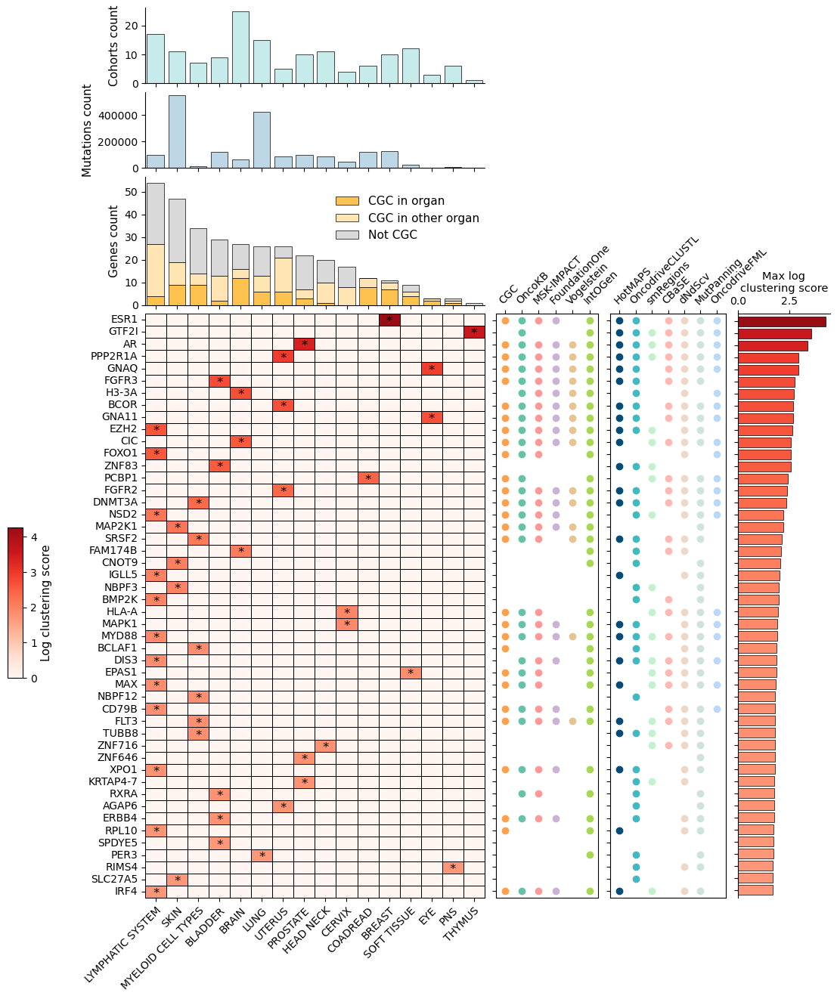

In [239]:
top_cohorts_n=None
top_genes_n=48

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_organ=True,
                                                                                             sort_by_score_only=False,
                                                                                             genes_in_one_cohort=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
df_anomaly.columns = [cancer.replace("LYMPH", "LYMPHATIC SYSTEM") for cancer in df_anomaly.columns]
df_anomaly.columns = [cancer.replace("MYELOID", "MYELOID CELL TYPES") for cancer in df_anomaly.columns]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)

plot_landscape(df=df_binary, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(13.5,15.3),
               width_ratios=[0.7, 0.21, 0.24, 0.19, 0.195],
               height_ratios=[0.13, 0.13, 0.22, 1],
               cbar_loc=[-0.01, 0.3, 0.015, .13],
               legend_box=(-2.7, 1.22),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.012,
               ax6_xmargin=0.1,
               wspace=0.08, 
               hspace=0.04,
               plot_max_score=True,
               plot_cohort_count_top=True,
               plot_cohort_count_right=False,
               log_mut_count=False,
               grouped_by_organ=True)

### Look for interesting cases

#### Check cohorts and mut count

In [973]:
set([cohort.split("_")[0] for cohort in cohort_df.COHORT])

{'CBIOP',
 'CGCI',
 'CPTAC',
 'HARTWIG',
 'ICGC',
 'OTHER',
 'PCAWG',
 'PEDCBIOP',
 'STJUDE',
 'TARGET',
 'TCGA'}

In [975]:
cohort_df[cohort_df.COHORT.str.startswith("TARGET")]

,COHORT,CANCER_TYPE,PLATFORM,MUTATIONS,SAMPLES
170,TARGET_WGS_NBL_US,NBL,WGS,15573,212
241,TARGET_WGS_WT_US,WT,WGS,1534,34
242,TARGET_WXS_AML_2020,AML,WXS,962,22
245,TARGET_WXS_OS_2020,OS,WXS,18875,97


In [952]:
hits_df = get_hits(genetable)
len(hits_df.Cohort.unique())

135

In [955]:
len(genetable.Cohort.unique())

214

In [966]:
# I got 4 cohorts in MYELOID but I have 7, cause I am looking at only the ones that I have hits
ix = cohort_df[cohort_df["GENERAL_CANCER_TYPE"] == "MYELOID"].COHORT.str.startswith("ICGC")
cohort_df[cohort_df["GENERAL_CANCER_TYPE"] == "MYELOID"][~ix]

,COHORT,CANCER_TYPE,PLATFORM,MUTATIONS,SAMPLES,GENERAL_CANCER_TYPE
6,STJUDE_WGS_D_AML_2018,AML,WGS,30265,21,MYELOID
176,PCAWG_WGS_MYELOID_AML,AML,WGS,20309,13,MYELOID
183,PCAWG_WGS_MYELOID_MPN,MDS,WGS,25023,23,MYELOID
188,OTHER_WXS_AML_PRY_BEAT_2018,AML,WXS,79225,257,MYELOID
217,PEDCBIOP_WXS_AML_PRY,AML,WXS,233,28,MYELOID
242,TARGET_WXS_AML_2020,AML,WXS,962,22,MYELOID
246,TCGA_WXS_AML,AML,WXS,8313,140,MYELOID


#### Check for IntOGen results matching with what I see

In [240]:
#### MED12 in IntOGen results to be detected by combination, CBaSE, OncodriveCLUSTL but they all have a qval > 0.01
display(genetable[(genetable["Gene"] == "MED12") & (genetable["cbase_qval"] < 0.1)][["Gene", "Cancer", "Cohort", "cbase_pval", "cbase_qval"]])
display(genetable[(genetable["Gene"] == "MED12") & (genetable["clustl_qval"] < 0.1)][["Gene", "Cancer", "Cohort", "clustl_pval", "clustl_qval"]])

,Gene,Cancer,Cohort,cbase_pval,cbase_qval
3321799,MED12,LGGNOS,TCGA_WXS_LGGNOS,0.000185,0.093243
4132040,MED12,CESC,TCGA_WXS_CESC,0.000110,0.068667


,Gene,Cancer,Cohort,clustl_pval,clustl_qval
1627394,MED12,PRAD,CBIOP_WXS_PRAD_BROAD,0.013592,0.084334


#### Look for individual cases

In [221]:
df_complete = o3d_output.groupby("Gene").apply(
    lambda x: x.sort_values("Clustering_score", ascending=False).iloc[0]).sort_values("Clustering_score", ascending=False)
df_complete[:30]

,GENERAL_CANCER_TYPE,Gene,Clustering_score
Gene,,,
BRAF,THYROID,BRAF,179.618281
IDH1,BRAIN,IDH1,170.296501
KRAS,COADREAD,KRAS,88.347831
NRAS,LYMPH,NRAS,81.875684
ESR1,BREAST,ESR1,70.640336
PIK3CA,BREAST,PIK3CA,60.347787
CTNNB1,UTERUS,CTNNB1,43.402745
PTEN,UTERUS,PTEN,41.634486
TP53,COADREAD,TP53,37.386387


In [477]:
o3d_output[o3d_output["Gene"] == "ZNF83"]

,Cohort,Gene,Uniprot_ID,qval,C_gene,C_pos,Clustering_score,CGC,Fish
17443,CBIOP_WXS_BLCA_BGI,ZNF83,P51522,0.0000,1.0,[293 290],12.892111,0,0
26444,CBIOP_WXS_SCLC_UCOLOGNE_2015,ZNF83,P51522,0.4982,0.0,[280 281],3.046575,0,0
30109,OTHER_WGS_DLBCL_NATCOM_2018,ZNF83,P51522,1.0000,0.0,NaN,1.377934,0,0


In [493]:
o3d_output[o3d_output["Gene"] == "LILRB2"]

,Cohort,Gene,Uniprot_ID,qval,C_gene,C_pos,Clustering_score,CGC,Fish
19044,CGCI_WGS_CESC_2020,LILRB2,Q8N423,0.0,1.0,[374 373 372 371 375],2.394119,0.0,0.0
19489,CBIOP_WXS_ACY_2019,LILRB2,Q8N423,1.0,0.0,NaN,0.489121,0.0,0.0
25265,CBIOP_WXS_LUAD_BROAD,LILRB2,Q8N423,1.0,0.0,NaN,-0.078369,0.0,0.0
25759,CGCI_WGS_BL_2020,LILRB2,Q8N423,0.0,1.0,[374 373 372 371 375],2.263069,0.0,0.0


# Delete everything (old working process for landscape, after restarting and rerunning kernel)

In [465]:
def plot_landscape(df, 
                   gene_colors, 
                   lut, 
                   gene_hits_count, 
                   cohort_hits_count,
                   colors_dict,
                   names_dict,
                   annot_df,
                   df_anomaly=None,
                   figsize=(16,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   ax6_margin=0.018,
                   ax6_xmargin=0.07,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   divergent_palette=False,
                   color_gene=False,
                   plot_cgc_specific=False,
                   right_ax_ylabel="Cohort count"):
    
    if df_anomaly is not None:
        df_binary = df
        df = df_anomaly
        cmap = "vlag"
        cmap = create_custom_colormap()
    else:
        colors = ["lightgray", "gray"] 
        cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))
    if divergent_palette:
        cmap = sns.color_palette("coolwarm", as_cmap=True)
    
    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    #col_labels = [ctype_dict[cohort] for cohort  in col_labels]
    
    gene_sums = gene_hits_count["Oncodrive3D"].values
    cohort_sums = cohort_hits_count["Oncodrive3D"].values
    
    if plot_cgc_specific:
        cgc_specific = cohort_hits_count["CGC_specific"].values
        cgc_not_specific = cohort_hits_count["CGC_not_specific"].values
        not_cgc = cohort_hits_count["Not_CGC"].values  
    else:
        cgc = cohort_hits_count["CGC"].values
        not_cgc = cohort_hits_count["Not_CGC"].values
    
    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, 3, 
                           figsize=figsize, 
                           gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios})
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,2]
    ax5 = ax[0,2]
    ax6 = ax[1,1]
    
    # Create the heatmap
    if df_anomaly is not None and divergent_palette:
        vmax = df_anomaly.max().max()
        vmin = -vmax
    else:
        vmax, vmin = None, None
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black", vmax=vmax, vmin=vmin)
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    
    # Add bars for the right axis
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5)
    ax4.set_yticks(np.arange(len(gene_sums)))
    ax4.set_yticklabels([])
    ax4.set_xlabel(right_ax_ylabel, fontsize=10.5)
    ax4.invert_yaxis()
    
    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)
    
    # Add annotation track
    # ====================
    
    genes = annot_df['Gene']
    annot_df = annot_df.drop(columns=['Gene'])
    
    # Loop through each column
    indices = annot_df.index.tolist()
    ax6.scatter([0] * len(indices), indices, color="white")
    for j, col in enumerate(annot_df.columns):
        # Get the indices where the value is 1
        indices = annot_df.index[annot_df[col] == 1].tolist()
        ax6.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    ax6.set_yticks(np.arange(len(gene_sums)))
    ax6.set_yticklabels([])
    ax6.set_xticks(range(len(annot_df.columns)))
    ax6.set_xticklabels([names_dict[col] for col in annot_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    ax6.invert_yaxis()
    
    ax6.xaxis.tick_top()
    ax6.xaxis.set_label_position('top')
    # ax6.spines['bottom'].set_visible(False)
    # ax6.spines['right'].set_visible(False)
    
    # Add bars for the top axis
    if plot_cgc_specific: 
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, 
                color="#fec34e", edgecolor='black', label='CGC in cancer', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_not_specific, bottom=cgc_specific, 
                color="#ffe5b3", edgecolor='black', label='CGC in other cancer', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), not_cgc, bottom=np.array(cgc_specific) + np.array(cgc_not_specific), 
                color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)
    else:
        ax1.bar(np.arange(len(cohort_hits_count)), cgc, color="#ffbb80", edgecolor='black', label='CGC', lw=0.5)
        ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, bottom=cgc, color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)
    ax1.set_xticks(np.arange(len(cohort_sums)))
    ax1.set_ylabel("Gene count", fontsize=11)
    ax1.set_xticklabels([])
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    
    # Details
    ax2.remove()
    ax5.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    ax1.margins(x=ax1_margin, tight=True)
    ax4.margins(y=ax4_margin, tight=True)
    ax6.margins(y=ax6_margin, x=ax6_xmargin, tight=True)
    
    handles, labels = ax3.get_legend_handles_labels()
    if intogen_label:
        handles.append(mpatches.Patch(facecolor=lut["Detected"], edgecolor="black", label='Detected', lw=0.5))
        handles.append(mpatches.Patch(facecolor=lut["Not detected"], edgecolor="black", label="Not detected", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, 
                            title="Detected in IntOGen", title_fontsize=11, fontsize=11)
    elif plot_cgc_specific:
        handles.append(mpatches.Patch(facecolor="#fec34e", edgecolor="black", label='CGC in cancer', lw=0.5))
        handles.append(mpatches.Patch(facecolor="#ffe5b3", edgecolor="black", label="CGC in other cancer", lw=0.5))
        handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    else:
        handles.append(mpatches.Patch(facecolor="#ffbb80", edgecolor="black", label='CGC', lw=0.5))
        handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
        legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    if color_gene:
        for i, label in enumerate(ax3.get_yticklabels()):
            label.set_color(gene_colors[i])
        for text in legend.get_texts():
            text.set_color(lut[text.get_text()])
    
    if df_anomaly is not None:
        # Set cbar
        cbar_ax = fig.add_axes(cbar_loc) 
        cbar = fig.colorbar(ax3.collections[0], cax=cbar_ax)
        cbar.set_label('Log2 clustering score', fontsize=11) 
        
        # Overlay stars on top of the heatmap
        for i in range(len(row_labels)):
            for j in range(len(col_labels)):
                if df_binary.iloc[i, j] == 1:
                    ax3.text(j + 0.5, i + 0.65, '*', ha='center', va='center', fontsize=12, color='black')
           
        # Overlay ^ for IntOGen hits
        if intogen_label_table is not None:   
            for i in range(len(row_labels)):
                for j in range(len(col_labels)):
                    if intogen_label_table.iloc[i, j] == 1:
                        ax3.text(j + 0.5, i + 0.65, '^', ha='center', va='top', fontsize=12, color='black')

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

In [469]:
colors_dict = {"Oncodrive3D" : "#ffad48", 
              "HotMAPS" : "#024b79", 
              "OncodriveCLUSTL" : "#43b7c2", 
              "smRegions" : "#c2f1ce", 
              "CBaSE" : "#ffb8b3", 
              "SEISMIC" : "#ede5ff", 
              "dNdScv" : "#edd7c5", 
              "MutPanning" : "#cee4d8", 
              "OncodriveFML" : "#bbd9f6",
              "IntOGen" : "#A6D854",
              "OncoKB" : "#66C2A5",
              "CGC" : "#FFA04D",
              "MSK-IMPACT" : "#FB9A99",
              "MSK-IMPACT Heme" : "#E31A1C",
              "FoundationOne" : "#CAB2D6",
              "FoundationOne Heme" : "#6A3D9A",
              "Vogelstein" : "#E5C494"}


names_dict = {"o3d" : "Oncodrive3D", 
             "hotmaps" : "HotMAPS", 
             "clustl" : "OncodriveCLUSTL", 
             "smreg" : "smRegions", 
             "cbase" : "CBaSE", 
             "seismic" : "SEISMIC", 
             "dndscv" : "dNdScv", 
             "mutpan" : "MutPanning", 
             "fml" : "OncodriveFML",
             "intogen" : "IntOGen",
             "oncokb" : "OncoKB",
             "cgc" : "CGC",
             "msk_impact" : "MSK-IMPACT",
             "msk_heme" : "MSK-IMPACT Heme",
             "fondone" : "FoundationOne",
             "fondone_heme" : "FoundationOne Heme", 
             "vogelstein" : "Vogelstein"}


def get_annot_gene_df(genes_lst,
                      genetable_df,
                      intogen_drivers_df, 
                      oncokb_df, 
                      cgc_df, 
                      alpha = 0.01,
                      lst_methods = ["hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]):

    genes = pd.Series(genes_lst)
    
    unique_hits_dict = {}
    unique_hits_dict["cgc"] = cgc_df["Gene Symbol"].values
    unique_hits_dict["oncokb"] = oncokb_df.loc[oncokb_df["OncoKB Annotated"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["msk_impact"] = oncokb_df.loc[oncokb_df["MSK-IMPACT"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["msk_heme"] = oncokb_df.loc[oncokb_df["MSK-HEME"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["fondone"] = oncokb_df.loc[oncokb_df["FOUNDATION ONE"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["fondone_heme"] = oncokb_df.loc[oncokb_df["FOUNDATION ONE HEME"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["vogelstein"] = oncokb_df.loc[oncokb_df["Vogelstein"] == "Yes", "Hugo Symbol"].values
    unique_hits_dict["intogen"] = intogen_drivers_df.SYMBOL.values
    
    # Get unique hits for each method in Intogen and O3D
    for method in lst_methods:
        unique_hits_dict[method] = genetable_df[genetable_df[f"{method}_qval"] < alpha].Gene.unique()
    
    # Get df
    annot_df = {}
    annot_df["Gene"] = genes
    for annot in unique_hits_dict.keys():
        annot_df[annot] = genes.isin(unique_hits_dict[annot]).astype(int)
    
    return pd.DataFrame(annot_df)

drivers_df = pd.read_table(f"{input_path}/drivers.tsv")
uniq_drivers_df = pd.read_table(f"{input_path}/unique_drivers.tsv")
annot_df = get_annot_gene_df(df_binary.index, genetable_subset, uniq_drivers_df, oncokb_df, cgc_df)
annot_df

,Gene,cgc,oncokb,msk_impact,msk_heme,fondone,fondone_heme,vogelstein,intogen,hotmaps,clustl,smreg,cbase,dndscv,mutpan,fml
0,TP53,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,KRAS,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,PIK3CA,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,SF3B1,1,1,1,1,1,1,1,1,0,1,0,1,1,1,1
4,CTNNB1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1
5,NFE2L2,1,1,1,1,1,1,1,1,1,0,0,1,1,1,1
6,NRAS,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
7,HRAS,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0
8,BRAF,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
9,FBXW7,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [470]:
annot_cols = ["Gene", "cgc", "oncokb", "msk_impact", "msk_heme", "fondone", "fondone_heme", "vogelstein", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
annot_cols = ["Gene", "cgc", "oncokb", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
annot_cols = ["Gene", "cgc", "oncokb", "msk_impact", "fondone", "vogelstein", "intogen"]

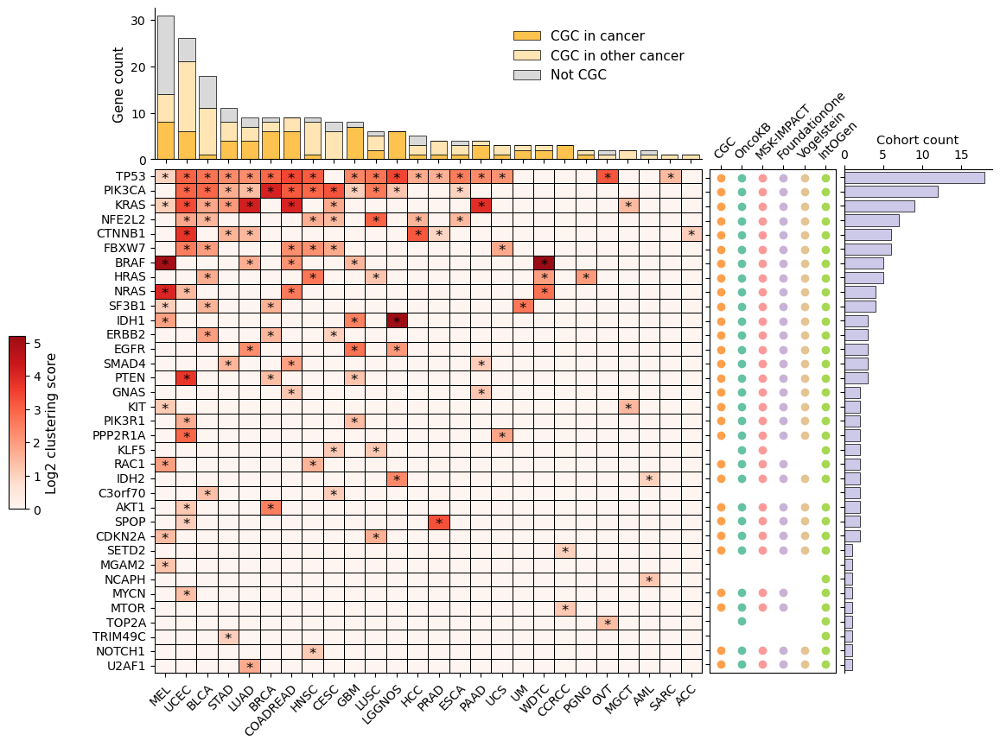

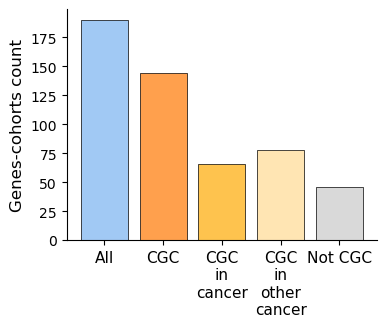

In [471]:
top_cohorts_n=None
top_genes_n=35

o3d_output = get_anomaly_df(genetable_subset, o3d_output_dir)
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                             cohort_df, 
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             anomaly_dict=anomaly_dict,
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict)

df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)
annot_cols = ["Gene", "cgc", "oncokb", "msk_impact", "fondone", "vogelstein", "intogen"]
annot_df = get_annot_gene_df(df_binary.index, genetable_subset, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(12.5,10),
               width_ratios=[1, 0.23, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-1, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.03, 
               hspace=0.03,
               filename="landscape_heatmap_tcga.png",
               plot_cgc_specific=True)


# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

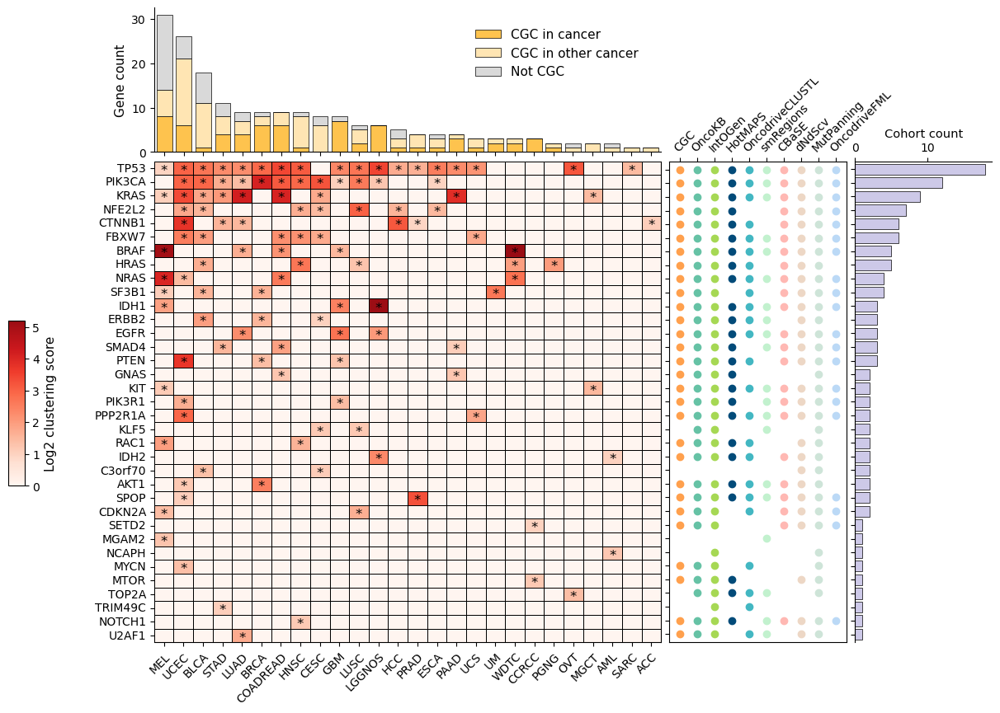

In [472]:
annot_cols = ["Gene", "cgc", "oncokb", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
annot_df = get_annot_gene_df(df_binary.index, genetable_subset, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(13.1,10),
               width_ratios=[1, 0.35, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-1.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.07,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True)

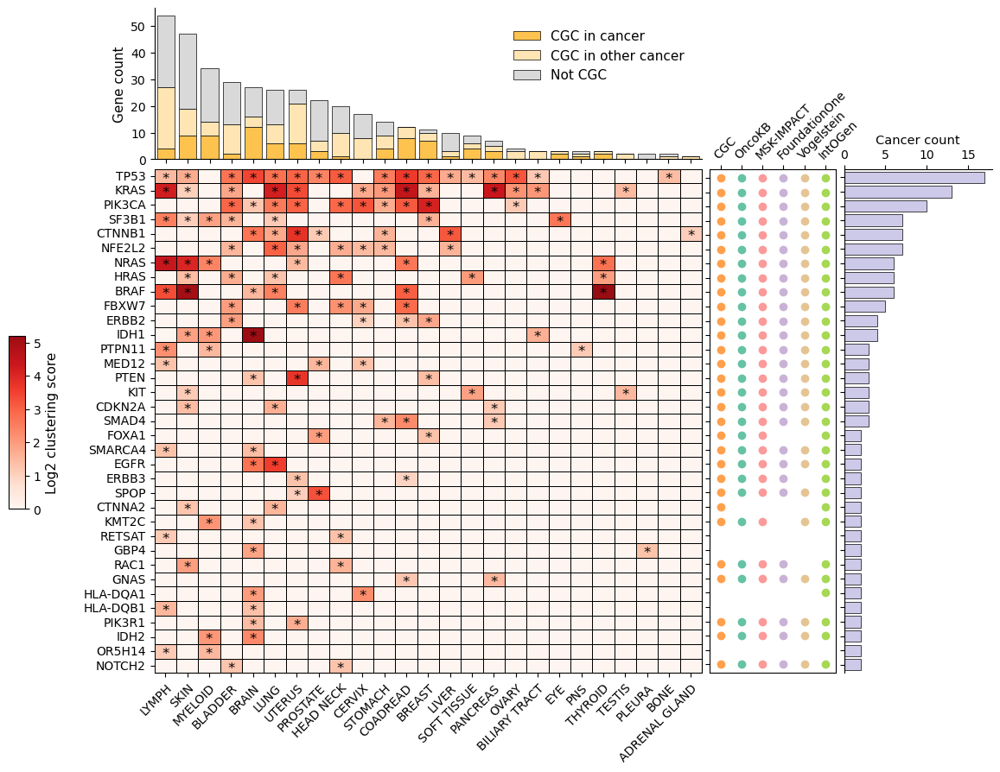

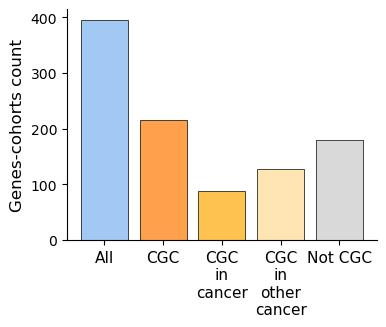

In [473]:
top_cohorts_n=None
top_genes_n=35 

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()

anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             anomaly_dict=anomaly_dict,
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

annot_cols = ["Gene", "cgc", "oncokb", "msk_impact", "fondone", "vogelstein", "intogen"]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(12.5,10),
               width_ratios=[1, 0.23, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-1, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")
    

# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

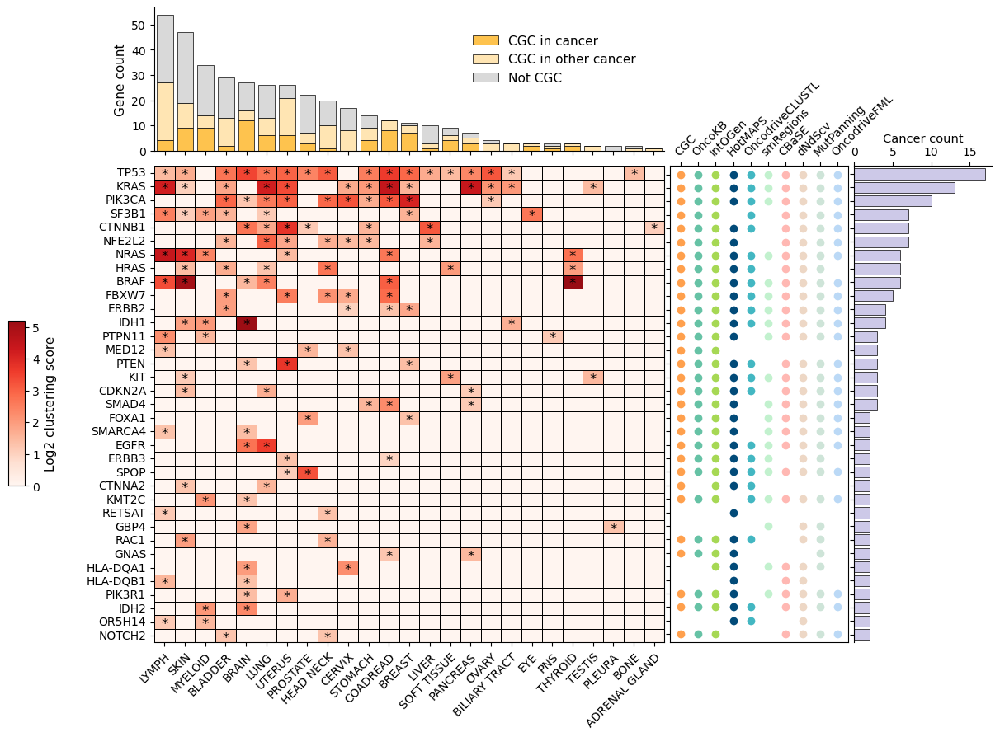

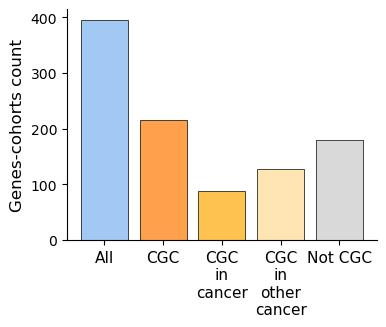

In [474]:
top_cohorts_n=None
top_genes_n=35 

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()

anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             anomaly_dict=anomaly_dict,
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

annot_cols = ["Gene", "cgc", "oncokb", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(13.1,10),
               width_ratios=[1, 0.35, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-1.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.07,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")
    

# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

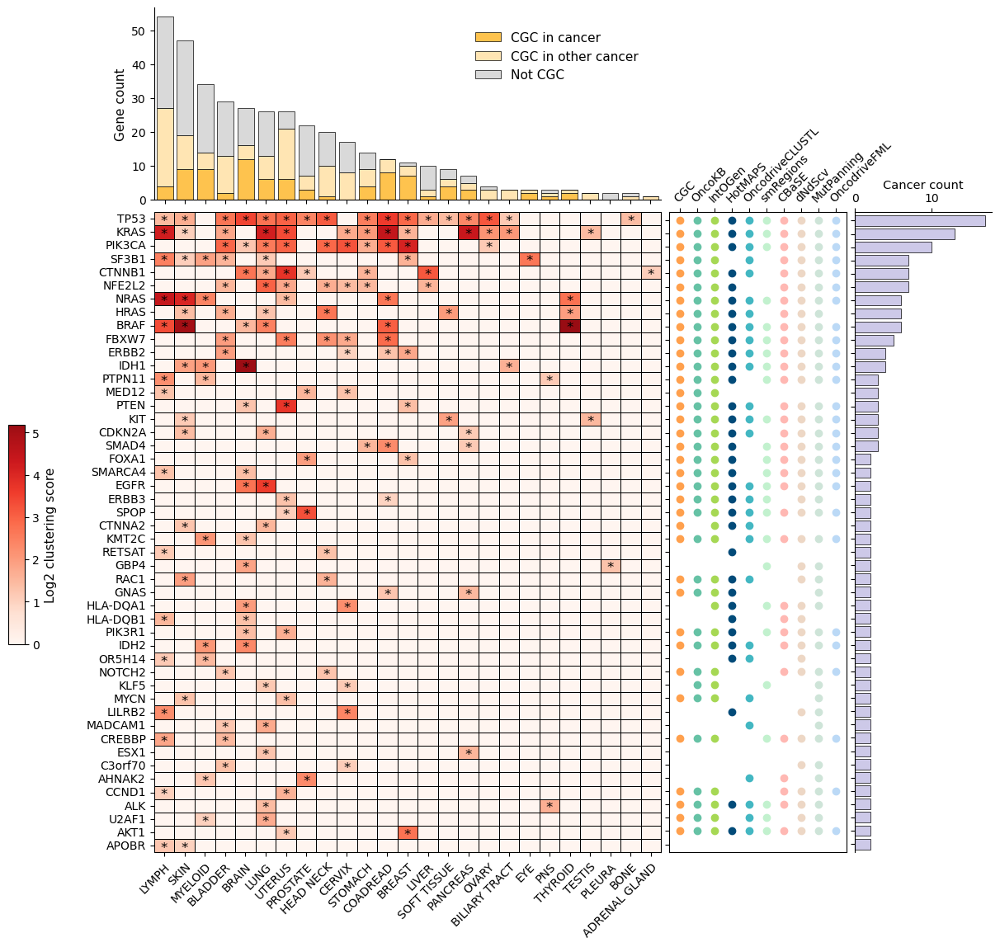

In [475]:
top_cohorts_n=None
top_genes_n=48

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()

anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             anomaly_dict=anomaly_dict,
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

annot_cols = ["Gene", "cgc", "oncokb", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]


plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(13.1,13.3),
               width_ratios=[1, 0.35, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-1.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.013,
               ax6_xmargin=0.07,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")

### Add additional annotation block for Intogen methods

,Cohort,Gene,Uniprot_ID,qval,C_gene,C_pos,Clustering_score,CGC,Fish
0,HARTWIG_WGS_BLCA_2023,PIK3CA,P42336,0.0,1.0,[542 545 539],6.608875,1.0,0.0
1,HARTWIG_WGS_BLCA_2023,RXRA,F1D8Q5,0.0,1.0,[427 429],5.260005,0.0,0.0
2,HARTWIG_WGS_BLCA_2023,FGFR3,P22607,0.0,1.0,[248 249 373],5.135854,1.0,0.0
3,HARTWIG_WGS_BLCA_2023,FBXW7,Q969H0,0.0,1.0,[505 465],3.409612,1.0,0.0
4,HARTWIG_WGS_BLCA_2023,TP53,K7PPA8,0.0,1.0,[249 273 241 173 248 132 195 280 157 258 194 2...,3.377812,1.0,0.0
...,...,...,...,...,...,...,...,...,...
71189,TCGA_WXS_PGNG,SUSD4,Q5VX71,1.0,0.0,NaN,1.668006,0.0,0.0
71190,TCGA_WXS_PGNG,PMM1,A0A024R1U5,1.0,0.0,NaN,1.332350,0.0,0.0
71191,TCGA_WXS_PGNG,NAGK,A0A384N6G7,1.0,0.0,NaN,1.287737,0.0,0.0
71192,TCGA_WXS_PGNG,ADH6,P28332,1.0,0.0,NaN,1.279473,0.0,1.0


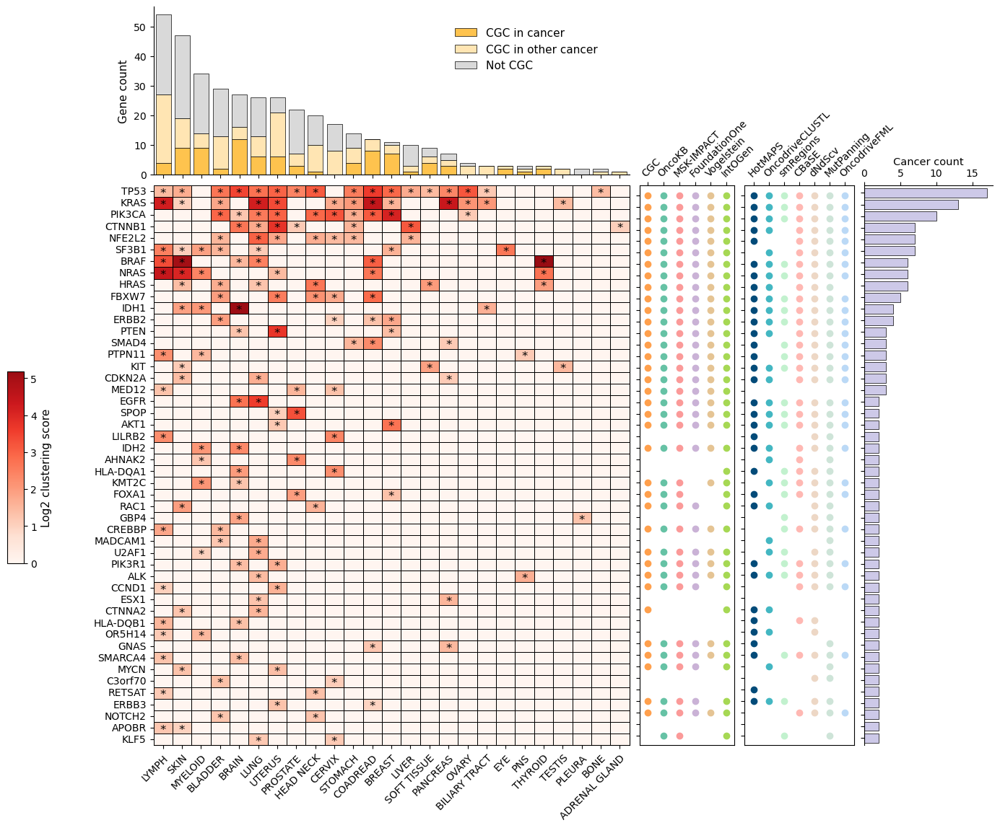

In [617]:
top_cohorts_n=None
top_genes_n=48

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

annot_cols = ["Gene", "cgc", "oncokb", "msk_impact", "msk_heme", "fondone", "fondone_heme", "vogelstein", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]


plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(15,13.3),
               width_ratios=[1, 0.2, 0.23, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")

,Cohort,Gene,Uniprot_ID,qval,C_gene,C_pos,Clustering_score,CGC,Fish
0,HARTWIG_WGS_BLCA_2023,PIK3CA,P42336,0.0,1.0,[542 545 539],6.608875,1.0,0.0
1,HARTWIG_WGS_BLCA_2023,RXRA,F1D8Q5,0.0,1.0,[427 429],5.260005,0.0,0.0
2,HARTWIG_WGS_BLCA_2023,FGFR3,P22607,0.0,1.0,[248 249 373],5.135854,1.0,0.0
3,HARTWIG_WGS_BLCA_2023,FBXW7,Q969H0,0.0,1.0,[505 465],3.409612,1.0,0.0
4,HARTWIG_WGS_BLCA_2023,TP53,K7PPA8,0.0,1.0,[249 273 241 173 248 132 195 280 157 258 194 2...,3.377812,1.0,0.0
...,...,...,...,...,...,...,...,...,...
71189,TCGA_WXS_PGNG,SUSD4,Q5VX71,1.0,0.0,NaN,1.668006,0.0,0.0
71190,TCGA_WXS_PGNG,PMM1,A0A024R1U5,1.0,0.0,NaN,1.332350,0.0,0.0
71191,TCGA_WXS_PGNG,NAGK,A0A384N6G7,1.0,0.0,NaN,1.287737,0.0,0.0
71192,TCGA_WXS_PGNG,ADH6,P28332,1.0,0.0,NaN,1.279473,0.0,1.0


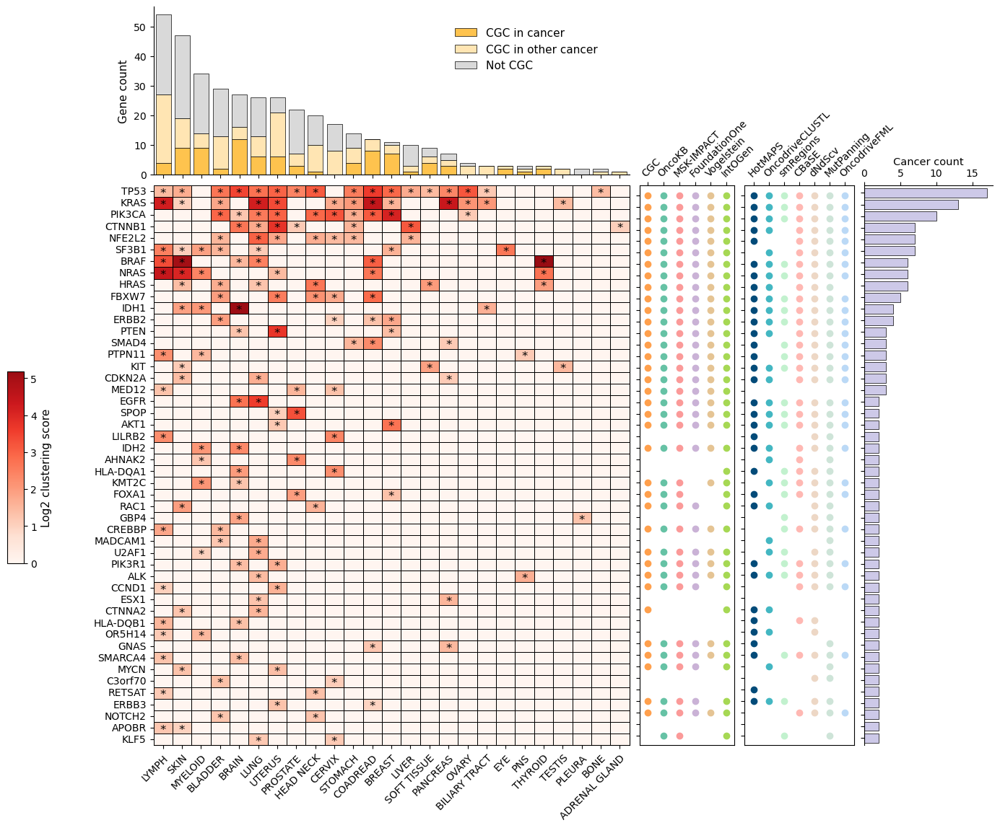

In [584]:
top_cohorts_n=None
top_genes_n=48

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

annot_cols = ["Gene", "cgc", "oncokb", "msk_impact", "msk_heme", "fondone", "fondone_heme", "vogelstein", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]


plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(15,13.3),
               width_ratios=[1, 0.2, 0.23, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_xmargin=0.1,
               wspace=0.05, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")

In [613]:
def get_gene_cohorts_binary(genetable_df, 
                            cohort_df, 
                            o3d_output_dir,
                            top_cohorts_n=None, 
                            top_genes_n=None, 
                            rm_empty_cols=True,
                            log_score=True,
                            cgc_specific=False,
                            cgc_df=None, 
                            cohorts_parent_dict=None,
                            grouped_by_cancer=False):

    # Get hits df and clustering score info
    hits_df = get_hits(genetable_df)
    o3d_output = get_anomaly_df(genetable_df, o3d_output_dir)

    # Count by general cancer
    if grouped_by_cancer:
        o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
        o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()
        anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                                  o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                                  o3d_output["Clustering_score"].values)}
        max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)
        target_col = "General_cancer"
        
    # Count by cohort
    else:
        o3d_output = get_anomaly_df(genetable_df, o3d_output_dir)
        anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                                  o3d_output["Cohort"].values, 
                                                                                  o3d_output["Clustering_score"].values)}
        max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)
        target_col = "Cohort"

    hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
    cols_to_drop = ["Uniprot_ID", "Cancer", "Fish"]
    if grouped_by_cancer:
        cols_to_drop.append("Cohort")
    hits_df = hits_df.drop(columns=cols_to_drop).drop_duplicates().reset_index(drop=True)
    
    # Get count of cancer a gene has been detected as significant across all cohorts
    gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D")
    gene_hits_count = gene_hits_count.merge(
        max_score_df[["Gene", "Clustering_score"]], on="Gene", how="left").sort_values(
        by=['Oncodrive3D', 'Clustering_score'], ascending=[False, False]).set_index("Gene")
    # For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
    cohort_hits_count = hits_df.groupby(target_col).apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False)
    
    if top_genes_n is None:
        top_genes_n = len(gene_hits_count)
    if top_cohorts_n is None:
        top_cohorts_n = len(cohort_hits_count)
    top_genes = gene_hits_count[:top_genes_n].index
    top_cohorts = cohort_hits_count[:top_cohorts_n].index

    # Get df anomaly and binary
    df_anomaly = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    df_binary = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    for cohort in top_cohorts:
        genes = hits_df[hits_df[target_col] == cohort].Gene.values
        genes = [gene for gene in genes if gene in df_anomaly.columns]
        # Df anomaly
        scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
        df_anomaly.loc[cohort, genes] = scores
        # Df binary
        df_binary.loc[cohort, genes] = 1

    df_anomaly = df_anomaly.T 
    df_binary = df_binary.T 
    if len(cohort_df) == 1:
        df_anomaly = df_anomaly.loc[hits_df.Gene]
        df_binary = df_binary.loc[hits_df.Gene]
        
    if rm_empty_cols:
        df_anomaly = df_anomaly.loc[:, ~(df_anomaly == 0).all()]
        df_binary = df_binary.loc[:, ~(df_binary == False).all()]

    gene_hits_count = gene_hits_count.loc[df_anomaly.index]
    cohort_hits_count = cohort_hits_count.loc[[cohort for cohort in cohort_hits_count.index if cohort in df_anomaly.columns]]

    return df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count

top_cohorts_n=None
top_genes_n=48

# df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
#                                                                                              cohort_df,
#                                                                                              o3d_output_dir=o3d_output_dir,
#                                                                                              top_cohorts_n=top_cohorts_n, 
#                                                                                              top_genes_n=top_genes_n, 
#                                                                                              cgc_specific=True,
#                                                                                              cgc_df=cgc_df, 
#                                                                                              cohorts_parent_dict=cohorts_tissue_parent_dict,
#                                                                                              grouped_by_cancer=True)


df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                             cohort_df,
                                                                                             o3d_output_dir=o3d_output_dir,
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=False)

,Cohort,Gene,Uniprot_ID,qval,C_gene,C_pos,Clustering_score,CGC,Fish
0,TCGA_WXS_LUSC,NFE2L2,Q16236,0.0,1,[31 29 30 26 27 24 79 80 81 77 34],20.512420,1.0,0.0
1,TCGA_WXS_LUSC,TP53,K7PPA8,0.0,1,[245 241 242 273 249 175 248 238 194 173 274 2...,14.640403,1.0,0.0
2,TCGA_WXS_LUSC,PIK3CA,P42336,0.0,1,[ 542 545 547 539 1045 1047],13.669229,1.0,0.0
3,TCGA_WXS_LUSC,CDKN2A,K7PML8,0.0,1,[ 83 114 84 85 118 81 50 108 53 20 48],5.202005,1.0,0.0
4,TCGA_WXS_LUSC,HRAS,P01112,0.0,1,[13 12 61],3.588907,1.0,0.0
...,...,...,...,...,...,...,...,...,...
36091,TCGA_WXS_PGNG,SUSD4,Q5VX71,1.0,0,NaN,1.668006,0.0,0.0
36092,TCGA_WXS_PGNG,PMM1,A0A024R1U5,1.0,0,NaN,1.332350,0.0,0.0
36093,TCGA_WXS_PGNG,NAGK,A0A384N6G7,1.0,0,NaN,1.287737,0.0,0.0
36094,TCGA_WXS_PGNG,ADH6,P28332,1.0,0,NaN,1.279473,0.0,1.0


/tmp/jobs/spellegrini/9964934/ipykernel_30761/3259731629.py:36: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)


In [611]:
gene_hits_count

,Oncodrive3D,Clustering_score
Gene,,
TP53,14,31.603613
KRAS,9,65.933711
PIK3CA,9,60.347787
NFE2L2,7,20.512420
CTNNB1,6,43.402745
BRAF,5,179.618281
HRAS,5,14.531444
FBXW7,5,12.655656
NRAS,4,57.088760


In [609]:
cohort_hits_count

,Oncodrive3D,CGC_specific,Not_CGC,CGC_not_specific
General_cancer,,,,
SKIN,31,8,17,6
UTERUS,26,6,5,15
BLADDER,18,1,7,10
LUNG,13,5,3,5
STOMACH,13,4,4,5
BRAIN,10,9,1,0
COADREAD,9,6,0,3
HEAD_NECK,9,1,1,7
BREAST,9,6,1,2


In [536]:

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()
max_score_df = o3d_output.groupby("Gene").max().reset_index().sort_values("Clustering_score", ascending=False)
max_score_df

,Gene,GENERAL_CANCER_TYPE,Clustering_score
1393,BRAF,UTERUS,179.618281
6045,IDH1,SKIN,170.296501
6870,KRAS,UTERUS,88.347831
8845,NRAS,UTERUS,81.875684
4182,ESR1,UTERUS,70.640336
...,...,...,...
4805,FRRS1,SKIN,0.410925
9819,PDE6D,SKIN,0.407732
10346,POLR2L,HEAD_NECK,0.392179
13628,TFPI,SKIN,0.370692


In [540]:
get_hits(genetable)

,Gene,Uniprot_ID,Cancer,Cohort,CGC,Fish,Oncodrive3D
0,PIK3CA,P42336,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1
1,RXRA,F1D8Q5,BLCA,HARTWIG_WGS_BLCA_2023,0,0,1
2,FGFR3,P22607,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1
3,FBXW7,Q969H0,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1
4,TP53,K7PPA8,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1
...,...,...,...,...,...,...,...
614,MED12,Q93074,PRAD,TCGA_WXS_PRAD,1,0,1
615,CTNNB1,A0A024R2Q3,PRAD,TCGA_WXS_PRAD,1,0,1
616,TP53,K7PPA8,SOFT_TISSUE,TCGA_WXS_SARC,1,0,1
617,HRAS,P01112,PGNG,TCGA_WXS_PGNG,1,0,1


In [568]:
hits_df = get_hits(genetable)
hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
hits_df = hits_df.drop(columns=["Uniprot_ID", "Cancer", "Cohort", "Fish"]).drop_duplicates().reset_index(drop=True)
target_col = "General_cancer"
# Get count of cancer a gene has been detected as significant across all cohorts
gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D").sort_values("Oncodrive3D", ascending=False).set_index("Gene")
gene_hits_count

,Oncodrive3D
Gene,
TP53,17
KRAS,13
PIK3CA,10
SF3B1,7
CTNNB1,7
...,...
H3-3A,1
H3C2,1
HCAR3,1


In [569]:
gene_hits_count.reset_index().merge(
    max_score_df[["Gene", "Clustering_score"]], on="Gene", how="left").sort_values(
    by=['Oncodrive3D', 'Clustering_score'], ascending=[False, False])[:60]

,Gene,Oncodrive3D,Clustering_score
0,TP53,17,37.386387
1,KRAS,13,88.347831
2,PIK3CA,10,60.347787
4,CTNNB1,7,43.402745
5,NFE2L2,7,20.512420
3,SF3B1,7,14.147752
8,BRAF,6,179.618281
6,NRAS,6,81.875684
7,HRAS,6,14.531444
9,FBXW7,5,17.195667


In [518]:
hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D").sort_values("Oncodrive3D", ascending=False).set_index("Gene")

,Oncodrive3D
Gene,
TP53,14
KRAS,9
PIK3CA,9
NFE2L2,7
CTNNB1,6
...,...
ERBB3,1
EPAS1,1
EEF1A1,1


0
1
2
3
4
5
6
7
8
9


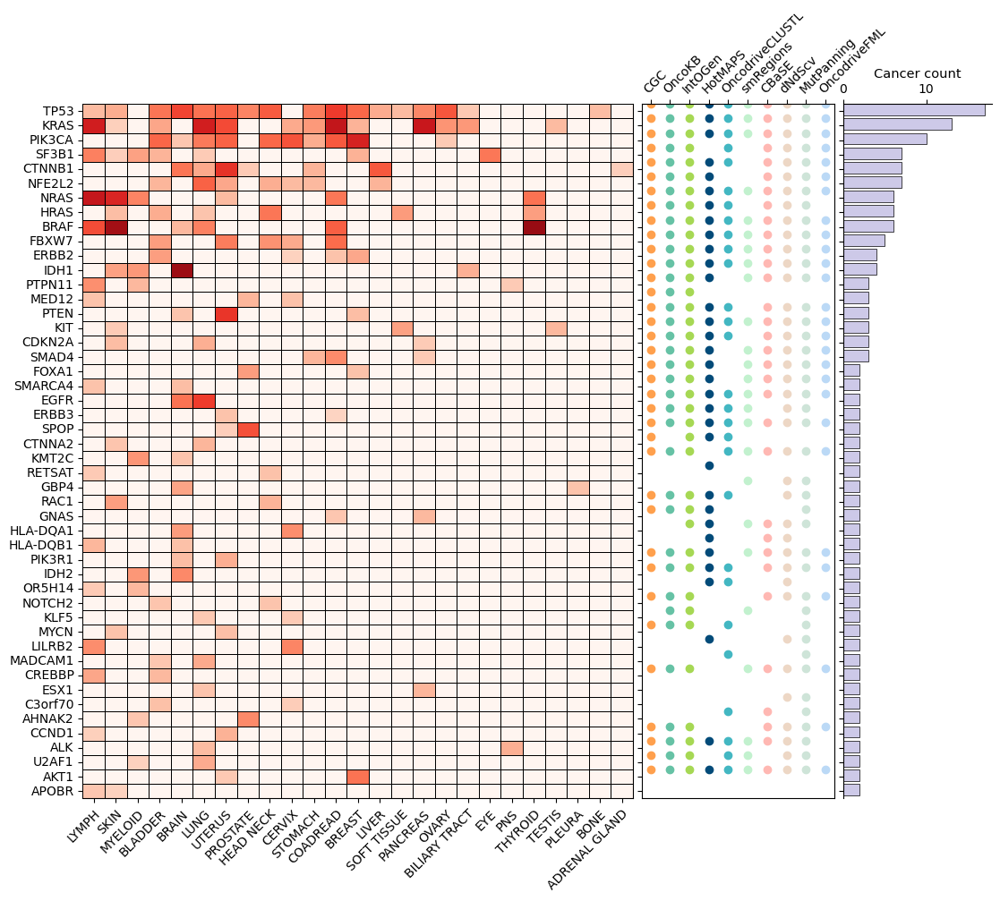

In [459]:
def plot_landscape(df, 
                   gene_colors, 
                   lut, 
                   gene_hits_count, 
                   cohort_hits_count,
                   colors_dict,
                   names_dict,
                   annot_df,
                   df_anomaly=None,
                   figsize=(16,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   ax6_margin=0.018,
                   ax6_xmargin=0.07,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   divergent_palette=False,
                   color_gene=False,
                   plot_cgc_specific=False,
                   right_ax_ylabel="Cohort count"):
    
    if df_anomaly is not None:
        df_binary = df
        df = df_anomaly
        cmap = "vlag"
        cmap = create_custom_colormap()
    else:
        colors = ["lightgray", "gray"] 
        cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))
    if divergent_palette:
        cmap = sns.color_palette("coolwarm", as_cmap=True)
    
    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    #col_labels = [ctype_dict[cohort] for cohort  in col_labels]
    
    # gene_sums = gene_hits_count["Oncodrive3D"].values
    # cohort_sums = cohort_hits_count["Oncodrive3D"].values
    
    # if plot_cgc_specific:
    #     cgc_specific = cohort_hits_count["CGC_specific"].values
    #     cgc_not_specific = cohort_hits_count["CGC_not_specific"].values
    #     not_cgc = cohort_hits_count["Not_CGC"].values  
    # else:
    #     cgc = cohort_hits_count["CGC"].values
    #     not_cgc = cohort_hits_count["Not_CGC"].values
    
    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, 3, 
                           figsize=figsize, 
                           gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios},
                           sharey='row')
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,2]
    ax5 = ax[0,2]
    ax6 = ax[1,1]
    
    # Create the heatmap
    if df_anomaly is not None and divergent_palette:
        vmax = df_anomaly.max().max()
        vmin = -vmax
    else:
        vmax, vmin = None, None
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black", vmax=vmax, vmin=vmin)
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    
    # Add bars for the right axis
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5, align='edge')
    #ax4.set_yticks(np.arange(len(gene_sums)))
    #ax4.set_yticklabels(row_labels)  # Set y-tick labels to match the heatmap
    ax4.set_xlabel(right_ax_ylabel, fontsize=10.5)
    # ax4.invert_yaxis()
    
    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)
    
    # Add annotation track
    # ====================
    
    genes = annot_df['Gene']
    annot_df = annot_df.drop(columns=['Gene'])
    
    # Loop through each column
    for j, col in enumerate(annot_df.columns):
        # Get the indices where the value is 1
        indices = annot_df.index[annot_df[col] == 1].tolist()
        # indices = indices + 0.5
        
        ax6.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
        print(j)
    
    # ax6.set_yticks(np.arange(len(gene_sums)))
    # ax6.set_yticklabels([])
    ax6.set_xticks(range(len(annot_df.columns)))
    ax6.set_xticklabels([names_dict[col] for col in annot_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    # ax6.invert_yaxis()
    
    ax6.xaxis.tick_top()
    ax6.xaxis.set_label_position('top')
    # ax6.spines['bottom'].set_visible(False)
    # ax6.spines['right'].set_visible(False)
    
    # # Add bars for the top axis
    # if plot_cgc_specific: 
    #     ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, 
    #             color="#fec34e", edgecolor='black', label='CGC in cancer', lw=0.5)
    #     ax1.bar(np.arange(len(cohort_hits_count)), cgc_not_specific, bottom=cgc_specific, 
    #             color="#ffe5b3", edgecolor='black', label='CGC in other cancer', lw=0.5)
    #     ax1.bar(np.arange(len(cohort_hits_count)), not_cgc, bottom=np.array(cgc_specific) + np.array(cgc_not_specific), 
    #             color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)
    # else:
    #     ax1.bar(np.arange(len(cohort_hits_count)), cgc, color="#ffbb80", edgecolor='black', label='CGC', lw=0.5)
    #     ax1.bar(np.arange(len(cohort_hits_count)), cgc_specific, bottom=cgc, color="#d9d9d9", edgecolor='black', label='Not CGC', lw=0.5)
    # ax1.set_xticks(np.arange(len(cohort_sums)))
    # ax1.set_ylabel("Gene count", fontsize=11)
    # ax1.set_xticklabels([])
    # ax1.spines['top'].set_visible(False)
    # ax1.spines['right'].set_visible(False)
    
    # Details
    ax1.remove() #### TO DEL
    ax2.remove()
    ax5.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    # ax1.margins(x=ax1_margin, tight=True)
    # ax4.margins(y=ax4_margin, tight=True)
    # ax6.margins(y=ax6_margin, x=ax6_xmargin, tight=True)
    
    # handles, labels = ax3.get_legend_handles_labels()
    # if intogen_label:
    #     handles.append(mpatches.Patch(facecolor=lut["Detected"], edgecolor="black", label='Detected', lw=0.5))
    #     handles.append(mpatches.Patch(facecolor=lut["Not detected"], edgecolor="black", label="Not detected", lw=0.5))
    #     legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, 
    #                         title="Detected in IntOGen", title_fontsize=11, fontsize=11)
    # elif plot_cgc_specific:
    #     handles.append(mpatches.Patch(facecolor="#fec34e", edgecolor="black", label='CGC in cancer', lw=0.5))
    #     handles.append(mpatches.Patch(facecolor="#ffe5b3", edgecolor="black", label="CGC in other cancer", lw=0.5))
    #     handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
    #     legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    # else:
    #     handles.append(mpatches.Patch(facecolor="#ffbb80", edgecolor="black", label='CGC', lw=0.5))
    #     handles.append(mpatches.Patch(facecolor="#d9d9d9", edgecolor="black", label="Not CGC", lw=0.5))
    #     legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, fontsize=11)
    # if color_gene:
    #     for i, label in enumerate(ax3.get_yticklabels()):
    #         label.set_color(gene_colors[i])
    #     for text in legend.get_texts():
    #         text.set_color(lut[text.get_text()])
    
    # if df_anomaly is not None:
    #     # Set cbar
    #     cbar_ax = fig.add_axes(cbar_loc) 
    #     cbar = fig.colorbar(ax3.collections[0], cax=cbar_ax)
    #     cbar.set_label('Log2 clustering score', fontsize=11) 
        
    #     # Overlay stars on top of the heatmap
    #     for i in range(len(row_labels)):
    #         for j in range(len(col_labels)):
    #             if df_binary.iloc[i, j] == 1:
    #                 ax3.text(j + 0.5, i + 0.65, '*', ha='center', va='center', fontsize=12, color='black')
           
    #     # Overlay ^ for IntOGen hits
    #     if intogen_label_table is not None:   
    #         for i in range(len(row_labels)):
    #             for j in range(len(col_labels)):
    #                 if intogen_label_table.iloc[i, j] == 1:
    #                     ax3.text(j + 0.5, i + 0.65, '^', ha='center', va='top', fontsize=12, color='black')

    if filename:
        plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()



plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(13.1,13.3),
               width_ratios=[1, 0.35, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-1.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.013,
               ax6_xmargin=0.07,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")

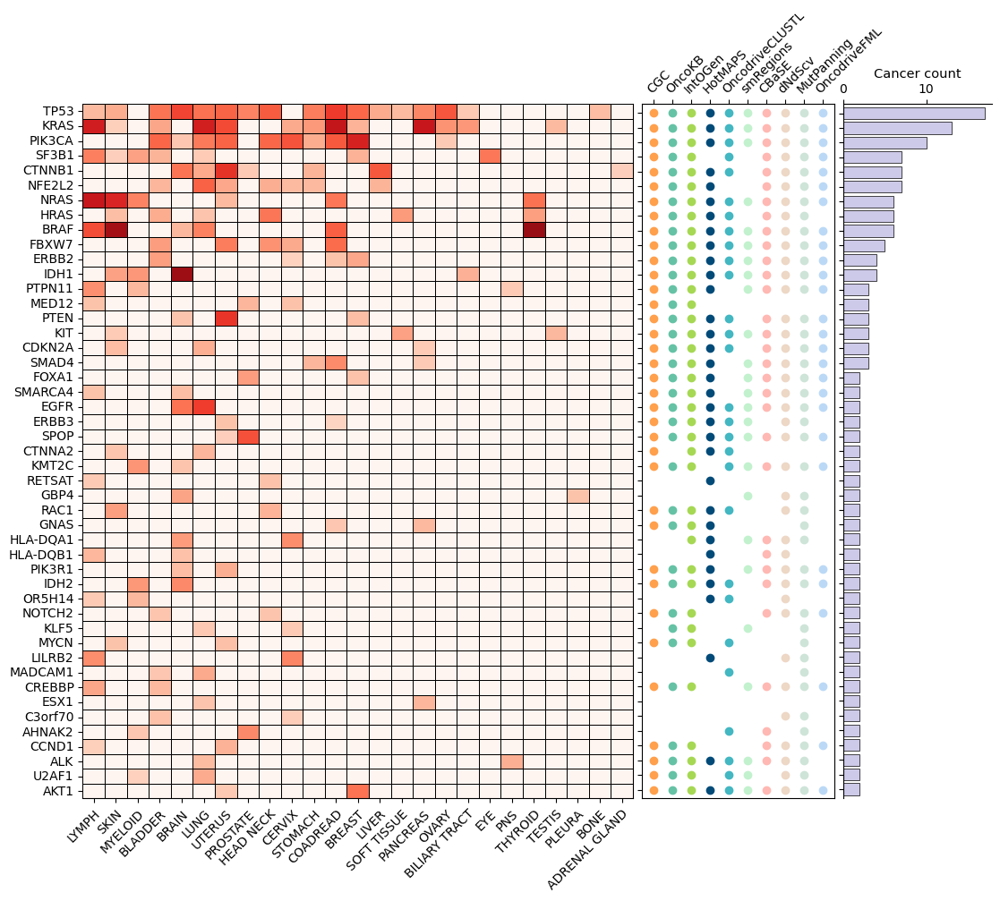

In [460]:
def plot_landscape(df, 
                   gene_colors, 
                   lut, 
                   gene_hits_count, 
                   cohort_hits_count,
                   colors_dict,
                   names_dict,
                   annot_df,
                   df_anomaly=None,
                   figsize=(16,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   ax6_margin=0.018,
                   ax6_xmargin=0.07,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   divergent_palette=False,
                   color_gene=False,
                   plot_cgc_specific=False,
                   right_ax_ylabel="Cohort count"):
    
    if df_anomaly is not None:
        df_binary = df
        df = df_anomaly
        cmap = "vlag"
        cmap = create_custom_colormap()
    else:
        colors = ["lightgray", "gray"] 
        cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))
    if divergent_palette:
        cmap = sns.color_palette("coolwarm", as_cmap=True)
    
    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    gene_sums = gene_hits_count["Oncodrive3D"].values

    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, 3, 
                           figsize=figsize, 
                           gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios})
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,2]
    ax5 = ax[0,2]
    ax6 = ax[1,1]
    
    # Create the heatmap
    if df_anomaly is not None and divergent_palette:
        vmax = df_anomaly.max().max()
        vmin = -vmax
    else:
        vmax, vmin = None, None
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black", vmax=vmax, vmin=vmin)
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    
    # Add bars for the right axis
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5)
    ax4.set_yticks(np.arange(len(gene_sums)))
    ax4.set_yticklabels([])
    ax4.set_xlabel(right_ax_ylabel, fontsize=10.5)
    ax4.invert_yaxis()
    
    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)
    
    # Add annotation track
    # ====================
    
    genes = annot_df['Gene']
    annot_df = annot_df.drop(columns=['Gene'])
    
    # Loop through each column
    for j, col in enumerate(annot_df.columns):
        # Get the indices where the value is 1
        indices = annot_df.index[annot_df[col] == 1].tolist()
        ax6.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    ax6.set_yticks(np.arange(len(gene_sums)))
    ax6.set_yticklabels([])
    ax6.set_xticks(range(len(annot_df.columns)))
    ax6.set_xticklabels([names_dict[col] for col in annot_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    
    # ax6.set_xlabel("Annotation", fontsize=10.5)
    ax6.invert_yaxis()
    
    ax6.xaxis.tick_top()
    ax6.xaxis.set_label_position('top')
  
    
    # Details
    ax1.remove() #### TO DEL
    ax2.remove()
    ax5.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    ax1.margins(x=ax1_margin, tight=True)
    ax4.margins(y=ax4_margin, tight=True)
    ax6.margins(y=ax6_margin, x=ax6_xmargin, tight=True)

    plt.show()


######## GO ########
# ---------------- #

top_cohorts_n=None
top_genes_n=47 

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()

anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                             cohort_df, 
                                                                                             top_cohorts_n=top_cohorts_n, 
                                                                                             top_genes_n=top_genes_n, 
                                                                                             anomaly_dict=anomaly_dict,
                                                                                             cgc_specific=True,
                                                                                             cgc_df=cgc_df, 
                                                                                             cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                             grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

annot_cols = ["Gene", "cgc", "oncokb", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(13.1,13.3),
               width_ratios=[1, 0.35, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-1.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.013,
               ax6_xmargin=0.07,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")

In [457]:
annot_df

,Gene,cgc,oncokb,intogen,hotmaps,clustl,smreg,cbase,dndscv,mutpan,fml
0,TP53,1,1,1,1,1,1,1,1,1,1
1,KRAS,1,1,1,1,1,1,1,1,1,1
2,PIK3CA,1,1,1,1,1,1,1,1,1,1
3,SF3B1,1,1,1,0,1,0,1,1,1,1
4,CTNNB1,1,1,1,1,1,0,1,1,1,1
5,NFE2L2,1,1,1,1,0,0,1,1,1,1
6,NRAS,1,1,1,1,1,1,1,1,1,1
7,HRAS,1,1,1,1,1,0,1,1,1,0
8,BRAF,1,1,1,1,1,1,1,1,1,1
9,FBXW7,1,1,1,1,1,1,1,1,1,1


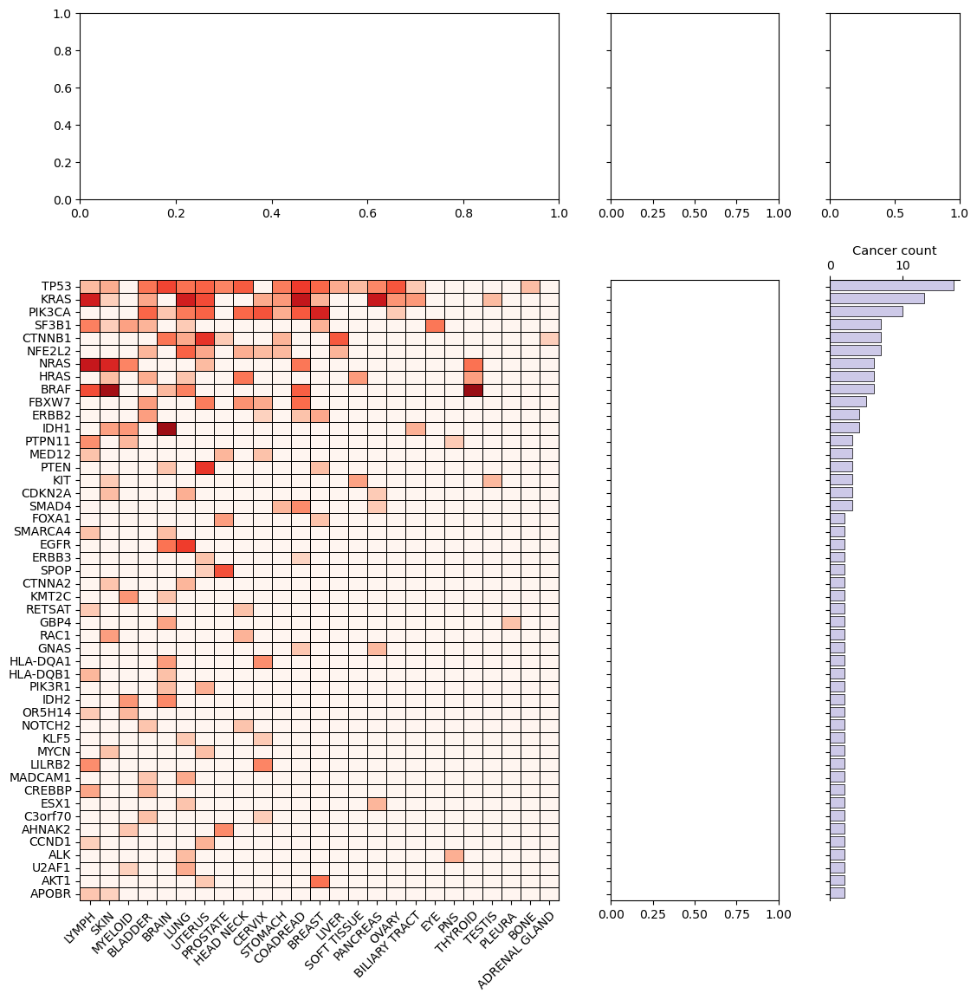

In [437]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

def plot_landscape(df, 
                   gene_colors, 
                   lut, 
                   gene_hits_count, 
                   cohort_hits_count,
                   colors_dict,
                   names_dict,
                   annot_df,
                   df_anomaly=None,
                   figsize=(16,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   ax6_margin=0.018,
                   ax6_xmargin=0.07,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   divergent_palette=False,
                   color_gene=False,
                   plot_cgc_specific=False,
                   right_ax_ylabel="Cohort count"):
    
    if df_anomaly is not None:
        df_binary = df
        df = df_anomaly
        cmap = "vlag"
        cmap = create_custom_colormap()
    else:
        colors = ["lightgray", "gray"] 
        cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))
    if divergent_palette:
        cmap = sns.color_palette("coolwarm", as_cmap=True)
    
    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    gene_sums = gene_hits_count["Oncodrive3D"].values

    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, 3, 
                           figsize=figsize, 
                           gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios})
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,2]
    ax5 = ax[0,2]
    ax6 = ax[1,1]
    
    # Create the heatmap
    if df_anomaly is not None and divergent_palette:
        vmax = df_anomaly.max().max()
        vmin = -vmax
    else:
        vmax, vmin = None, None
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black", vmax=vmax, vmin=vmin)
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    
    # Add bars for the right axis
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5)
    ax4.set_yticks(np.arange(len(gene_sums)))
    ax4.set_yticklabels([])  # Remove y-tick labels from the bar plot
    ax4.set_xlabel(right_ax_ylabel, fontsize=10.5)
    ax4.invert_yaxis()
    
    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)
    
    # Add annotation track
    # ====================
    
    genes = annot_df['Gene']
    annot_df = annot_df.drop(columns=['Gene'])
    
    # # Loop through each column
    # for j, col in enumerate(annot_df.columns):
    #     # Get the indices where the value is 1
    #     indices = annot_df.index[annot_df[col] == 1].tolist()
    #     ax6.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    # # Set y-ticks to match heatmap and bar plot
    # ax6.set_yticks(np.arange(len(gene_sums)))
    # ax6.set_yticklabels([])  # Remove y-tick labels from the scatter plot
    # ax6.set_xticks(range(len(annot_df.columns)))
    # ax6.set_xticklabels([names_dict[col] for col in annot_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    
    # # ax6.set_xlabel("Annotation", fontsize=10.5)
    # ax6.invert_yaxis()
    
    # ax6.xaxis.tick_top()
    # ax6.xaxis.set_label_position('top')
  
    
    # Details
    ax1.remove() #### TO DEL
    ax2.remove()
    ax5.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    ax1.margins(x=ax1_margin, tight=True)
    ax4.margins(y=ax4_margin, tight=True)
    ax6.margins(y=ax6_margin, x=ax6_xmargin, tight=True)

    plt.show()



import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

def plot_landscape(df, 
                   gene_colors, 
                   lut, 
                   gene_hits_count, 
                   cohort_hits_count,
                   colors_dict,
                   names_dict,
                   annot_df,
                   df_anomaly=None,
                   figsize=(16,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.1),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   ax6_margin=0.018,
                   ax6_xmargin=0.07,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.3, 0.015, .2],
                   intogen_label=False,
                   intogen_label_table=None,
                   filename=None,
                   divergent_palette=False,
                   color_gene=False,
                   plot_cgc_specific=False,
                   right_ax_ylabel="Cohort count"):
    
    if df_anomaly is not None:
        df_binary = df
        df = df_anomaly
        cmap = "vlag"
        cmap = create_custom_colormap()
    else:
        colors = ["lightgray", "gray"] 
        cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))
    if divergent_palette:
        cmap = sns.color_palette("coolwarm", as_cmap=True)
    
    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    gene_sums = gene_hits_count["Oncodrive3D"].values

    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, 3, 
                           figsize=figsize, 
                           gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios},
                           sharey='row')  # Share y-axis across rows
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,2]
    ax5 = ax[0,2]
    ax6 = ax[1,1]
    
    # Create the heatmap
    if df_anomaly is not None and divergent_palette:
        vmax = df_anomaly.max().max()
        vmin = -vmax
    else:
        vmax, vmin = None, None
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=0.5, 
                linecolor="black", vmax=vmax, vmin=vmin)
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    
    # Add bars for the right axis
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black", lw=0.5, align='edge')
    #ax4.set_yticks(np.arange(len(gene_sums)))
    #ax4.set_yticklabels(row_labels)  # Set y-tick labels to match the heatmap
    ax4.set_xlabel(right_ax_ylabel, fontsize=10.5)
    # ax4.invert_yaxis()
    
    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)
    
    # # Add annotation track
    # # ====================
    
    # genes = annot_df['Gene']
    # annot_df = annot_df.drop(columns=['Gene'])
    
    # # Loop through each column
    # for j, col in enumerate(annot_df.columns):
    #     # Get the indices where the value is 1
    #     indices = annot_df.index[annot_df[col] == 1].tolist()
    #     ax6.scatter([j] * len(indices), indices, color=colors_dict[names_dict[col]])
    
    # # Set y-ticks to match heatmap and bar plot
    # ax6.set_yticks(np.arange(len(gene_sums)))
    # ax6.set_yticklabels([])  # Remove y-tick labels from the scatter plot
    # ax6.set_xticks(range(len(annot_df.columns)))
    # ax6.set_xticklabels([names_dict[col] for col in annot_df.columns], rotation=45, rotation_mode="anchor", ha='left') 
    
    # # ax6.set_xlabel("Annotation", fontsize=10.5)
    # ax6.invert_yaxis()
    
    # ax6.xaxis.tick_top()
    # ax6.xaxis.set_label_position('top')
  
    # # Details
    # ax1.remove() #### TO DEL
    # ax2.remove()
    # ax5.remove()
    # plt.subplots_adjust(wspace=wspace, hspace=hspace)
    # ax1.margins(x=ax1_margin, tight=True)
    # ax4.margins(y=ax4_margin, tight=True)
    # ax6.margins(y=ax6_margin, x=ax6_xmargin, tight=True)

    plt.show()


# top_cohorts_n=None
# top_genes_n=48 

# o3d_output = get_anomaly_df(genetable, o3d_output_dir)
# o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
# o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()

# anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
#                                                                           o3d_output["GENERAL_CANCER_TYPE"].values, 
#                                                                           o3d_output["Clustering_score"].values)}

# df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
#                                                                                              cohort_df, 
#                                                                                              top_cohorts_n=top_cohorts_n, 
#                                                                                              top_genes_n=top_genes_n, 
#                                                                                              anomaly_dict=anomaly_dict,
#                                                                                              cgc_specific=True,
#                                                                                              cgc_df=cgc_df, 
#                                                                                              cohorts_parent_dict=cohorts_tissue_parent_dict,
#                                                                                              grouped_by_cancer=True)

# df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
# gene_colors, lut = get_gene_annotation(df_binary, genetable)

# annot_cols = ["Gene", "cgc", "oncokb", "intogen", "hotmaps", "clustl", "smreg", "cbase", "dndscv", "mutpan", "fml"]
# annot_df = get_annot_gene_df(df_binary.index, genetable, uniq_drivers_df, oncokb_df, cgc_df)[annot_cols]


plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               colors_dict=colors_dict,
               names_dict=names_dict,
               annot_df=annot_df,
               df_anomaly=df_anomaly,
               figsize=(13.1,13.3),
               width_ratios=[1, 0.35, 0.27],
               height_ratios=[0.3, 1],
               legend_box=(-1.5, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               ax6_margin=0.013,
               ax6_xmargin=0.07,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")

### All cohorts grouped by general cancer type

In [36]:
def get_gene_cohorts_binary(genetable_df, 
                            cohort_df, 
                            top_cohorts_n=None, 
                            top_genes_n=None, 
                            anomaly_dict=None,
                            rm_empty_cols=True,
                            log_score=True,
                            cgc_specific=False,
                            cgc_df=None, 
                            cohorts_parent_dict=None,
                            grouped_by_cancer=False):

    hits_df = get_hits(genetable_df)

    # Count by general cancer
    if grouped_by_cancer:
        hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
        hits_df = hits_df.drop(columns=["Uniprot_ID", "Cancer", "Cohort", "Fish"]).drop_duplicates().reset_index(drop=True)
        target_col = "General_cancer"
        # Get count of cancer a gene has been detected as significant across all cohorts
        gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D").sort_values("Oncodrive3D", ascending=False).set_index("Gene")
        # For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
        cohort_hits_count = hits_df.groupby("General_cancer").apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False)

    # Count by cohort
    else:
        target_col = "Cohort"
        if cgc_specific:
            hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_parent_dict)
            cohort_cgc_count = hits_df.groupby("Cohort").apply(lambda x: pd.Series({
                    "CGC_specific": sum(x["CGC_specific"]),
                    "CGC_not_specific": sum(x["CGC_not_specific"]),
                    "Not_CGC": sum(x["Not_CGC"])
                })).reset_index()
        else:
            hits_df["Not_CGC"] = hits_df.apply(lambda x: 1 if x["CGC"] != 1 else 0, axis=1)
            cohort_cgc_count = hits_df.groupby("Cohort").apply(lambda x: pd.Series({
                "CGC": sum(x["CGC"]),
                "Not_CGC": sum(x["Not_CGC"])
            })).reset_index()
    
        gene_hits_count = hits_df.groupby("Gene").sum()[["Oncodrive3D"]].sort_values("Oncodrive3D", ascending=False)
        cohort_hits_count = hits_df.groupby("Cohort").sum()[["Oncodrive3D"]].sort_values("Oncodrive3D", ascending=False)
    
    if top_genes_n is None:
        top_genes_n = len(gene_hits_count)
    if top_cohorts_n is None:
        top_cohorts_n = len(cohort_hits_count)
    top_genes = gene_hits_count[:top_genes_n].index
    top_cohorts = cohort_hits_count[:top_cohorts_n].index

    # Get df anomaly and binary
    df_anomaly = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    df_binary = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    for cohort in top_cohorts:
        genes = hits_df[hits_df[target_col] == cohort].Gene.values
        genes = [gene for gene in genes if gene in df_anomaly.columns]
        # Df anomaly
        scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
        df_anomaly.loc[cohort, genes] = scores
        # Df binary
        df_binary.loc[cohort, genes] = 1

    df_anomaly = df_anomaly.T 
    df_binary = df_binary.T 
    if len(cohort_df) == 1:
        df_anomaly = df_anomaly.loc[hits_df.Gene]
        df_binary = df_binary.loc[hits_df.Gene]
        
    if rm_empty_cols:
        df_anomaly = df_anomaly.loc[:, ~(df_anomaly == 0).all()]
        df_binary = df_binary.loc[:, ~(df_binary == False).all()]

    gene_hits_count = gene_hits_count.loc[df_anomaly.index]
    cohort_hits_count = cohort_hits_count.loc[[cohort for cohort in cohort_hits_count.index if cohort in df_anomaly.columns]]

    if not grouped_by_cancer:
        cohort_hits_count = cohort_hits_count.merge(cohort_cgc_count, on="Cohort")
    
    return df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count

In [29]:

    



def get_gene_cohorts_binary(genetable_df, 
                            cohort_df, 
                            top_cohorts_n=None, 
                            top_genes_n=None, 
                            anomaly_dict=None,
                            rm_empty_cols=True,
                            log_score=True,
                            cgc_specific=False,
                            cgc_df=None, 
                            cohorts_parent_dict=None):

    hits_df = get_hits(genetable_df)
    
    gene_hits_count = hits_df.groupby("Gene").sum()[["Oncodrive3D"]].sort_values("Oncodrive3D", ascending=False)
    cohort_hits_count = hits_df.groupby("Cohort").sum()[["Oncodrive3D"]].sort_values("Oncodrive3D", ascending=False)
    
    if top_genes_n is None:
        top_genes_n = len(gene_hits_count)
    if top_cohorts_n is None:
        top_cohorts_n = len(cohort_hits_count)
    top_genes = gene_hits_count[:top_genes_n].index
    top_cohorts = cohort_hits_count[:top_cohorts_n].index
    
    df = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    for cohort in top_cohorts:
        genes = hits_df[hits_df["Cohort"] == cohort].Gene.values
        genes = [gene for gene in genes if gene in df.columns]
        if anomaly_dict:
            scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
            df.loc[cohort, genes] = scores
        else:
            df.loc[cohort, genes] = 1
    
    df = df.T 
    if len(cohort_df) == 1:
        df = df.loc[hits_df.Gene]
        
    if rm_empty_cols:
        if anomaly_dict:
            df = df.loc[:, ~(df == 0).all()]
        else:
            df = df.loc[:, ~(df == False).all()]

    gene_hits_count = gene_hits_count.loc[df.index]
    cohort_hits_count = cohort_hits_count.loc[[cohort for cohort in cohort_hits_count.index if cohort in df.columns]]

    if cgc_specific:
        hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_parent_dict)
        cohort_cgc_count = hits_df.groupby("Cohort").apply(lambda x: pd.Series({
                "CGC_specific": sum(x["CGC_specific"]),
                "CGC_not_specific": sum(x["CGC_not_specific"]),
                "Not_CGC": sum(x["Not_CGC"])
            })).reset_index()
        
    else:
        hits_df["Not_CGC"] = hits_df.apply(lambda x: 1 if x["CGC"] != 1 else 0, axis=1)
        cohort_cgc_count = hits_df.groupby("Cohort").apply(lambda x: pd.Series({
            "CGC": sum(x["CGC"]),
            "Not_CGC": sum(x["Not_CGC"])
        })).reset_index()

    
    cohort_hits_count = cohort_hits_count.merge(cohort_cgc_count, on="Cohort")
    
    return df, hits_df, gene_hits_count, cohort_hits_count


def get_gene_cancers_binary(genetable_df, 
                            cohort_df, 
                            top_cohorts_n=None, 
                            top_genes_n=None, 
                            anomaly_dict=None,
                            rm_empty_cols=True,
                            log_score=True,
                            cgc_specific=False,
                            cgc_df=None, 
                            cohorts_parent_dict=None):

    # Get hits with CGC specific info
    hits_df = get_hits(genetable)
    hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
    hits_df = hits_df.drop(columns=["Uniprot_ID", "Cancer", "Cohort", "Fish"]).drop_duplicates().reset_index(drop=True)
    
    # Get count of cancer a gene has been detected as significant across all cohorts
    gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D").sort_values("Oncodrive3D", ascending=False).set_index("Gene")
    
    # For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
    cancer_hits_count = hits_df.groupby("General_cancer").apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False)

    if top_genes_n is None:
        top_genes_n = len(gene_hits_count)
    if top_cohorts_n is None:
        top_cohorts_n = len(cancer_hits_count)
    
    top_genes = gene_hits_count[:top_genes_n].index
    top_cohorts = cancer_hits_count[:top_cohorts_n].index

    
    df = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    for cohort in top_cohorts:
        genes = hits_df[hits_df["General_cancer"] == cohort].Gene.values
        genes = [gene for gene in genes if gene in df.columns]
        if anomaly_dict:
            scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
            df.loc[cohort, genes] = scores
        else:
            df.loc[cohort, genes] = 1
    
    df = df.T 
    if len(cohort_df) == 1:
        df = df.loc[hits_df.Gene]
        
    if rm_empty_cols:
        if anomaly_dict:
            df = df.loc[:, ~(df == 0).all()]
        else:
            df = df.loc[:, ~(df == False).all()]


    gene_hits_count = gene_hits_count.loc[df.index]
    cancer_hits_count = cancer_hits_count.loc[[cohort for cohort in cancer_hits_count.index if cohort in df.columns]]

    return df, hits_df, gene_hits_count, cancer_hits_count

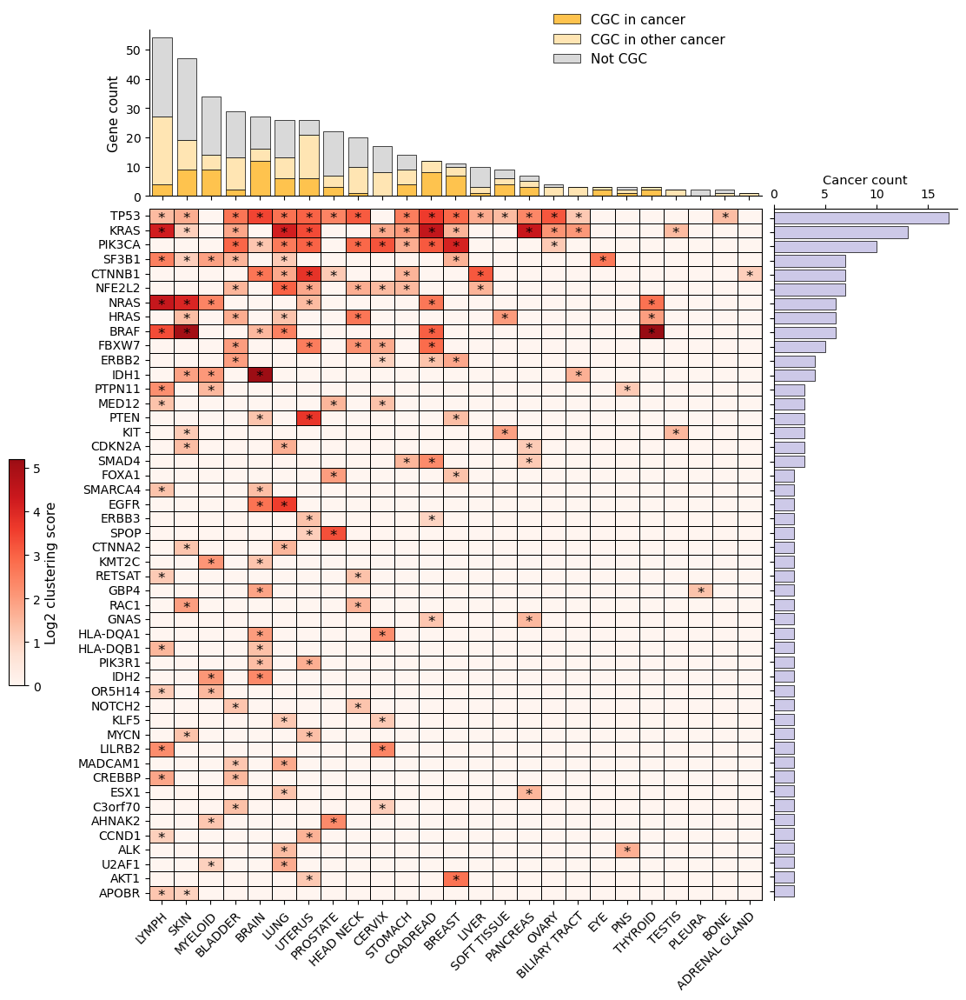

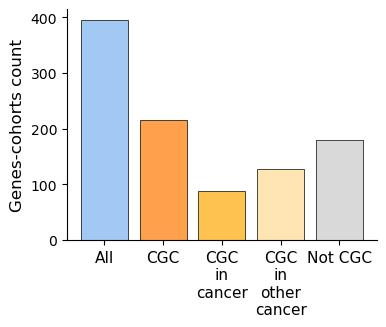

In [40]:
top_cohorts_n=None
top_genes_n=48 

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()

anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict,
                                                                                  cgc_specific=True,
                                                                                  cgc_df=cgc_df, 
                                                                                  cohorts_parent_dict=cohorts_tissue_parent_dict,
                                                                                  grouped_by_cancer=True)

df_anomaly.columns = [cancer.replace("_", " ") for cancer in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               df_anomaly=df_anomaly,
               figsize=(12,13),
               width_ratios=[1, 0.3],
               height_ratios=[0.24, 1],
               legend_box=(-0.2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True,
               right_ax_ylabel="Cancer count")
    

# Get summary CGC hits across genetable
plot_o3d_cgc_hits(hits_df)

### Clean up the following (AFTER RESTARTING THE KERNEL AND RE-RUNNING DOWN HERE)

In [1990]:
hits_df = get_hits(genetable)
hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
hits_df

,Gene,Uniprot_ID,Cancer,Cohort,CGC,Fish,Oncodrive3D,General_cancer,CGC_specific,Not_CGC,CGC_not_specific
0,PIK3CA,P42336,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,BLADDER,0,0,1
1,RXRA,F1D8Q5,BLCA,HARTWIG_WGS_BLCA_2023,0,0,1,BLADDER,0,1,0
2,FGFR3,P22607,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,BLADDER,1,0,0
3,FBXW7,Q969H0,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,BLADDER,0,0,1
4,TP53,K7PPA8,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,BLADDER,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
614,MED12,Q93074,PRAD,TCGA_WXS_PRAD,1,0,1,PROSTATE,0,0,1
615,CTNNB1,A0A024R2Q3,PRAD,TCGA_WXS_PRAD,1,0,1,PROSTATE,0,0,1
616,TP53,K7PPA8,SOFT_TISSUE,TCGA_WXS_SARC,1,0,1,SOFT_TISSUE,0,0,1
617,HRAS,P01112,PGNG,TCGA_WXS_PGNG,1,0,1,SOFT_TISSUE,0,0,1


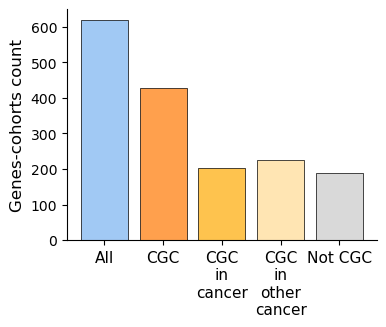

In [1991]:
## Get summary CGC hits across genetable
s = hits_df[["Oncodrive3D", "CGC", "CGC_specific", "CGC_not_specific", "Not_CGC"]].sum()
s.index = "All", "CGC", "CGC\nin\ncancer", "CGC\nin\nother\ncancer", "Not CGC"

plt.figure(figsize=(4, 3))
plt.bar(s.index, s.values, color=["#A1C9F4", "#ffa04d", "#fec34e", "#ffe5b3", "#d9d9d9"], edgecolor='black', lw=0.5)

plt.xlabel(None)
plt.ylabel('Genes-cohorts count', fontsize=12)
plt.xticks(fontsize=11)

ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

In [1992]:
# Get number of cohorts of a given general cancer type where each gene has been detected 
lung_df = hits_df[hits_df["General_cancer"] == "LUNG"]

lung_gene_hits_count = lung_df.groupby("Gene").sum()["Oncodrive3D"].reset_index()
lung_gene_hits_count = lung_gene_hits_count.sort_values("Oncodrive3D", ascending=False).reset_index(drop=True)
lung_gene_hits_count

,Gene,Oncodrive3D
0,TP53,10
1,KRAS,8
2,EGFR,5
3,PIK3CA,4
4,NFE2L2,2
5,BRAF,2
6,CTNNB1,2
7,U2AF1,2
8,ZNF395,1
9,UGT2B17,1


In [2111]:
def get_cgc_specific_count_for_ttype(hits_df_ttype):

    hits_df_ttype = hits_df_ttype[["Gene", "CGC_specific", "Not_CGC", "CGC_not_specific"]].drop_duplicates().reset_index(drop=True)
    hits_df_ttype = hits_df_ttype.drop(columns=["Gene", "Uniprot_ID"]).sum()

    return hits_df_ttype

# For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
hits_df_ttype = hits_df.groupby("General_cancer").apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False).reset_index()
hits_df_ttype

In [2063]:
top_cohorts_n=40
top_genes_n=40 

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

# df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
#                                                                                   cohort_df, 
#                                                                                   top_cohorts_n=top_cohorts_n, 
#                                                                                   top_genes_n=top_genes_n, 
#                                                                                   anomaly_dict=anomaly_dict)

# df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
#                                                                                   cohort_df, 
#                                                                                   top_cohorts_n=top_cohorts_n, 
#                                                                                   top_genes_n=top_genes_n, 
#                                                                                   anomaly_dict=False)

In [2045]:
cohort_df

,COHORT,CANCER_TYPE,PLATFORM,MUTATIONS,SAMPLES,GENERAL_CANCER_TYPE
0,HARTWIG_WGS_BLCA_2023,BLCA,WGS,5017561,144,BLADDER
1,HARTWIG_WGS_EGC_2023,EGC,WGS,573540,21,STOMACH
2,HARTWIG_WGS_LMS_2023,LMS,WGS,339549,43,SOFT_TISSUE
3,CBIOP_WGS_STAD_ONCOSG_2018,STAD,WGS,861309,147,STOMACH
4,CBIOP_WXS_CM_VALLEN_2018,MEL,WXS,132960,151,SKIN
...,...,...,...,...,...,...
266,TCGA_WXS_PRCC,PRCC,WXS,34566,276,KIDNEY
267,TCGA_WXS_PRAD,PRAD,WXS,34239,494,PROSTATE
268,TCGA_WXS_PLMESO,PLMESO,WXS,3980,82,PLEURA
269,TCGA_WXS_SARC,SARC,WXS,31484,234,SOFT_TISSUE


### Good one

In [2080]:
top_cohorts_n=40
top_genes_n=40 

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output = o3d_output.merge(cohort_df.rename(columns={"COHORT" : "Cohort"})[["Cohort", "GENERAL_CANCER_TYPE"]], on="Cohort")
o3d_output = o3d_output[["GENERAL_CANCER_TYPE", 'Gene', "Clustering_score"]].groupby(["GENERAL_CANCER_TYPE", 'Gene']).max().reset_index()

anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cancers_binary(genetable_subset, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict,
                                                                                  cgc_specific=True,
                                                                                  cgc_df=cgc_df, 
                                                                                  cohorts_parent_dict=cohorts_tissue_parent_dict)

df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cancers_binary(genetable_subset, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=False,
                                                                                  cgc_specific=True,
                                                                                  cgc_df=cgc_df, 
                                                                                  cohorts_parent_dict=cohorts_tissue_parent_dict)

gene_colors, lut = get_gene_annotation(df_binary, genetable)

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               df_anomaly=df_anomaly,
               figsize=(11,10),
               width_ratios=[1, 0.2],
               height_ratios=[0.3, 1],
               legend_box=(-0.2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True)

,GENERAL_CANCER_TYPE,Gene,Clustering_score
0,ADRENAL_GLAND,ADAM33,1.653467
1,ADRENAL_GLAND,ADGRL4,1.604568
2,ADRENAL_GLAND,BACH2,1.891935
3,ADRENAL_GLAND,CLTB,1.239211
4,ADRENAL_GLAND,CRYAB,1.467292
...,...,...,...
48227,VULVA,ZNF142,1.942959
48228,VULVA,ZNF285,1.809062
48229,VULVA,ZNF385B,1.458845
48230,VULVA,ZNF418,1.746603


In [2081]:
anomaly_dict = {f"{gene}-{cancer}" : score for gene, cancer, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["GENERAL_CANCER_TYPE"].values, 
                                                                          o3d_output["Clustering_score"].values)}
anomaly_dict

{'ADAM33-ADRENAL_GLAND': 1.653467166256414,
 'ADGRL4-ADRENAL_GLAND': 1.60456808287175,
 'BACH2-ADRENAL_GLAND': 1.8919352214734664,
 'CLTB-ADRENAL_GLAND': 1.2392110279502682,
 'CRYAB-ADRENAL_GLAND': 1.4672919514145064,
 'CTNNB1-ADRENAL_GLAND': 2.9687460714975957,
 'DLGAP3-ADRENAL_GLAND': 1.9291096350326784,
 'GLB1L2-ADRENAL_GLAND': 1.476214830039982,
 'MAP3K14-ADRENAL_GLAND': 1.846207608842762,
 'MICALL1-ADRENAL_GLAND': 1.810169022125833,
 'MTRFR-ADRENAL_GLAND': 0.9198072046128696,
 'OR4N2-ADRENAL_GLAND': 0.8705226732081196,
 'PLAGL1-ADRENAL_GLAND': 1.7100883404789358,
 'PLEKHG6-ADRENAL_GLAND': 1.2467086576029298,
 'POLE-ADRENAL_GLAND': 1.8797973489226292,
 'SDS-ADRENAL_GLAND': 1.2192647862500958,
 'SKIC2-ADRENAL_GLAND': 1.5051460461348627,
 'SLC10A2-ADRENAL_GLAND': 1.4032719984803392,
 'SLC25A37-ADRENAL_GLAND': 1.4732521149912188,
 'SLIT2-ADRENAL_GLAND': 1.5291625658616377,
 'SMC3-ADRENAL_GLAND': 1.2827438232386354,
 'TP53-ADRENAL_GLAND': 1.4984790586354684,
 'ZNF804B-ADRENAL_GLAND': 2

In [2170]:
df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cancers_binary(genetable_subset, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict,
                                                                                  cgc_specific=True,
                                                                                  cgc_df=cgc_df, 
                                                                                  cohorts_parent_dict=cohorts_tissue_parent_dict)

df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cancers_binary(genetable_subset, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=False,
                                                                                  cgc_specific=True,
                                                                                  cgc_df=cgc_df, 
                                                                                  cohorts_parent_dict=cohorts_tissue_parent_dict)


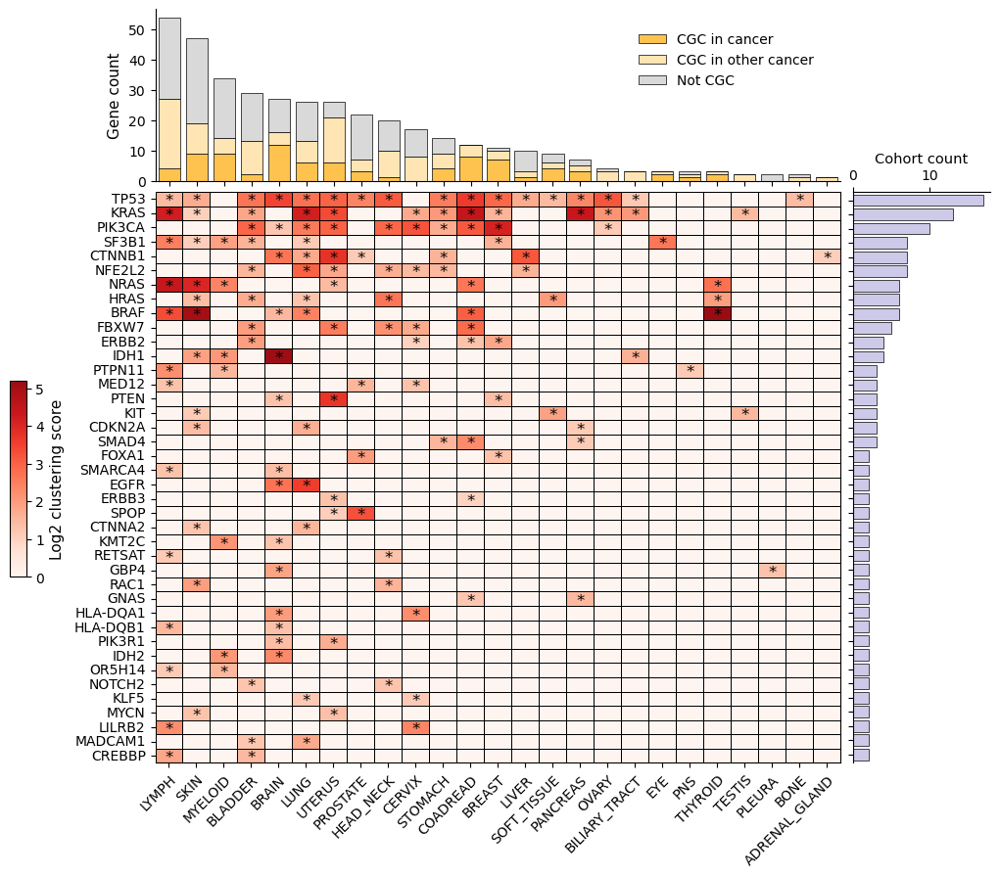

In [2171]:
gene_colors, lut = get_gene_annotation(df_binary, genetable)

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               df_anomaly=df_anomaly,
               figsize=(11,10),
               width_ratios=[1, 0.2],
               height_ratios=[0.3, 1],
               legend_box=(-0.2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.03,
               plot_cgc_specific=True)

In [2114]:
# Get count of cancer a gene has been detected as significant across all cohorts

hits_df = get_hits(genetable)
hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
hits_df = hits_df.drop(columns=["Uniprot_ID", "Cancer", "Cohort", "Fish"]).drop_duplicates().reset_index(drop=True)
gene_hits_count = hits_df.groupby("Gene").apply(lambda x: sum(x["Oncodrive3D"])).reset_index(name="Cancer_count").sort_values("Cancer_count", ascending=False)
gene_hits_count

,Gene,Cancer_count
240,TP53,17
139,KRAS,13
180,PIK3CA,10
210,SF3B1,7
55,CTNNB1,7
...,...,...
104,H3-3A,1
105,H3C2,1
106,HCAR3,1
107,HLA-A,1


In [2115]:
# lung_gene_hits_count = lung_df.groupby("Gene").sum()["Oncodrive3D"].reset_index()
# lung_gene_hits_count = lung_gene_hits_count.sort_values("Oncodrive3D", ascending=False).reset_index(drop=True)
# lung_gene_hits_count

In [ ]:
df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict,
                                                                                  cgc_specific=True,
                                                                                  cgc_df=cgc_df, 
                                                                                  cohorts_parent_dict=cohorts_tissue_parent_dict)

In [2122]:
def get_cgc_specific_count_for_ttype(hits_df_ttype):

    hits_df_ttype = hits_df_ttype[["Gene", "Oncodrive3D", "CGC_specific", "Not_CGC", "CGC_not_specific"]].drop_duplicates().reset_index(drop=True)
    hits_df_ttype = hits_df_ttype.drop(columns=["Gene"]).sum()

    return hits_df_ttype


# For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
hits_df_ttype = hits_df.groupby("General_cancer").apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False).reset_index()
hits_df_ttype

,General_cancer,Oncodrive3D,CGC_specific,Not_CGC,CGC_not_specific
0,LYMPH,54,4,27,23
1,SKIN,47,9,28,10
2,MYELOID,34,9,20,5
3,BLADDER,29,2,16,11
4,BRAIN,27,12,11,4
5,LUNG,26,6,13,7
6,UTERUS,26,6,5,15
7,PROSTATE,22,3,15,4
8,HEAD_NECK,20,1,10,9
9,CERVIX,17,0,9,8


In [2119]:
hits_df

,Gene,CGC,Oncodrive3D,General_cancer,CGC_specific,Not_CGC,CGC_not_specific
0,PIK3CA,1,1,BLADDER,0,0,1
1,RXRA,0,1,BLADDER,0,1,0
2,FGFR3,1,1,BLADDER,1,0,0
3,FBXW7,1,1,BLADDER,0,0,1
4,TP53,1,1,BLADDER,0,0,1
...,...,...,...,...,...,...,...
390,TRIM49C,0,1,STOMACH,0,1,0
391,SPTA1,0,1,STOMACH,0,1,0
392,TP53,1,1,SOFT_TISSUE,0,0,1
393,HRAS,1,1,SOFT_TISSUE,0,0,1


In [2118]:
hits_df.groupby("General_cancer").apply(lambda x: get_cgc_specific_count_for_ttype(x))

,CGC_specific,Not_CGC,CGC_not_specific
General_cancer,,,
ADRENAL_GLAND,0,0,1
BILIARY_TRACT,0,0,3
BLADDER,2,16,11
BONE,0,1,1
BRAIN,12,11,4
BREAST,7,1,3
CERVIX,0,9,8
COADREAD,8,0,4
EYE,2,0,1


In [2168]:
def get_gene_cancers_binary(genetable_df, 
                            cohort_df, 
                            top_cohorts_n=None, 
                            top_genes_n=None, 
                            anomaly_dict=None,
                            rm_empty_cols=True,
                            log_score=True,
                            cgc_specific=False,
                            cgc_df=None, 
                            cohorts_parent_dict=None):

    # Get hits with CGC specific info
    hits_df = get_hits(genetable)
    hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
    hits_df = hits_df.drop(columns=["Uniprot_ID", "Cancer", "Cohort", "Fish"]).drop_duplicates().reset_index(drop=True)
    
    # Get count of cancer a gene has been detected as significant across all cohorts
    gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Oncodrive3D").sort_values("Oncodrive3D", ascending=False).set_index("Gene")
    
    # For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
    cancer_hits_count = hits_df.groupby("General_cancer").apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False)

    if top_genes_n is None:
        top_genes_n = len(gene_hits_count)
    if top_cohorts_n is None:
        top_cohorts_n = len(cancer_hits_count)
    
    top_genes = gene_hits_count[:top_genes_n].index
    top_cohorts = cancer_hits_count[:top_cohorts_n].index

    
    df = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
    for cohort in top_cohorts:
        genes = hits_df[hits_df["General_cancer"] == cohort].Gene.values
        genes = [gene for gene in genes if gene in df.columns]
        if anomaly_dict:
            scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
            df.loc[cohort, genes] = scores
        else:
            df.loc[cohort, genes] = 1
    
    df = df.T 
    if len(cohort_df) == 1:
        df = df.loc[hits_df.Gene]
        
    if rm_empty_cols:
        if anomaly_dict:
            df = df.loc[:, ~(df == 0).all()]
        else:
            df = df.loc[:, ~(df == False).all()]


    gene_hits_count = gene_hits_count.loc[df.index]
    cancer_hits_count = cancer_hits_count.loc[[cohort for cohort in cancer_hits_count.index if cohort in df.columns]]

    return df, hits_df, gene_hits_count, cancer_hits_count

In [2133]:
# Get hits with CGC specific info
hits_df = get_hits(genetable)
hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
hits_df = hits_df.drop(columns=["Uniprot_ID", "Cancer", "Cohort", "Fish"]).drop_duplicates().reset_index(drop=True)

# Get count of cancer a gene has been detected as significant across all cohorts
gene_hits_count = hits_df.groupby("Gene").apply(lambda x: len(x)).reset_index(name="Cancer_count").sort_values("Cancer_count", ascending=False).set_index("Gene")

# For a general cancer type get the number of unique CGC genes in that cancer, other cancer, not CGC
cohort_hits_count = hits_df.groupby("General_cancer").apply(lambda x: get_cgc_specific_count_for_ttype(x)).sort_values("Oncodrive3D", ascending=False)

In [2136]:
if top_genes_n is None:
    top_genes_n = len(gene_hits_count)
if top_cohorts_n is None:
    top_cohorts_n = len(cohort_hits_count)

top_genes = gene_hits_count[:top_genes_n].index
top_cohorts = cohort_hits_count[:top_cohorts_n].index

In [2139]:
hits_df

,Gene,CGC,Oncodrive3D,General_cancer,CGC_specific,Not_CGC,CGC_not_specific
0,PIK3CA,1,1,BLADDER,0,0,1
1,RXRA,0,1,BLADDER,0,1,0
2,FGFR3,1,1,BLADDER,1,0,0
3,FBXW7,1,1,BLADDER,0,0,1
4,TP53,1,1,BLADDER,0,0,1
...,...,...,...,...,...,...,...
390,TRIM49C,0,1,STOMACH,0,1,0
391,SPTA1,0,1,STOMACH,0,1,0
392,TP53,1,1,SOFT_TISSUE,0,0,1
393,HRAS,1,1,SOFT_TISSUE,0,0,1


In [2148]:
# log_score = True
rm_empty_cols=True


df = pd.DataFrame(0, index=top_cohorts, columns=top_genes)
for cohort in top_cohorts:
    genes = hits_df[hits_df["General_cancer"] == cohort].Gene.values
    genes = [gene for gene in genes if gene in df.columns]
    if anomaly_dict:
        scores = [np.log(anomaly_dict[f"{gene}-{cohort}"]) if log_score else anomaly_dict[f"{gene}-{cohort}"] for gene in genes]    
        df.loc[cohort, genes] = scores
    else:
        df.loc[cohort, genes] = 1

df = df.T 
if len(cohort_df) == 1:
    df = df.loc[hits_df.Gene]
    
if rm_empty_cols:
    if anomaly_dict:
        df = df.loc[:, ~(df == 0).all()]
    else:
        df = df.loc[:, ~(df == False).all()]

In [2151]:
gene_hits_count = gene_hits_count.loc[df.index]
cohort_hits_count = cohort_hits_count.loc[[cohort for cohort in cohort_hits_count.index if cohort in df.columns]]

### End

In [2026]:
def get_anomaly_df(genetable_df, o3d_output_dir):
    
    lst_cohort = []
    for cohort in genetable_df.Cohort.unique():
        cohort = "TCGA_WXS_SOFT_TISSUE" if cohort == "TCGA_WXS_SARC" else cohort
        df_cohort = pd.read_csv(f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv")
        df_cohort = df_cohort[["Cohort", "Gene", "Uniprot_ID", "qval", "C_gene", "C_pos", "Score_obs_sim_top_vol"]]
        df_cohort = df_cohort.dropna(subset="qval").rename(columns={"Score_obs_sim_top_vol" : "Clustering_score"})
        lst_cohort.append(df_cohort)

    anomaly_df = pd.concat(lst_cohort).reset_index(drop=True)
    anomaly_df = anomaly_df.merge(genetable_df[["Cohort", "Gene", "CGC", "Fish"]].drop_duplicates(), on=["Cohort", "Gene"], how="left")
    anomaly_df.Cohort = anomaly_df.Cohort.replace("TCGA_WXS_SOFT_TISSUE", "TCGA_WXS_SARC")
    
    return anomaly_df

In [2027]:
o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output

,Cohort,Gene,Uniprot_ID,qval,C_gene,C_pos,Clustering_score,CGC,Fish
0,HARTWIG_WGS_BLCA_2023,PIK3CA,P42336,0.0,1.0,[542 545 539],6.608875,1.0,0.0
1,HARTWIG_WGS_BLCA_2023,RXRA,F1D8Q5,0.0,1.0,[427 429],5.260005,0.0,0.0
2,HARTWIG_WGS_BLCA_2023,FGFR3,P22607,0.0,1.0,[248 249 373],5.135854,1.0,0.0
3,HARTWIG_WGS_BLCA_2023,FBXW7,Q969H0,0.0,1.0,[505 465],3.409612,1.0,0.0
4,HARTWIG_WGS_BLCA_2023,TP53,K7PPA8,0.0,1.0,[249 273 241 173 248 132 195 280 157 258 194 2...,3.377812,1.0,0.0
...,...,...,...,...,...,...,...,...,...
71189,TCGA_WXS_PGNG,SUSD4,Q5VX71,1.0,0.0,NaN,1.668006,0.0,0.0
71190,TCGA_WXS_PGNG,PMM1,A0A024R1U5,1.0,0.0,NaN,1.332350,0.0,0.0
71191,TCGA_WXS_PGNG,NAGK,A0A384N6G7,1.0,0.0,NaN,1.287737,0.0,0.0
71192,TCGA_WXS_PGNG,ADH6,P28332,1.0,0.0,NaN,1.279473,0.0,1.0


In [2031]:
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}
hits_df = get_hits(genetable)
hits_df

,Gene,Uniprot_ID,Cancer,Cohort,CGC,Fish,Oncodrive3D
0,PIK3CA,P42336,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1
1,RXRA,F1D8Q5,BLCA,HARTWIG_WGS_BLCA_2023,0,0,1
2,FGFR3,P22607,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1
3,FBXW7,Q969H0,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1
4,TP53,K7PPA8,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1
...,...,...,...,...,...,...,...
614,MED12,Q93074,PRAD,TCGA_WXS_PRAD,1,0,1
615,CTNNB1,A0A024R2Q3,PRAD,TCGA_WXS_PRAD,1,0,1
616,TP53,K7PPA8,SOFT_TISSUE,TCGA_WXS_SARC,1,0,1
617,HRAS,P01112,PGNG,TCGA_WXS_PGNG,1,0,1


In [2033]:
hits_df["Clustering_score"] = hits_df.apply(lambda x: anomaly_dict[f"{x.Gene}-{x.Cohort}"], axis=1)
hits_df

,Gene,Uniprot_ID,Cancer,Cohort,CGC,Fish,Oncodrive3D,Clustering_score
0,PIK3CA,P42336,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,6.608875
1,RXRA,F1D8Q5,BLCA,HARTWIG_WGS_BLCA_2023,0,0,1,5.260005
2,FGFR3,P22607,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,5.135854
3,FBXW7,Q969H0,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,3.409612
4,TP53,K7PPA8,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,3.377812
...,...,...,...,...,...,...,...,...
614,MED12,Q93074,PRAD,TCGA_WXS_PRAD,1,0,1,3.834154
615,CTNNB1,A0A024R2Q3,PRAD,TCGA_WXS_PRAD,1,0,1,2.550003
616,TP53,K7PPA8,SOFT_TISSUE,TCGA_WXS_SARC,1,0,1,4.302525
617,HRAS,P01112,PGNG,TCGA_WXS_PGNG,1,0,1,7.463746


In [2034]:
hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_tissue_parent_dict)
hits_df

,Gene,Uniprot_ID,Cancer,Cohort,CGC,Fish,Oncodrive3D,Clustering_score,General_cancer,CGC_specific,Not_CGC,CGC_not_specific
0,PIK3CA,P42336,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,6.608875,BLADDER,0,0,1
1,RXRA,F1D8Q5,BLCA,HARTWIG_WGS_BLCA_2023,0,0,1,5.260005,BLADDER,0,1,0
2,FGFR3,P22607,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,5.135854,BLADDER,1,0,0
3,FBXW7,Q969H0,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,3.409612,BLADDER,0,0,1
4,TP53,K7PPA8,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,3.377812,BLADDER,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
614,MED12,Q93074,PRAD,TCGA_WXS_PRAD,1,0,1,3.834154,PROSTATE,0,0,1
615,CTNNB1,A0A024R2Q3,PRAD,TCGA_WXS_PRAD,1,0,1,2.550003,PROSTATE,0,0,1
616,TP53,K7PPA8,SOFT_TISSUE,TCGA_WXS_SARC,1,0,1,4.302525,SOFT_TISSUE,0,0,1
617,HRAS,P01112,PGNG,TCGA_WXS_PGNG,1,0,1,7.463746,SOFT_TISSUE,0,0,1


In [2041]:
hits_df[hits_df["General_cancer"] == "LUNG"].groupby("Gene").max()

,Uniprot_ID,Cancer,Cohort,CGC,Fish,Oncodrive3D,Clustering_score,General_cancer,CGC_specific,Not_CGC,CGC_not_specific
Gene,,,,,,,,,,,
ALK,Q9UM73,NSCLC,HARTWIG_WGS_NSCLC_2023,1,0,1,4.137430,LUNG,1,0,0
ATG2A,Q2TAZ0,LUAD,CBIOP_WXS_LUAD_VALLEN_2018,0,0,1,3.621890,LUNG,0,1,0
BRAF,P15056,NSCLC,TCGA_WXS_LUAD,1,0,1,11.651959,LUNG,1,0,0
CDKN2A,K7PML8,LUSC,TCGA_WXS_LUSC,1,0,1,5.202005,LUNG,0,0,1
CTNNA2,P26232,LUAD,CBIOP_WXS_LUAD_VALLEN_2018,1,0,1,4.683756,LUNG,0,0,1
CTNNB1,A0A024R2Q3,NSCLC,TCGA_WXS_LUAD,1,0,1,5.886094,LUNG,0,0,1
EGFR,P00533,NSCLC,TCGA_WXS_LUAD,1,0,1,35.581750,LUNG,1,0,0
EPPK1,P58107,LUAD,CBIOP_WXS_LUAD_ONCOSG_2020,0,0,1,5.047566,LUNG,0,1,0
ESX1,Q8N693,LUAD,CBIOP_WXS_LUAD_ONCOSG_2020,0,1,1,3.558724,LUNG,0,1,0


In [ ]:
def get_hits(genetable_df, alpha=0.01):
    
    genetable_df = genetable_df[genetable_df["o3d_qval"] < 0.01]
    genetable_df = genetable_df[["Gene", "Uniprot_ID", "Cancer", "Cohort", "CGC", "Fish", "o3d_qval"]].reset_index(drop=True)
    genetable_df = genetable_df.rename(columns={"o3d_qval" : "Oncodrive3D"})
    genetable_df["Oncodrive3D"] = 1
    
    return genetable_df


def get_cgc_specific(hits_df, cgc_df, cohorts_parent_dict):

    hits_df["General_cancer"] = hits_df.Cancer.apply(lambda x: cohorts_parent_dict[x])
    hits_df["CGC_specific"] = hits_df.apply(lambda x: 
                                        x["General_cancer"] in cgc_df[cgc_df["Gene Symbol"] == x["Gene"]].GENERAL_CANCER_TYPE.values[0] 
                                        if x["CGC"] == 1 else 0, axis=1).astype(int)

    return hits_df
    
hits_df = get_cgc_specific(hits_df, cgc_df, cohorts_parent_dict)

In [ ]:
    # hits_df["General_cancer"] = hits_df.Cancer.apply(lambda x: cohorts_parent_dict[x])
    # hits_df["CGC_specific"] = hits_df.apply(lambda x: 
    #                                     x["General_cancer"] in cgc_df[cgc_df["Gene Symbol"] == x["Gene"]].GENERAL_CANCER_TYPE.values[0] 
    #                                     if x["CGC"] == 1 else 0, axis=1).astype(int)

In [2023]:
hits_df

,Gene,Uniprot_ID,Cancer,Cohort,CGC,Fish,Oncodrive3D,General_cancer,CGC_specific,Not_CGC,CGC_not_specific
0,PIK3CA,P42336,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,BLADDER,0,0,1
1,RXRA,F1D8Q5,BLCA,HARTWIG_WGS_BLCA_2023,0,0,1,BLADDER,0,1,0
2,FGFR3,P22607,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,BLADDER,1,0,0
3,FBXW7,Q969H0,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,BLADDER,0,0,1
4,TP53,K7PPA8,BLCA,HARTWIG_WGS_BLCA_2023,1,0,1,BLADDER,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
614,MED12,Q93074,PRAD,TCGA_WXS_PRAD,1,0,1,PROSTATE,0,0,1
615,CTNNB1,A0A024R2Q3,PRAD,TCGA_WXS_PRAD,1,0,1,PROSTATE,0,0,1
616,TP53,K7PPA8,SOFT_TISSUE,TCGA_WXS_SARC,1,0,1,SOFT_TISSUE,0,0,1
617,HRAS,P01112,PGNG,TCGA_WXS_PGNG,1,0,1,SOFT_TISSUE,0,0,1


In [2018]:
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

In [1940]:
df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict,
                                                                                  cgc_specific=True,
                                                                                  cgc_df=cgc_df, 
                                                                                  cohorts_parent_dict=cohorts_tissue_parent_dict)

hits_df

KeyError: 'NRAS-OTHER_WXS_AML_PRY_BEAT_2018'

In [1729]:
cohort_hits_count

,Cohort,Oncodrive3D,CGC_specific,CGC_not_specific,Not_CGC
0,TCGA_WXS_MEL,31,8,6,17
1,TCGA_WXS_UCEC,26,6,15,5
2,TCGA_WXS_BLCA,18,1,10,7
3,TCGA_WXS_STAD,11,4,4,3
4,TCGA_WXS_LUAD,9,4,3,2
5,TCGA_WXS_BRCA,9,6,2,1
6,TCGA_WXS_COADREAD,9,6,3,0
7,TCGA_WXS_HNSC,9,1,7,1
8,TCGA_WXS_CESC,8,0,6,2
9,TCGA_WXS_GBM,8,7,0,1


In [1676]:
cohort_hits_count

,Cohort,Oncodrive3D,CGC,Not_CGC
0,TCGA_WXS_MEL,31,14,17
1,TCGA_WXS_UCEC,26,21,5
2,TCGA_WXS_BLCA,18,11,7
3,TCGA_WXS_STAD,11,8,3
4,TCGA_WXS_LUAD,9,7,2
5,TCGA_WXS_BRCA,9,8,1
6,TCGA_WXS_COADREAD,9,9,0
7,TCGA_WXS_HNSC,9,8,1
8,TCGA_WXS_CESC,8,6,2
9,TCGA_WXS_GBM,8,7,1


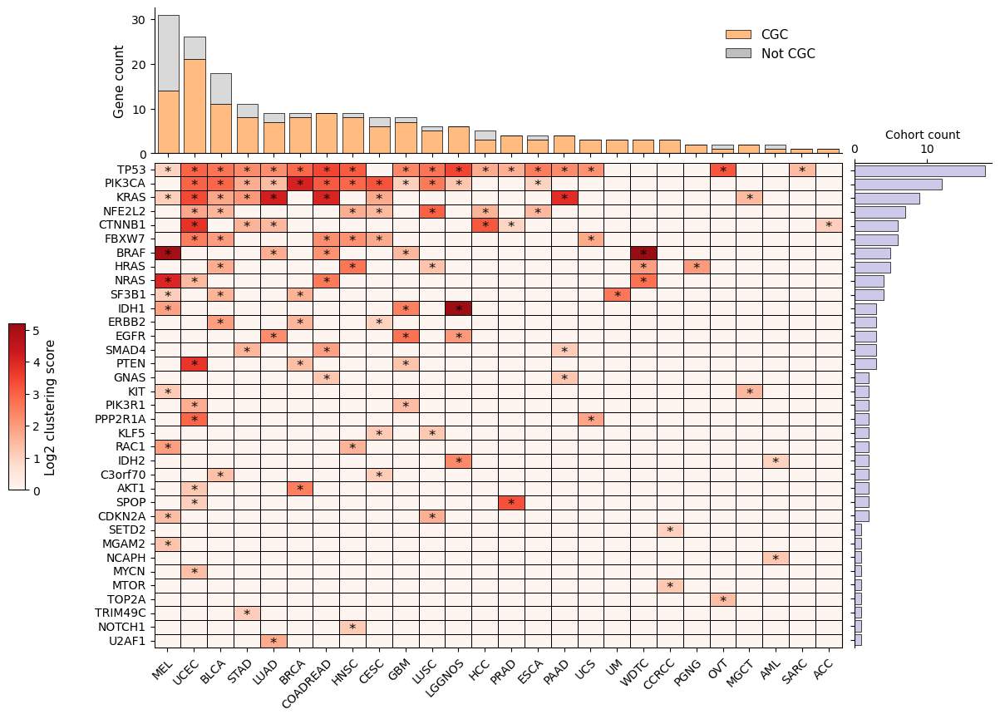

In [916]:
top_cohorts_n=None
top_genes_n=35

o3d_output = get_anomaly_df(genetable_subset, o3d_output_dir)
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict)

df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_subset, 
                                                                                 cohort_df, 
                                                                                 top_cohorts_n=top_cohorts_n, 
                                                                                 top_genes_n=top_genes_n, 
                                                                                 anomaly_dict=False)

df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, genetable)

plot_landscape(df=df_binary, 
               gene_colors=gene_colors, 
               gene_hits_count=gene_hits_count, 
               cohort_hits_count=cohort_hits_count,
               lut=lut, 
               df_anomaly=df_anomaly,
               figsize=(13,10),
               width_ratios=[1, 0.2],
               height_ratios=[0.3, 1],
               legend_box=(-0.2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.03,
               filename="landscape_heatmap_tcga.png")

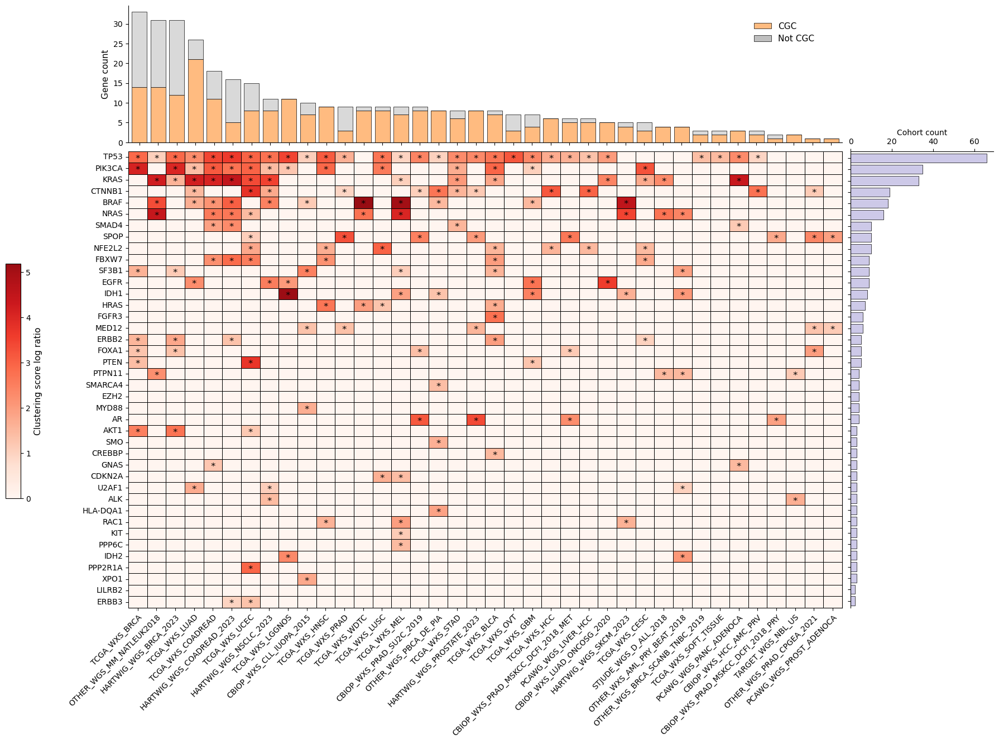

In [335]:
top_cohorts_n=40
top_genes_n=40 

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict)

df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=False)

gene_colors, lut = get_gene_annotation(df_binary, genetable)

plot_landscape(df=df_binary, gene_colors=gene_colors, lut=lut, df_anomaly=df_anomaly,
               gene_hits_count=gene_hits_count, cohort_hits_count=cohort_hits_count,
               figsize=(20,14),
               width_ratios=[1, 0.2],
               height_ratios=[0.3, 1],
               legend_box=(-0.2, 1.3),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.02, 
               hspace=0.03,
               cbar_loc=[0.015, 0.25, 0.0133, .3],
               filename="landscape_heatmap_all_cohorts.png")

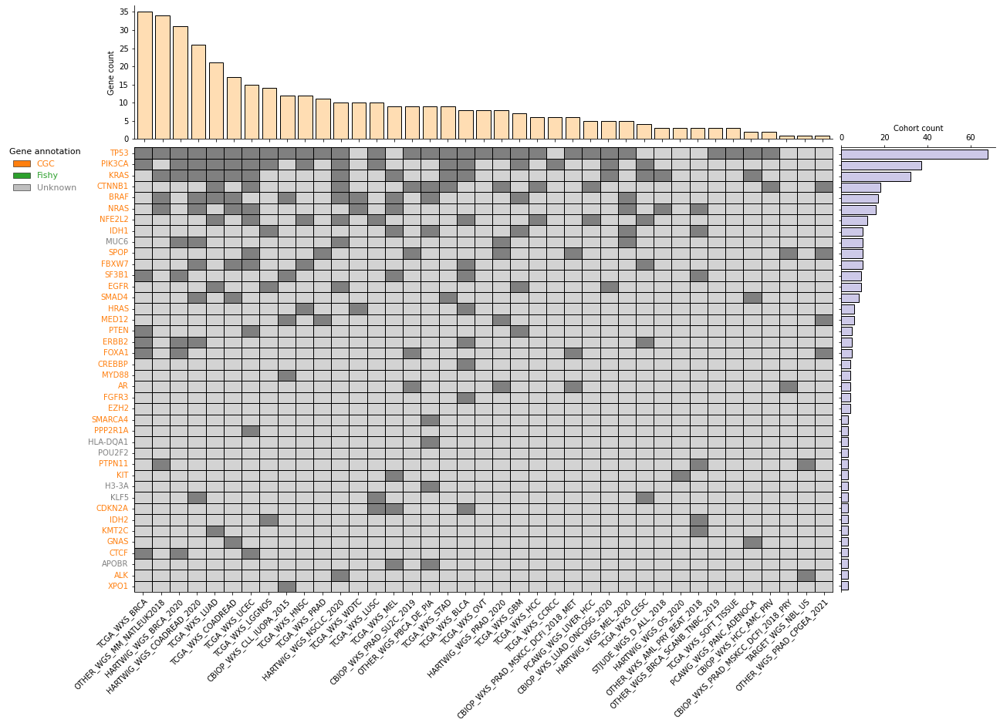

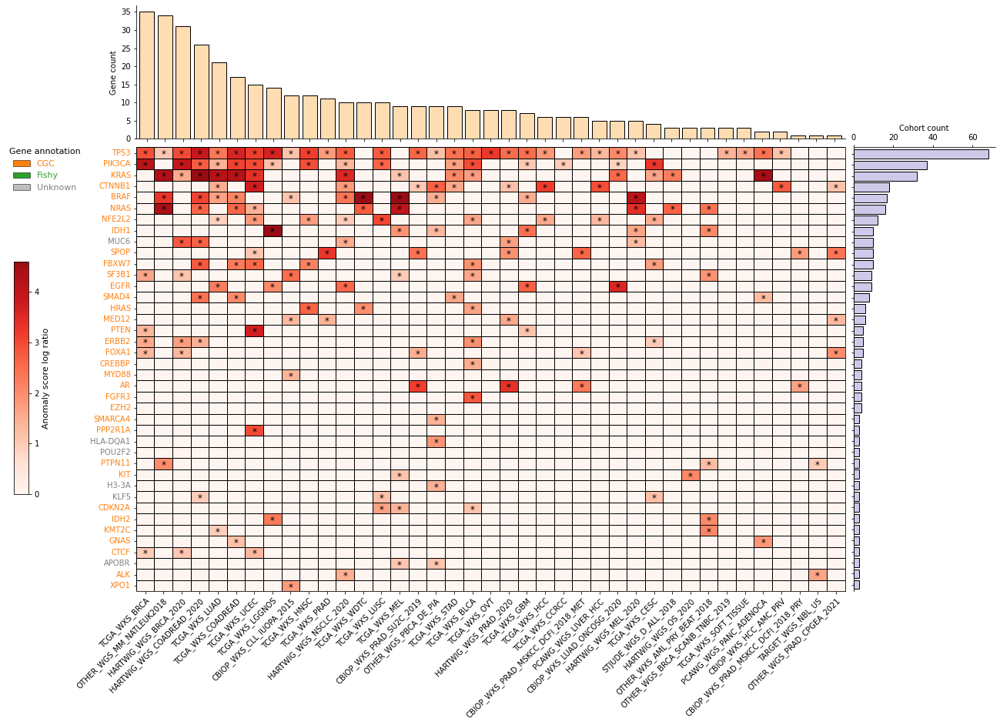

In [13]:
top_cohorts_n=40
top_genes_n=40

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict)

df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=False)

gene_colors, lut = get_gene_annotation(df_binary, genetable)

plot_landscape(df=df_binary, gene_colors=gene_colors, lut=lut, df_anomaly=None,
               gene_hits_count=gene_hits_count, cohort_hits_count=cohort_hits_count,
               figsize=(20,14),
               width_ratios=[1, 0.22],
               height_ratios=[0.3, 1],
               legend_box=(-4.9, 1.0156),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.02, 
               hspace=0.03)

plot_landscape(df=df_binary, gene_colors=gene_colors, lut=lut, df_anomaly=df_anomaly,
               gene_hits_count=gene_hits_count, cohort_hits_count=cohort_hits_count,
               figsize=(20,14),
               width_ratios=[1, 0.2],
               height_ratios=[0.3, 1],
               legend_box=(-5.4, 1.0156),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.02, 
               hspace=0.03,
               cbar_loc=[0.015, 0.25, 0.0133, .3],
               filename="landscape_heatmap_all_cohorts.png")

In [18]:
df_binary.loc[df_binary["OTHER_WGS_PBCA_DE_PIA"] == 1, "OTHER_WGS_PBCA_DE_PIA"]

Gene
TP53        1
CTNNB1      1
BRAF        1
IDH1        1
SMARCA4     1
HLA-DQA1    1
H3-3A       1
APOBR       1
Name: OTHER_WGS_PBCA_DE_PIA, dtype: int64

In [25]:
genetable[(genetable["Gene"] == "IGLL5") & (genetable["o3d_qval"] < 0.01)]

,Gene,Uniprot_ID,o3d_status,CGC,Fish,o3d_rank,o3d_pval,o3d_qval,cbase_rank,cbase_pval,...,clustl_pval,clustl_qval,fml_rank,fml_pval,fml_qval,smreg_rank,smreg_pval,smreg_qval,Cancer,Cohort
2428964,IGLL5,B9A064,Processed,0,0,2.0,0.0,0.0,17734.0,1.000000,...,0.077143,0.223067,7975.0,1.00000,1.0,NaN,NaN,NaN,DLBCLNOS,OTHER_WGS_DLBCL_NATCOM_2018
2642228,IGLL5,B9A064,Processed,0,0,4.0,0.0,0.0,11225.0,0.626789,...,0.556394,0.592594,15605.0,0.99999,1.0,NaN,NaN,NaN,PCM,OTHER_WGS_MM_NATLEUK2018


# Delete everything down to here (After restarting kernel and rerunning everything)

## Non annotated genes

In [499]:
intogen_df = pd.read_csv("/workspace/projects/clustering_3d/o3d_analysys/datasets/output/cancer_202404/intogen_output/drivers.tsv", sep="\t")
intogen_genes = intogen_df.SYMBOL.unique()

In [500]:
def get_intogen_annotation(df, intogen_genes):
    
    gene_annotation = ["Detected" if gene in intogen_genes else "Not detected" for gene in df.index]
    gene_annotation = pd.Series(gene_annotation, name="Annotation")
    lut = {"Detected": '#4d4dff', 
           "Not detected": '#b30000'}
    gene_colors = gene_annotation.map(lut)
    
    return gene_colors, lut


def get_intogen_genes_by_cohort(df_binary, intogen_df):

    df = pd.DataFrame(0, index=df_binary.index, columns=df_binary.columns)
    for gene in df.index:
        for cohort in df.columns:
            if len(intogen_df[(intogen_df["SYMBOL"] == gene) & (intogen_df["COHORT"] == cohort)]) > 0:
                df.loc[gene, cohort] = 1
                
    return df

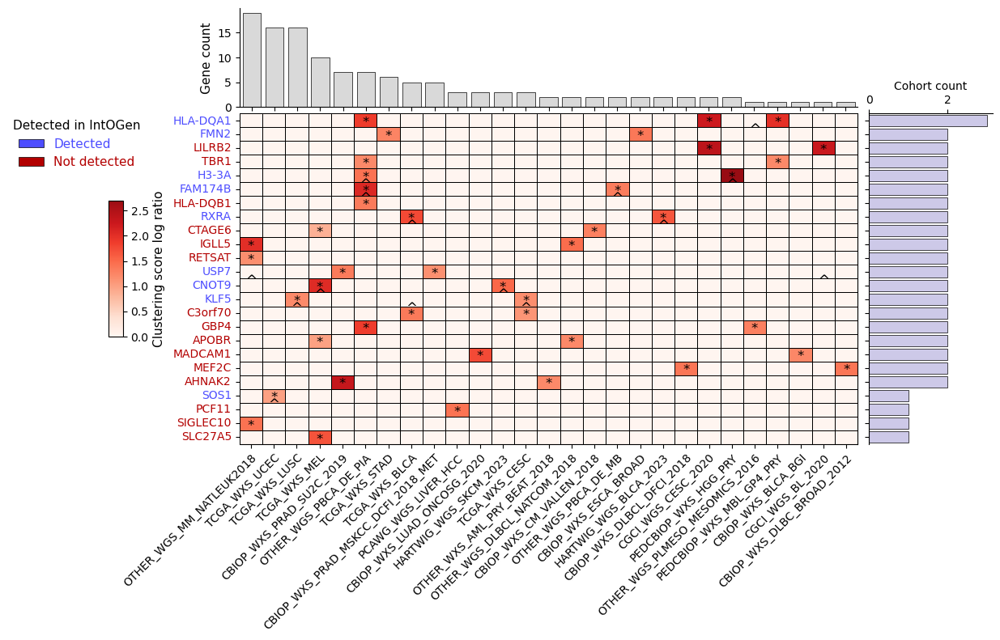

In [525]:
genetable_not_annot = genetable[(genetable["CGC"] == 0) & (genetable["Fish"] == 0)].reset_index(drop=True)
top_cohorts_n=150
top_genes_n=24

o3d_output = get_anomaly_df(genetable_not_annot, o3d_output_dir)
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

df_anomaly, _, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_not_annot, 
                                                      cohort_df, 
                                                      top_cohorts_n=top_cohorts_n, 
                                                      top_genes_n=top_genes_n, 
                                                      anomaly_dict=anomaly_dict)

df_binary, _, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(genetable_not_annot, 
                                                      cohort_df, 
                                                      top_cohorts_n=top_cohorts_n, 
                                                      top_genes_n=top_genes_n, 
                                                      anomaly_dict=False)

gene_colors, lut = get_intogen_annotation(df_binary, intogen_genes)
intogen_gene_by_cohort = get_intogen_genes_by_cohort(df_binary, intogen_df)

plot_landscape(df=df_binary, gene_colors=gene_colors, lut=lut, df_anomaly=df_anomaly,
               gene_hits_count=gene_hits_count, cohort_hits_count=cohort_hits_count,
               figsize=(12,7),
               width_ratios=[1, 0.2],
               height_ratios=[0.3, 1],
               legend_box=(-5.8, 1.0156),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.03,
               cbar_loc=[-0.01, 0.3, 0.015, .24],
               intogen_label=True,
               intogen_label_table=intogen_gene_by_cohort,
               color_gene=True)

## Clustering score density plots

### TCGA

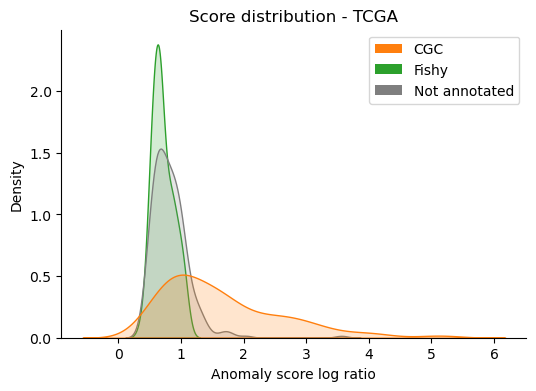

In [562]:
gene_colors, lut = get_gene_annotation(df_binary, genetable_subset)

# Get df with scores
o3d_output = get_anomaly_df(genetable_subset, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["Annotation"] = o3d_output.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)

## Plot 
plt.figure(figsize=(6, 4))
palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], 'Not annotated': lut["Not annotated"]}
sns.kdeplot(data=o3d_output, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Add labels and a legend
plt.xlabel('Anomaly score log ratio')
plt.ylabel('Density')
plt.title("Score distribution - TCGA", fontsize=12)

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),
           mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated")]
plt.legend(handles=handles)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution_tcga.png", dpi=300, bbox_inches='tight')
plt.show()

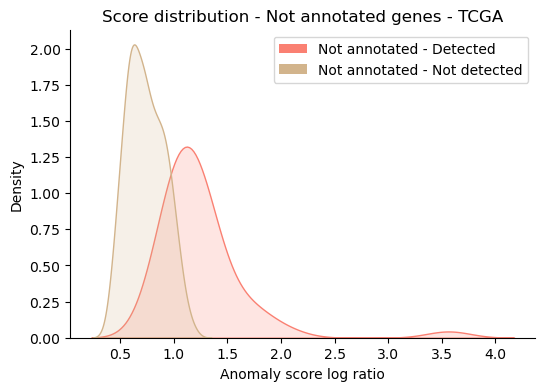

In [563]:
# Get df with scores
o3d_output = get_anomaly_df(genetable_subset, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[(o3d_output["CGC"] == 0) & (o3d_output["Fish"] == 0)]
o3d_output["Annotation"] = o3d_output["C_gene"]
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)

## Plot 
plt.figure(figsize=(6, 4))
palette = {1: "salmon", 0: "tan"}
sns.kdeplot(data=o3d_output, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Add labels and a legend
plt.xlabel('Anomaly score log ratio')
plt.ylabel('Density')
plt.title("Score distribution - Not annotated genes - TCGA", fontsize=12)

handles = [mpatches.Patch(facecolor="salmon", label="Not annotated - Detected"),
           mpatches.Patch(facecolor="tan", label="Not annotated - Not detected")]
plt.legend(handles=handles)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution_Not annotated_tcga.png", dpi=300, bbox_inches='tight')
plt.show()

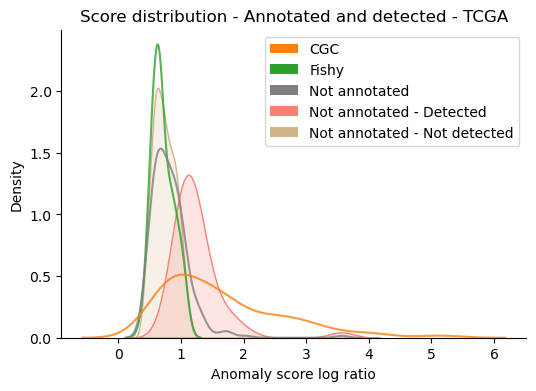

In [564]:
# Get df with scores with annotations
o3d_output = get_anomaly_df(genetable_subset, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output2 = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output2["Annotation"] = o3d_output2.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)

# Get df with scores of not annotated genes
o3d_output = get_anomaly_df(genetable_subset, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[(o3d_output["CGC"] == 0) & (o3d_output["Fish"] == 0)]
o3d_output["Annotation"] = o3d_output["C_gene"]
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["Annotation"] = o3d_output["Annotation"].map({1 : "Not annotated - Detected", 0 : "Not annotated - Not detected"})

# Concat
o3d_output = pd.concat((o3d_output, o3d_output2)).reset_index(drop=True)


## Plot 
plt.figure(figsize=(6, 4))
palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], 'Not annotated': lut["Not annotated"], "Not annotated - Detected" : "salmon", "Not annotated - Not detected" : "tan"}
annotation_ix = (o3d_output["Annotation"] == "CGC") | (o3d_output["Annotation"] == "Fishy") | (o3d_output["Annotation"] == "Not annotated")
sns.kdeplot(data=o3d_output[~annotation_ix], x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2)
sns.kdeplot(data=o3d_output[annotation_ix], x='Clustering_score', hue='Annotation', fill=False, common_norm=False, palette=palette, alpha=0.8)

# Add labels and a legend
plt.xlabel('Anomaly score log ratio')
plt.ylabel('Density')
plt.title("Score distribution - Annotated and detected - TCGA", fontsize=12)

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),
           mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated"),
           mpatches.Patch(facecolor="salmon", label="Not annotated - Detected"),
           mpatches.Patch(facecolor="tan", label="Not annotated - Not detected")]
plt.legend(handles=handles)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution_annotated_detected_tcga.png", dpi=300, bbox_inches='tight')
plt.show()

### All cohorts

#### Show tracks for example genes

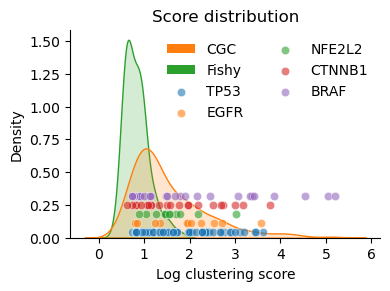

In [375]:
## Score distribution - CGC & Fishy - All cohorts

gene_colors, lut = get_gene_annotation(df_binary, genetable)

# Get df with scores
o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["Annotation"] = o3d_output.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)
o3d_output = o3d_output[o3d_output["Annotation"] != "Not annotated"]

# Plot
plt.figure(figsize=(4, 2.7))
palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], 'Not annotated': lut["Not annotated"]}
sns.kdeplot(data=o3d_output, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2)
sns.scatterplot(data=o3d_output[o3d_output["Gene"] == "TP53"], x='Clustering_score', y=0.04, alpha=0.6, label="TP53")
sns.scatterplot(data=o3d_output[o3d_output["Gene"] == "EGFR"], x='Clustering_score', y=0.11, alpha=0.6, label="EGFR")
sns.scatterplot(data=o3d_output[o3d_output["Gene"] == "NFE2L2"], x='Clustering_score', y=0.18, alpha=0.6, label="NFE2L2")
sns.scatterplot(data=o3d_output[o3d_output["Gene"] == "CTNNB1"], x='Clustering_score', y=0.25, alpha=0.6, label="CTNNB1")
sns.scatterplot(data=o3d_output[o3d_output["Gene"] == "BRAF"], x='Clustering_score', y=0.32, alpha=0.6, label="BRAF")

# Add labels and a legend

plt.xlabel('Log clustering score')
plt.ylabel('Density')
plt.title("Score distribution", fontsize=12)

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),]
           #mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated")]

handles_scatter, labels_scatter = plt.gca().get_legend_handles_labels()

# Combine both sets of handles and labels
combined_handles = handles + handles_scatter
combined_labels = [handle.get_label() for handle in handles] + labels_scatter

# Add combined legend
plt.legend(combined_handles, combined_labels, frameon=False, ncols=2)



plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution.png", dpi=300, bbox_inches='tight')
plt.show()

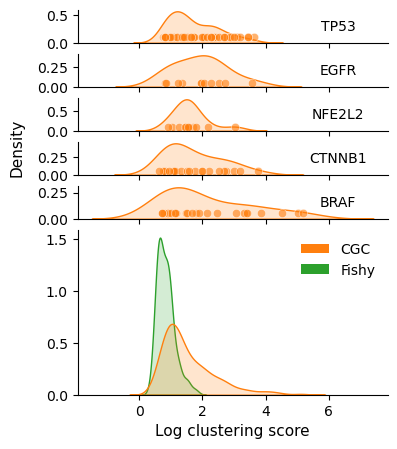

In [464]:
# Score distribution - CGC & Fishy - All cohorts
# ===============================================


# Get df with scores
# ------------------
o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["Annotation"] = o3d_output.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)
o3d_output = o3d_output[o3d_output["Annotation"] != "Not annotated"]


# Plot
# ----

gene_colors, lut = get_gene_annotation(df_binary, genetable)
palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], 'Not annotated': lut["Not annotated"]}
genes = ["TP53", "EGFR", "NFE2L2", "CTNNB1", "BRAF"]
h_ratios = [0.1, 0.1, 0.1, 0.1, 0.1, 0.5]


fig, ax = plt.subplots(6, 1, 
                       figsize=(4, 5), 
                       gridspec_kw={'height_ratios': h_ratios},
                       sharex=True)

sns.kdeplot(data=o3d_output, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2, ax=ax[len(genes)])

for i, gene in enumerate(genes):
    annotation = o3d_output[o3d_output["Gene"] == gene].Annotation.unique()[0]
    sns.kdeplot(data=o3d_output[o3d_output["Gene"] == gene], x='Clustering_score', fill=True, common_norm=False, color=palette[annotation], alpha=0.2, ax=ax[i])

    n = max(ax[i].get_yticks())
    sns.scatterplot(data=o3d_output[o3d_output["Gene"] == gene], x='Clustering_score', y=n*0.1, alpha=0.6, color=palette[annotation], ax=ax[i])
    ax[i].set_ylabel(gene, fontsize=10, rotation=0, va='center')
    ax[i].yaxis.set_label_coords(0.84, 0.5)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)
ax[i+1].spines['right'].set_visible(False)
ax[i+1].spines['top'].set_visible(False)

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),]
           #mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated")]
plt.legend(handles=handles, frameon=False, fontsize=10)

plt.xlabel('Log clustering score', fontsize=11)
ax[len(genes)].set_ylabel("Density", fontsize=11)
ax[len(genes)].yaxis.set_label_coords(-0.17, 1.5)
# fig.suptitle("Score distribution", fontsize=12)
# plt.subplots_adjust(top=0.92) 
    
plt.show()

/tmp/jobs/spellegrini/9964934/ipykernel_20268/305557472.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  o3d_output_noannot["Annotation"] = o3d_output_noannot["C_gene"]
/tmp/jobs/spellegrini/9964934/ipykernel_20268/305557472.py:43: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=o3d_output2[o3d_output2["Gene"] == gene], x='Clustering_score',


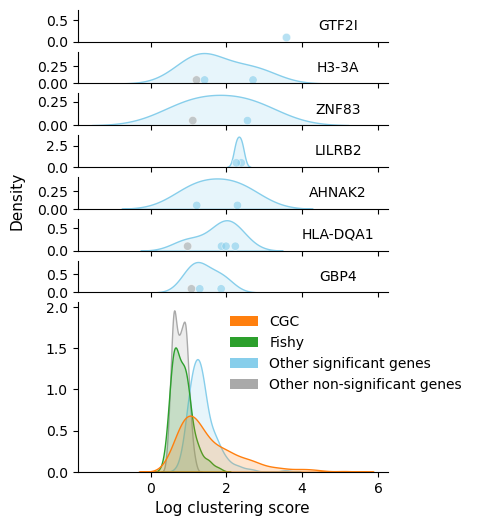

In [590]:
# Score distribution - Annotated and detected - All cohorts - Show only non CGC genes
# ===================================================================================


# Get df with scores with annotations
# -----------------------------------

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])

o3d_output_annot = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output_annot["Annotation"] = o3d_output_annot.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)
o3d_output_annot = o3d_output_annot[o3d_output_annot["Annotation"] != "Not annotated"]

# Get df with scores of not annotated genes
o3d_output_noannot = o3d_output[(o3d_output["CGC"] == 0) & (o3d_output["Fish"] == 0)]
o3d_output_noannot["Annotation"] = o3d_output_noannot["C_gene"]
o3d_output_noannot = o3d_output_noannot[o3d_output_noannot["qval"] < 1].reset_index(drop=True)
o3d_output_noannot["Annotation"] = o3d_output_noannot["Annotation"].map({1 : "Other significant genes", 0 : "Other non significant genes"})

o3d_output2 = pd.concat((o3d_output_annot, o3d_output_noannot)).reset_index(drop=True)


# Plot 
# ----
# cgc_genes = ["TP53", "EGFR", "NFE2L2", "CTNNB1", "BRAF"]
# non_cgc_genes = ["GTF2I", "H3-3A", "ZNF83", "LILRB2", "AHNAK2", "HLA-DQA1", "GBP4"]
genes = ["GTF2I", "H3-3A", "ZNF83", "LILRB2", "AHNAK2", "HLA-DQA1", "GBP4"]

palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], "Other significant genes" : "skyblue", "Other non significant genes" : "darkgray"}
h_ratios = [0.1 for gene in genes] + [0.53]

fig, ax = plt.subplots(len(h_ratios), 1, 
                       figsize=(4, 6), 
                       gridspec_kw={'height_ratios': h_ratios},
                       sharex=True)

sns.kdeplot(data=o3d_output2, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2, ax=ax[len(genes)])

for i, gene in enumerate(genes):
    annotation = o3d_output2[o3d_output2["Gene"] == gene].Annotation.unique()
    annotation = annotation[0] if len(annotation) == 1 else 'Other significant genes'
    sns.kdeplot(data=o3d_output2[o3d_output2["Gene"] == gene], x='Clustering_score', 
                fill=True, common_norm=False, color=palette[annotation], alpha=0.2, ax=ax[i])
    
    n = max(ax[i].get_yticks())
    sns.scatterplot(data=o3d_output2[o3d_output2["Gene"] == gene], x='Clustering_score', 
                    y=n*0.1, alpha=0.6, hue="Annotation", palette=palette, ax=ax[i], legend=False)
    
    ax[i].set_ylabel(gene, fontsize=10, rotation=0, va='center')
    ax[i].yaxis.set_label_coords(0.84, 0.5)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)

    y_ticks = np.linspace(0, n, 3)[:2]  
    ax[i].set_yticks(y_ticks)
    if gene == "GTF2I":
        ax[i].set_ylim([0, 0.75])

ax[i+1].spines['right'].set_visible(False)
ax[i+1].spines['top'].set_visible(False)

# Add labels and a legend
plt.xlabel('Log clustering score')
plt.ylabel('Density')

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),
           mpatches.Patch(facecolor="skyblue", label="Other significant genes"),
           mpatches.Patch(facecolor="darkgray", label="Other non-significant genes")]
plt.legend(handles=handles, bbox_to_anchor=[0.1,0,1.18,1], frameon=False, fontsize=10)


plt.xlabel('Log clustering score', fontsize=11)
ax[len(genes)].set_ylabel("Density", fontsize=11)
ax[len(genes)].yaxis.set_label_coords(-0.17, 1.6)
# fig.suptitle("Score distribution - Annotated and detected", fontsize=12)
# plt.subplots_adjust(top=0.92) 

#plt.savefig("score_distribution_annotated_detected.png", dpi=300, bbox_inches='tight')
plt.show()

/tmp/jobs/spellegrini/9964934/ipykernel_20268/3927084637.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  o3d_output_noannot["Annotation"] = o3d_output_noannot["C_gene"]
/tmp/jobs/spellegrini/9964934/ipykernel_20268/3927084637.py:43: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=o3d_output2[o3d_output2["Gene"] == gene], x='Clustering_score',


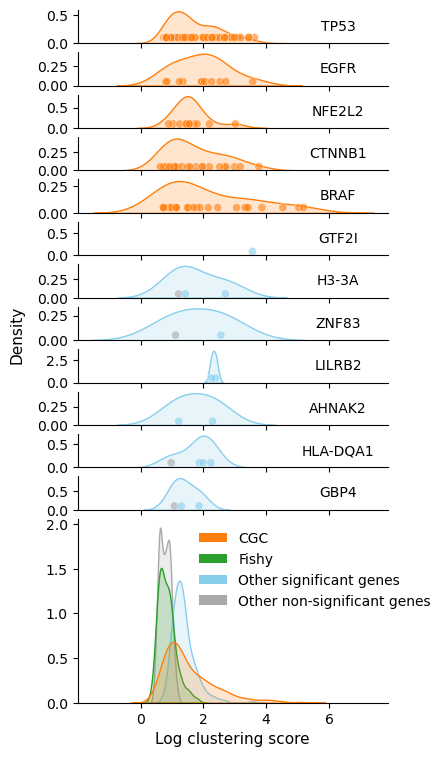

In [462]:
# Score distribution - Annotated and detected - All cohorts
# =========================================================


# Get df with scores with annotations
# -----------------------------------

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])

o3d_output_annot = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output_annot["Annotation"] = o3d_output_annot.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)
o3d_output_annot = o3d_output_annot[o3d_output_annot["Annotation"] != "Not annotated"]

# Get df with scores of not annotated genes
o3d_output_noannot = o3d_output[(o3d_output["CGC"] == 0) & (o3d_output["Fish"] == 0)]
o3d_output_noannot["Annotation"] = o3d_output_noannot["C_gene"]
o3d_output_noannot = o3d_output_noannot[o3d_output_noannot["qval"] < 1].reset_index(drop=True)
o3d_output_noannot["Annotation"] = o3d_output_noannot["Annotation"].map({1 : "Other significant genes", 0 : "Other non significant genes"})

o3d_output2 = pd.concat((o3d_output_annot, o3d_output_noannot)).reset_index(drop=True)


# Plot 
# ----
cgc_genes = ["TP53", "EGFR", "NFE2L2", "CTNNB1", "BRAF"]
non_cgc_genes = ["GTF2I", "H3-3A", "ZNF83", "LILRB2", "AHNAK2", "HLA-DQA1", "GBP4"]
genes = cgc_genes + non_cgc_genes

palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], "Other significant genes" : "skyblue", "Other non significant genes" : "darkgray"}
h_ratios = [0.1 for gene in genes] + [0.55]

fig, ax = plt.subplots(len(h_ratios), 1, 
                       figsize=(4, 9), 
                       gridspec_kw={'height_ratios': h_ratios},
                       sharex=True)

sns.kdeplot(data=o3d_output2, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2, ax=ax[len(genes)])

for i, gene in enumerate(genes):
    annotation = o3d_output2[o3d_output2["Gene"] == gene].Annotation.unique()
    annotation = annotation[0] if len(annotation) == 1 else 'Other significant genes'
    sns.kdeplot(data=o3d_output2[o3d_output2["Gene"] == gene], x='Clustering_score', 
                fill=True, common_norm=False, color=palette[annotation], alpha=0.2, ax=ax[i])
    
    n = max(ax[i].get_yticks())
    sns.scatterplot(data=o3d_output2[o3d_output2["Gene"] == gene], x='Clustering_score', 
                    y=n*0.1, alpha=0.6, hue="Annotation", palette=palette, ax=ax[i], legend=False)
    
    ax[i].set_ylabel(gene, fontsize=10, rotation=0, va='center')
    ax[i].yaxis.set_label_coords(0.84, 0.5)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)

    y_ticks = np.linspace(0, n, 3)[:2]  
    ax[i].set_yticks(y_ticks)
    if gene == "GTF2I":
        ax[i].set_ylim([0, 0.75])

ax[i+1].spines['right'].set_visible(False)
ax[i+1].spines['top'].set_visible(False)

# Add labels and a legend
plt.xlabel('Log clustering score')
plt.ylabel('Density')

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),
           mpatches.Patch(facecolor="skyblue", label="Other significant genes"),
           mpatches.Patch(facecolor="darkgray", label="Other non-significant genes")]
plt.legend(handles=handles, bbox_to_anchor=[0,0,1.18,1], frameon=False, fontsize=10)


plt.xlabel('Log clustering score', fontsize=11)
ax[len(genes)].set_ylabel("Density", fontsize=11)
ax[len(genes)].yaxis.set_label_coords(-0.17, 2)
# fig.suptitle("Score distribution - Annotated and detected", fontsize=12)
# plt.subplots_adjust(top=0.92) 

#plt.savefig("score_distribution_annotated_detected.png", dpi=300, bbox_inches='tight')
plt.show()

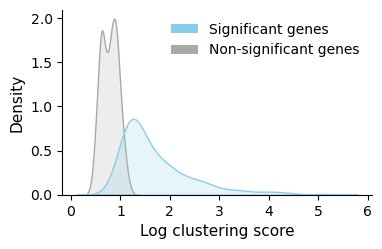

In [459]:
## Score distribution - Significant & non-significant - All cohorts

gene_colors, lut = get_gene_annotation(df_binary, genetable)

# Get df with scores
o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["C_gene"] = o3d_output["C_gene"].map({1 : "Significant", 0 : "Non-significant"})

# Plot
plt.figure(figsize=(4, 2.4))
palette = {'Significant': "skyblue", 'Non-significant': "darkgray"}
sns.kdeplot(data=o3d_output, x='Clustering_score', hue='C_gene', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Add labels and a legend
plt.xlabel('Log clustering score', fontsize=11)
plt.ylabel('Density', fontsize=11)
#plt.title("Score distribution - Significant & non - All cohorts", fontsize=12)

handles = [mpatches.Patch(facecolor="skyblue", label="Significant genes"),
           mpatches.Patch(facecolor="darkgray", label="Non-significant genes"),]
           #mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated")]
plt.legend(handles=handles, frameon=False, fontsize=10)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution_significant_nonsignificant.png", dpi=300, bbox_inches='tight')
plt.show()

#### Just the basic plot

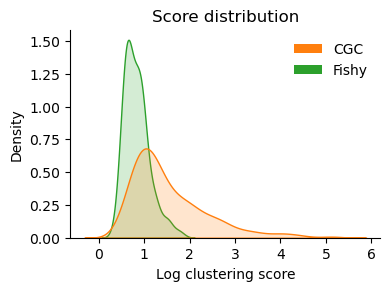

In [488]:
## Score distribution - CGC & Fishy - All cohorts

gene_colors, lut = get_gene_annotation(df_binary, genetable)

# Get df with scores
o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["Annotation"] = o3d_output.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)
o3d_output = o3d_output[o3d_output["Annotation"] != "Not annotated"]

# Plot
plt.figure(figsize=(4, 2.7))
palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], 'Not annotated': lut["Not annotated"]}
sns.kdeplot(data=o3d_output, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Add labels and a legend
plt.xlabel('Log clustering score')
plt.ylabel('Density')
plt.title("Score distribution", fontsize=12)

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),]
           #mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated")]
plt.legend(handles=handles, frameon=False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution.png", dpi=300, bbox_inches='tight')
plt.show()

/tmp/jobs/spellegrini/9964934/ipykernel_20268/1813599401.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  o3d_output_noannot["Annotation"] = o3d_output_noannot["C_gene"]


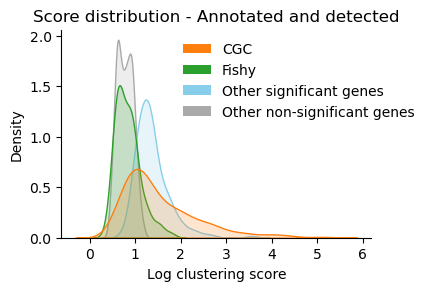

In [489]:
## Score distribution - Annotated and detected - All cohorts

# Get df with scores with annotations
o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])

o3d_output_annot = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output_annot["Annotation"] = o3d_output_annot.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)
o3d_output_annot = o3d_output_annot[o3d_output_annot["Annotation"] != "Not annotated"]

# Get df with scores of not annotated genes
o3d_output_noannot = o3d_output[(o3d_output["CGC"] == 0) & (o3d_output["Fish"] == 0)]
o3d_output_noannot["Annotation"] = o3d_output_noannot["C_gene"]
o3d_output_noannot = o3d_output_noannot[o3d_output_noannot["qval"] < 1].reset_index(drop=True)
o3d_output_noannot["Annotation"] = o3d_output_noannot["Annotation"].map({1 : "Other significant genes", 0 : "Other non significant genes"})

o3d_output2 = pd.concat((o3d_output_annot, o3d_output_noannot)).reset_index(drop=True)


## Plot 
plt.figure(figsize=(4, 2.7))
palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], "Other significant genes" : "skyblue", "Other non significant genes" : "darkgray"}
# annotation_ix = (o3d_output["Annotation"] == "CGC") | (o3d_output["Annotation"] == "Fishy") | (o3d_output["Annotation"] == "Not annotated")
sns.kdeplot(data=o3d_output2, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2)
# sns.kdeplot(data=o3d_output[annotation_ix], x='Clustering_score', hue='Annotation', fill=False, common_norm=False, palette=palette, alpha=0.8)

# Add labels and a legend
plt.xlabel('Log clustering score')
plt.ylabel('Density')
plt.title("Score distribution - Annotated and detected", fontsize=12)

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),
           mpatches.Patch(facecolor="skyblue", label="Other significant genes"),
           mpatches.Patch(facecolor="darkgray", label="Other non-significant genes")]
plt.legend(handles=handles, bbox_to_anchor=[0,0,1.18,1], frameon=False)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution_annotated_detected.png", dpi=300, bbox_inches='tight')
plt.show()

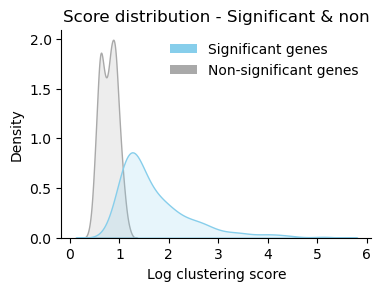

In [490]:
## Score distribution - Significant & non-significant - All cohorts

gene_colors, lut = get_gene_annotation(df_binary, genetable)

# Get df with scores
o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["C_gene"] = o3d_output["C_gene"].map({1 : "Significant", 0 : "Non-significant"})

# Plot
plt.figure(figsize=(4, 2.7))
palette = {'Significant': "skyblue", 'Non-significant': "darkgray"}
sns.kdeplot(data=o3d_output, x='Clustering_score', hue='C_gene', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Add labels and a legend
plt.xlabel('Log clustering score')
plt.ylabel('Density')
plt.title("Score distribution - Significant & non", fontsize=12)

handles = [mpatches.Patch(facecolor="skyblue", label="Significant genes"),
           mpatches.Patch(facecolor="darkgray", label="Non-significant genes"),]
           #mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated")]
plt.legend(handles=handles, frameon=False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution_significant_nonsignificant.png", dpi=300, bbox_inches='tight')
plt.show()

#### Max score distribution

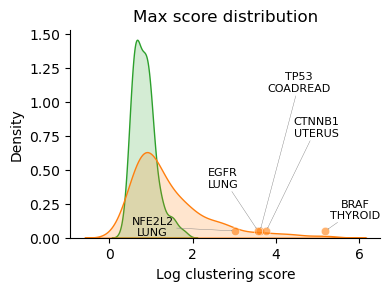

In [594]:
# Max score distribution - CGC & Fishy - All cohorts
# ==================================================


# Get df with scores
# ------------------

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["Annotation"] = o3d_output.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)
o3d_output = o3d_output[o3d_output["Annotation"] != "Not annotated"]

# Get max
idx = o3d_output.groupby("Gene")["Clustering_score"].idxmax()
o3d_output = o3d_output.loc[idx].reset_index(drop=True)
o3d_output = o3d_output.merge(cohort_df[["COHORT", "GENERAL_CANCER_TYPE"]].rename(columns={"COHORT" : "Cohort"}), 
                              on="Cohort", how="left")

# Plot
# ----

expand_text_xy=(3, 2)
genes = ["TP53", "EGFR", "NFE2L2", "CTNNB1", "BRAF"]
#non_cgc_genes = ["GTF2I", "H3-3A", "ZNF83", "LILRB2", "AHNAK2", "HLA-DQA1", "GBP4"]


fig, ax = plt.subplots(figsize=(4, 2.7))    
palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], 'Not annotated': lut["Not annotated"]}
sns.kdeplot(data=o3d_output, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2, legend=False)

# Text annotations
annotations = []
for i, gene in enumerate(genes):
    o3d_output_gene = o3d_output[o3d_output["Gene"] == gene]
    ttype = o3d_output_gene.GENERAL_CANCER_TYPE.unique()[0]
    annotation = o3d_output_gene.Annotation.unique()[0]
    sns.scatterplot(data=o3d_output_gene, x='Clustering_score',
                    y=0.05, alpha=0.6, color=palette[annotation])
    annotations.append(ax.text(o3d_output_gene["Clustering_score"], 0.05, f"{gene}\n{ttype}", fontsize=8, color='black'))
adjust_text(annotations, expand=expand_text_xy, 
            arrowprops=dict(arrowstyle='->', color='gray'), lw=0.3, ax=ax)

# Add labels and a legend
plt.xlabel('Log clustering score')
plt.ylabel('Density')
plt.title("Max score distribution", fontsize=12)

# handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
#            mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),]
#            #mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated")]
# plt.legend(handles=handles, frameon=False, loc="upper center")

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution.png", dpi=300, bbox_inches='tight')
plt.show()

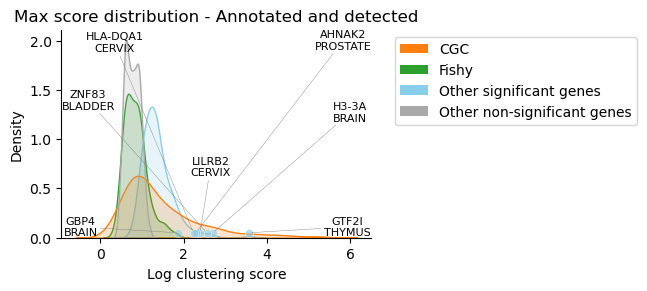

In [584]:
# Max score distribution - Annotated and detected - All cohorts
# =============================================================

# Get df with scores
# ------------------

o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])

o3d_output_annot = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output_annot["Annotation"] = o3d_output_annot.apply(lambda x: "CGC" if x["CGC"] == 1 else "Fishy" if x["Fish"] == 1 else "Not annotated", axis=1)
o3d_output_annot = o3d_output_annot[o3d_output_annot["Annotation"] != "Not annotated"]

# Get df with scores of not annotated genes
o3d_output_noannot = o3d_output[(o3d_output["CGC"] == 0) & (o3d_output["Fish"] == 0)]
o3d_output_noannot["Annotation"] = o3d_output_noannot["C_gene"]
o3d_output_noannot = o3d_output_noannot[o3d_output_noannot["qval"] < 1].reset_index(drop=True)
o3d_output_noannot["Annotation"] = o3d_output_noannot["Annotation"].map({1 : "Other significant genes", 0 : "Other non significant genes"})

o3d_output2 = pd.concat((o3d_output_annot, o3d_output_noannot)).reset_index(drop=True)

# Get max
idx = o3d_output2.groupby("Gene")["Clustering_score"].idxmax()
o3d_output2 = o3d_output2.loc[idx].reset_index(drop=True)
o3d_output2 = o3d_output2.merge(cohort_df[["COHORT", "GENERAL_CANCER_TYPE"]].rename(columns={"COHORT" : "Cohort"}), 
                                on="Cohort", how="left")

# Plot 
# ----

expand_text_xy=(3.8, 3.2)
#cgc_genes = ["TP53", "EGFR", "NFE2L2", "CTNNB1", "BRAF"]
non_cgc_genes = ["GTF2I", "H3-3A", "ZNF83", "LILRB2", "AHNAK2", "HLA-DQA1", "GBP4"]
genes = cgc_genes + non_cgc_genes
genes = ["GTF2I", "H3-3A", "ZNF83", "LILRB2", "AHNAK2", "HLA-DQA1", "GBP4"]

fig, ax = plt.subplots(figsize=(4, 2.7))     
palette = {'CGC': lut["CGC"], 'Fishy': lut["Fishy"], "Other significant genes" : "skyblue", "Other non significant genes" : "darkgray"}
sns.kdeplot(data=o3d_output2, x='Clustering_score', hue='Annotation', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Text annotations
annotations = []
for i, gene in enumerate(genes):
    o3d_output_gene = o3d_output2[o3d_output2["Gene"] == gene]
    ttype = o3d_output_gene.GENERAL_CANCER_TYPE.unique()[0]
    annotation = o3d_output_gene.Annotation.unique()
    annotation = annotation[0] if len(annotation) == 1 else 'Other significant genes'
    sns.scatterplot(data=o3d_output_gene, x='Clustering_score',
                    y=0.05, alpha=0.6, color=palette[annotation])
    annotations.append(ax.text(o3d_output_gene["Clustering_score"], 0.05, f"{gene}\n{ttype}", fontsize=8, color='black'))
adjust_text(annotations, expand=expand_text_xy, 
            arrowprops=dict(arrowstyle='->', color='gray'), lw=0.3, ax=ax)

# Add labels and a legend
plt.xlabel('Log clustering score')
plt.ylabel('Density')
plt.title("Max score distribution - Annotated and detected", fontsize=12)

handles = [mpatches.Patch(facecolor=lut["CGC"], label="CGC"),
           mpatches.Patch(facecolor=lut["Fishy"], label="Fishy"),
           mpatches.Patch(facecolor="skyblue", label="Other significant genes"),
           mpatches.Patch(facecolor="darkgray", label="Other non-significant genes")]
plt.legend(handles=handles, bbox_to_anchor=[0.7,0,1.18,1], frameon=True)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution_annotated_detected.png", dpi=300, bbox_inches='tight')
plt.show()

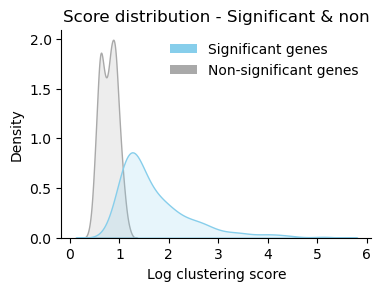

In [494]:
# Max score distribution - Significant & non-significant - All cohorts
# ================================================================

gene_colors, lut = get_gene_annotation(df_binary, genetable)

# Get df with scores
o3d_output = get_anomaly_df(genetable, o3d_output_dir)
o3d_output["Clustering_score"] = np.log(o3d_output["Clustering_score"])
o3d_output = o3d_output[o3d_output["qval"] < 1].reset_index(drop=True)
o3d_output["C_gene"] = o3d_output["C_gene"].map({1 : "Significant", 0 : "Non-significant"})

# Get max
idx = o3d_output.groupby("Gene")["Clustering_score"].idxmax()
o3d_outputo3d_output2 = o3d_output.loc[idx].reset_index(drop=True)
o3d_output = o3d_output.merge(cohort_df[["COHORT", "GENERAL_CANCER_TYPE"]].rename(columns={"COHORT" : "Cohort"}), 
                              on="Cohort", how="left")

# Plot
plt.figure(figsize=(4, 2.7))
palette = {'Significant': "skyblue", 'Non-significant': "darkgray"}
sns.kdeplot(data=o3d_output, x='Clustering_score', hue='C_gene', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Add labels and a legend
plt.xlabel('Log clustering score')
plt.ylabel('Density')
plt.title("Score distribution - Significant & non", fontsize=12)

handles = [mpatches.Patch(facecolor="skyblue", label="Significant genes"),
           mpatches.Patch(facecolor="darkgray", label="Non-significant genes"),]
           #mpatches.Patch(facecolor=lut["Not annotated"], label="Not annotated")]
plt.legend(handles=handles, frameon=False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("score_distribution_significant_nonsignificant.png", dpi=300, bbox_inches='tight')
plt.show()

## Highlight some interesting cases

In [369]:
def int_lst_from_str(str_lst):
    
    numbers = re.findall(r'\d+', str_lst)
    
    return np.array([int(num) for num in numbers])


def get_pos_clust_freq(gene_df, pos):

    tot_count = len(gene_df)
    count = sum([pos in gene_df.iloc[i].C_pos for i in range(tot_count)])
    
    return count / tot_count


def get_gene_clust_conservation(anomaly_df, gene):
    
    # Get df with cluster pos as list
    df = anomaly_df.copy()
    df = df[df["C_gene"] == 1]
    df = df[df["Gene"] == gene]
    df["C_pos"] = df.apply(lambda x: int_lst_from_str(x["C_pos"]), axis=1)
    
    # Get conservation of each cluster pos
    cluster_pos = np.sort(np.unique(np.concatenate(df["C_pos"].values)))
    final_df = pd.DataFrame({"Pos" : cluster_pos})
    print("Cohorts:", len(df))
    final_df["clusters_conservation"] = final_df.apply(lambda x: get_pos_clust_freq(df, x["Pos"]), axis=1)
    
    return final_df


def write_defattr_file(file_path, gene, uni_id, df, attr_name="clusters_conservation"):

    header = f"""#
#  Cluster conservation for {uni_id} ({gene})
#
#  Use this file to assign the attribute in Chimera with the 
#  Define Attribute tool or the command defattr.
#"""

    with open(file_path, "w") as file:
        # Write the data to the file
        file.write(header)

    with open(file_path, "a") as file:
        file.write(f"\nattribute: {attr_name}")
        file.write("\nrecipient: residues")

        for res, attr in zip(df["Pos"], df[attr_name]):
            file.write('\n\t:' + str(res) + '\t' + str(attr))

In [370]:
gene = "IDH1"
df = get_anomaly_df(genetable, o3d_output_dir)

uni_id = df[df["Gene"] == gene].Uniprot_ID.unique()[0]
print("\n>", gene, uni_id)
gene_conservation = get_gene_clust_conservation(df, gene)
gene_conservation["Pos"].values


> IDH1 O75874
Cohorts: 10


array([132])

In [1503]:
gene_conservation

,Pos,Conservation
0,132,1.0


In [371]:
for gene in ["PIK3CA", "MUC6", "BRAF", "KRAS", "TP53", "CTNNB1", "EGFR", "NFE2L2", "MUC6"]:

    df = get_anomaly_df(genetable, o3d_output_dir)

    uni_id = df[df["Gene"] == gene].Uniprot_ID.unique()[0]
    print("\n>", gene, uni_id)
    gene_conservation = get_gene_clust_conservation(df, gene)
    display(gene_conservation)

    file_path = f"{gene}_clusters_conservation.defattr"
    write_defattr_file(file_path, gene, uni_id, gene_conservation)


> PIK3CA P42336
Cohorts: 37


,Pos,clusters_conservation
0,9,0.027027
1,38,0.108108
2,39,0.054054
3,69,0.027027
4,81,0.054054
5,83,0.027027
6,88,0.108108
7,90,0.027027
8,93,0.108108
9,104,0.054054



> MUC6 Q6W4X9
Cohorts: 10


,Pos,clusters_conservation
0,213,1.0



> BRAF P15056
Cohorts: 17


,Pos,clusters_conservation
0,464,0.058824
1,466,0.117647
2,469,0.117647
3,501,0.117647
4,574,0.117647
5,581,0.176471
6,594,0.470588
7,596,0.176471
8,597,0.411765
9,600,1.000000



> KRAS P01116
Cohorts: 32


,Pos,clusters_conservation
0,12,1.00000
1,13,0.84375
2,14,0.09375
3,16,0.03125
4,18,0.06250
5,19,0.09375
6,22,0.03125
7,34,0.09375
8,58,0.03125
9,59,0.18750



> TP53 P04637
Cohorts: 68


,Pos,clusters_conservation
0,95,0.014706
1,105,0.132353
2,106,0.044118
3,107,0.058824
4,109,0.044118
...,...,...
131,287,0.044118
132,289,0.014706
133,331,0.014706
134,334,0.029412



> CTNNB1 P35222
Cohorts: 18


,Pos,clusters_conservation
0,29,0.055556
1,31,0.055556
2,32,0.888889
3,33,0.888889
4,34,0.944444
5,35,0.222222
6,36,0.222222
7,37,0.777778
8,41,0.333333
9,45,0.277778



> EGFR P00533
Cohorts: 9


,Pos,clusters_conservation
0,62,0.222222
1,63,0.111111
2,84,0.222222
3,108,0.444444
4,252,0.222222
5,254,0.111111
6,256,0.222222
7,263,0.333333
8,270,0.111111
9,289,0.444444



> NFE2L2 Q16236
Cohorts: 12


,Pos,clusters_conservation
0,24,0.583333
1,26,0.250000
2,27,0.166667
3,28,0.166667
4,29,0.666667
5,30,0.250000
6,31,0.583333
7,32,0.083333
8,34,0.500000
9,77,0.416667



> MUC6 Q6W4X9
Cohorts: 10


,Pos,clusters_conservation
0,213,1.0


In [1475]:
!ls

BRAF_clusters_conservation.defattr    landscape.ipynb
CTNNB1_clusters_conservation.defattr  NFE2L2_clusters_conservation.defattr
EGFR_clusters_conservation.defattr    TP53_clusters_conservation.defattr
KRAS_clusters_conservation.defattr    tp53_clusters_conservation_tcga.defattr


In [1478]:
!cat TP53_clusters_conservation.defattr | head

#
#  Cluster conservation for P04637 (TP53)
#
#  Use this file to assign the attribute in Chimera with the 
#  Define Attribute tool or the command defattr.
#
attribute: clusters_conservation
recipient: residues
	:95	0.014705882352941176
	:105	0.1323529411764706


## Show clusters in one protein-tissue

In [13]:
gene = "CTNNB1"
df = get_anomaly_df(genetable, o3d_output_dir)

uni_id = df[df["Gene"] == gene].Uniprot_ID.unique()[0]
print("\n>", gene, uni_id)
gene_conservation = get_gene_clust_conservation(df, gene)
gene_conservation["Pos"].values


> CTNNB1 P35222
Cohorts: 18


array([ 29,  31,  32,  33,  34,  35,  36,  37,  41,  45, 333, 335])

In [22]:
df[(df["Cohort"] == "TCGA_WXS_STAD") & (df["Gene"] == "CTNNB1")]

,Cohort,Gene,Uniprot_ID,qval,C_gene,C_pos,Anomaly_score,CGC,Fish
61111,TCGA_WXS_STAD,CTNNB1,P35222,0.0,1.0,[34 32 33 37],4.839807,1,0


In [39]:
df = pd.read_csv(f"{o3d_output_dir}/TCGA_WXS_STAD.3d_clustering_pos.csv")
df = df[df["Gene"] == "CTNNB1"].iloc[:,:15]
df

,Gene,Uniprot_ID,F,Pos,Mut_in_gene,Mut_in_res,Mut_in_vol,Obs_anomaly,Ratio_obs_sim,pval,C,C_ext,Cluster,Rank,Tot_samples
2480,CTNNB1,P35222,1,34,15,3,10,0.553665,4.839807,0.0000,1,0.0,0.0,0,13
2481,CTNNB1,P35222,1,32,15,2,6,0.282225,2.723132,0.0000,1,0.0,0.0,1,13
2482,CTNNB1,P35222,1,33,15,1,6,0.282217,2.914884,0.0000,1,0.0,0.0,2,13
2483,CTNNB1,P35222,1,37,15,4,4,0.168252,1.832283,0.0023,1,0.0,1.0,3,13
2484,CTNNB1,P35222,1,84,15,1,1,0.025071,0.284954,1.0000,0,NaN,NaN,4,13
2485,CTNNB1,P35222,1,339,15,1,1,0.021566,0.255591,1.0000,0,NaN,NaN,5,13
2486,CTNNB1,P35222,1,123,15,1,1,0.021445,0.264853,1.0000,0,NaN,NaN,6,13
2487,CTNNB1,P35222,1,575,15,1,1,0.018637,0.238560,1.0000,0,NaN,NaN,7,13
2488,CTNNB1,P35222,1,622,15,1,1,0.018302,0.242417,1.0000,0,NaN,NaN,8,13


In [48]:
df_attr = df[["Pos", "Ratio_obs_sim"]].reset_index(drop=True)
df_attr["Ratio_obs_sim"] = np.log(df_attr["Ratio_obs_sim"])
df_attr = df_attr.rename(columns={"Ratio_obs_sim" : "log_ratio_obs_sim"})
df_attr

,Pos,log_ratio_obs_sim
0,34,1.576875
1,32,1.001783
2,33,1.069830
3,37,0.605563
4,84,-1.255427
5,339,-1.364177
6,123,-1.328581
7,575,-1.433134
8,622,-1.417094


In [49]:
file_path = f"ctnnb1_log_ratio_obs_sim.defattr"
write_defattr_file(file_path, gene, uni_id, df_attr, "log_ratio_obs_sim")

# CH

In [263]:
def plot_landscape(df, gene_colors, lut, 
                   df_anomaly=None,
                   figsize=(16,14),
                   width_ratios=[1, 0.2],
                   height_ratios=[0.3, 1],
                   legend_box=(-5.5, 1.02),
                   ax1_margin=0.005,
                   ax4_margin=0.005,
                   wspace=0.02, 
                   hspace=0.05,
                   cbar_loc=[-0.01, 0.2, 0.02, .3],
                   filename="landscape_heatmap_tcga.png"):
    
    if df_anomaly is not None:
        df_binary = df
        df = df_anomaly
        cmap = "OrRd"
        cmap = create_custom_colormap()
    else:
        colors = ["lightgray", "gray"] 
        cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))

    # Define the row and column labels
    row_labels = df.index
    col_labels = df.columns
    #col_labels = [ctype_dict[cohort] for cohort  in col_labels]

    gene_sums = gene_hits_count["Oncodrive3D"].values
    cohort_sums = cohort_hits_count["Oncodrive3D"].values

    # Create a figure with a grid layout for heatmap and bars
    fig, ax = plt.subplots(2, 2, figsize=figsize, gridspec_kw={'width_ratios': width_ratios, 'height_ratios': height_ratios})
    ax1 = ax[0,0]
    ax2 = ax[0,1]
    ax3 = ax[1,0]
    ax4 = ax[1,1]

    # Create the heatmap
    sns.heatmap(df, annot=False, cmap=cmap, cbar=False, xticklabels=col_labels, yticklabels=row_labels, ax=ax3, lw=1, linecolor="black")
    ax3.set_xticklabels(col_labels, rotation=45, rotation_mode="anchor", ha='right') 
    ax3.set_xlabel("Cohort")
    ax3.set_ylabel("Gene")
    ax3.set_xlabel("")
    ax3.set_ylabel("")
    ax3.spines['bottom'].set_visible(True)
    ax3.spines['right'].set_visible(True)
    for i, label in enumerate(ax3.get_yticklabels()):
        label.set_color(gene_colors[i])

    # Add bars for the top axis
    ax4.barh(np.arange(len(gene_sums)), gene_sums, color='#cdc9e8', edgecolor="black")
    ax4.set_yticks(np.arange(len(gene_sums)))
    ax4.set_yticklabels([])
    ax4.set_xlabel("Cohort count")
    ax4.invert_yaxis()

    ax4.xaxis.tick_top()
    ax4.xaxis.set_label_position('top')
    ax4.spines['bottom'].set_visible(False)
    ax4.spines['right'].set_visible(False)

    # Add bars for the right axis
    row_sums = np.sum(df, axis=1)
    ax1.bar(np.arange(len(cohort_sums)), cohort_sums, color='#ffddb3', edgecolor="black")
    ax1.set_xticks(np.arange(len(cohort_sums)))
    ax1.set_ylabel("Gene count")
    ax1.set_xticklabels([])
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)

    # Details
    ax2.remove()
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    ax1.margins(x=ax1_margin, tight=True)
    ax4.margins(y=ax4_margin, tight=True)

    handles, labels = ax3.get_legend_handles_labels()
    handles.append(mpatches.Patch(facecolor=lut["CGC"], edgecolor="black", label='CGC', lw=0.5))
    handles.append(mpatches.Patch(facecolor=lut["Fishy"], edgecolor="black", label="Fishy", lw=0.5))
    handles.append(mpatches.Patch(facecolor="#bfbfbf", edgecolor="black", label="Not annotated", lw=0.5))
    legend = plt.legend(handles=handles, bbox_to_anchor=legend_box, frameon=False, 
                        title="Gene annotation", title_fontsize=11, fontsize=11)
    for text in legend.get_texts():
        text.set_color(lut[text.get_text()])
    
    if df_anomaly is not None:
        # Set cbar
        cbar_ax = fig.add_axes(cbar_loc) 
        cbar = fig.colorbar(ax3.collections[0], cax=cbar_ax)
        cbar.set_label('Anomaly score log ratio', fontsize=11) 
        
        # Overlay stars on top of the heatmap
        for i in range(len(row_labels)):
            for j in range(len(col_labels)):
                if df_binary.iloc[i, j] == 1:
                    ax3.text(j + 0.5, i + 0.65, '*', ha='center', va='center', fontsize=12, color='black')

    ax1.remove()
    ax4.remove()
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

In [188]:
!ls /workspace/projects/clustering_3d/evaluation/genetables_dir/run_20230512_ch

OTHER_WGS_HMF_FULL.genetable.tsv	 OTHER_WXS_TCGA_FULL.genetable.tsv
OTHER_WXS_CH_IMPACT_PANEL.genetable.tsv


In [189]:
genetables_path = "/workspace/projects/clustering_3d/evaluation/genetables_dir/run_20230512_ch/OTHER_WXS_CH_IMPACT_PANEL.genetable.tsv"
df = pd.read_csv(genetables_path, sep="\t")
df = df.rename(columns={"3dclust_pval" : "o3d_pval",
                       "3dclust_qval" : "o3d_qval",
                       "3dclust_rank" : "o3d_rank",
                       "Fishy_Genes" : "Fish"})
df = df.drop(columns=["CGC"]).rename(columns={"CH" : "CGC"})
df["Cohort"] = "OTHER_WXS_CH_IMPACT_PANEL"

RUN = "run_20230512_ch"
datasets = "/workspace/projects/clustering_3d/o3d_analysys/datasets"
o3d_output_dir = "/workspace/projects/clustering_3d/o3d_analysys/datasets/output/ch/o3d_output/run_20230512_ch/results"

In [192]:
cohort_df = pd.DataFrame({"COHORT" : ["OTHER_WXS_CH_IMPACT_PANEL"], 
                          "MUTATIONS" : [10000], 
                          "SAMPLES" : [1000]})

top_cohorts_n=1
top_genes_n=30

o3d_output = get_anomaly_df(df, o3d_output_dir)
anomaly_dict = {f"{gene}-{cohort}" : score for gene, cohort, score in zip(o3d_output["Gene"].values, 
                                                                          o3d_output["Cohort"].values, 
                                                                          o3d_output["Clustering_score"].values)}

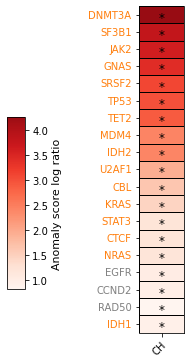

In [193]:
df_anomaly, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(df, 
                                                                                  cohort_df, 
                                                                                  top_cohorts_n=top_cohorts_n, 
                                                                                  top_genes_n=top_genes_n, 
                                                                                  anomaly_dict=anomaly_dict)

df_binary, hits_df, gene_hits_count, cohort_hits_count = get_gene_cohorts_binary(df, 
                                                                                 cohort_df, 
                                                                                 top_cohorts_n=top_cohorts_n, 
                                                                                 top_genes_n=top_genes_n, 
                                                                                 anomaly_dict=False)

df_binary.columns = [cohort.split("_")[2] for cohort in df_binary.columns]
df_anomaly.columns = [cohort.split("_")[2] for cohort in df_anomaly.columns]
gene_colors, lut = get_gene_annotation(df_binary, df)

plot_landscape(df=df_binary, gene_colors=gene_colors, lut=lut, df_anomaly=df_anomaly,
               figsize=(1,8),
               width_ratios=[1, 0.2],
               height_ratios=[0.3, 1],
               legend_box=(-10.5, 0.95),
               ax1_margin=0.005,
               ax4_margin=0.005,
               wspace=0.03, 
               hspace=0.05,
               cbar_loc=[-1.7, 0.2, 0.25, .3],
               filename="landscape_heatmap_ch.png")

# Mouse

In [283]:
genetables_path = "/workspace/projects/clustering_3d/evaluation/tool_output/run_20230608_mouse/Liver_strelka_2017.3d_clustering_genes.csv"
genetables_path

'/workspace/projects/clustering_3d/evaluation/tool_output/run_20230608_mouse/Liver_strelka_2017.3d_clustering_genes.csv'

In [284]:
df = pd.read_csv(genetables_path)
df = df[df["qval"] < 0.01]
df = df[["Gene", "Score_obs_sim_top_vol"]].set_index("Gene")
max_value = df.values[np.isfinite(df.values)].max()
df.replace([np.inf, -np.inf], max_value * 2, inplace=True)
df = np.log(df)
df

,Ratio_obs_sim_top_vol
Gene,
Hras,5.200429
Braf,4.507282
H2-M5,4.181026
Nrcam,4.026246
Ncl,3.545151
Itga9,3.314650
Nkx2-5,3.080942
Olfr1242,2.865297
Egfr,2.791804


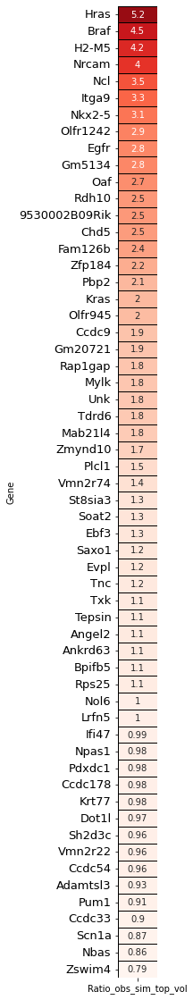

In [313]:
fig = plt.figure(figsize=(0.8,20))
sns.heatmap(df, annot=True, cmap=cmap, cbar=False, lw=1, linecolor="black")
plt.yticks(fontsize=13)

plt.savefig("landscape_mouse.png", dpi=300, bbox_inches='tight')
plt.show()

# Clusters solvent accessibility and more

In [602]:
import os
from tqdm.notebook import tqdm

o3d_datasets = "/workspace/nobackup/scratch/oncodrive3d/datasets_mane_240506"
seq_df = pd.read_csv(f"{o3d_datasets}/seq_for_mut_prob.tsv", sep="\t")
gene_to_uni_id_dict = {gene : uni_id for gene, uni_id in seq_df[["Gene", "Uniprot_ID"]].values}
plddt = pd.read_csv(f"{o3d_datasets}/confidence.tsv", sep="\t")
plddt = plddt[["Uniprot_ID", "Confidence"]]
pacc = pd.read_csv("/workspace/nobackup/scratch/oncodrive3d/annotations_mane_240506/pdb_tool_df.tsv", sep="\t")
pacc = pacc[["Uniprot_ID", "pACC"]]

/tmp/jobs/spellegrini/9964934/ipykernel_20268/1521345198.py:7: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  plddt = pd.read_csv(f"{o3d_datasets}/confidence.tsv", sep="\t")
/tmp/jobs/spellegrini/9964934/ipykernel_20268/1521345198.py:9: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  pacc = pd.read_csv("/workspace/nobackup/scratch/oncodrive3d/annotations_mane_240506/pdb_tool_df.tsv", sep="\t")


### Retrieve cluster mean of pACC and other metrics

In [603]:
%%time

lst_result = []
for cohort in cohort_df.COHORT:
    if not cohort.startswith("ICGC"):
        gene_df_path = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_genes.csv"
        res_df_path = f"{o3d_output_dir}/{cohort}/{cohort}.3d_clustering_pos.csv"
        
        if os.path.isfile(gene_df_path) and os.path.isfile(res_df_path):
            gene_df = pd.read_csv(gene_df_path)
            res_df = pd.read_csv(res_df_path)

            hits = gene_df[gene_df["C_gene"] == 1]
            hits = hits["Gene"].values

            for gene in hits:
                print(cohort, gene)
                hits_res = res_df[(res_df["Gene"] == gene) & (res_df["C"] == 1)]
                plddt_gene = plddt[plddt["Uniprot_ID"] == gene_to_uni_id_dict[gene]]
                plddt_gene = plddt_gene.Confidence
                pacc_gene = pacc[pacc["Uniprot_ID"] == gene_to_uni_id_dict[gene]]
                pacc_gene = pacc_gene.pACC
                mean_values = hits_res.groupby("Cluster").apply(lambda x: lst_result.append((cohort, gene,
                                                                                             drivers_df[drivers_df["SYMBOL"] == gene].ROLE.unique()[0] 
                                                                                             if len(drivers_df[drivers_df["SYMBOL"] == gene].ROLE.unique()) > 0 
                                                                                             else "NA",
                                                                                             x.Cluster.unique()[0], x.Pos.values, 
                                                                                             np.mean(plddt_gene.iloc[x.Pos.values - 1]), 
                                                                                             np.mean(pacc_gene.iloc[x.Pos.values - 1]),
                                                                                             np.mean(x.PAE_vol))))

cluster_info = pd.DataFrame(lst_result, columns=["Cohort", "Gene", "Gene_action", "Cluster", "Pos", "pLDDT", "pACC", "PAE"])
cluster_info = cluster_info[cluster_info["Gene_action"] != "ambiguous"]
cluster_info

HARTWIG_WGS_BLCA_2023 PIK3CA
HARTWIG_WGS_BLCA_2023 RXRA
HARTWIG_WGS_BLCA_2023 FGFR3
HARTWIG_WGS_BLCA_2023 FBXW7
HARTWIG_WGS_BLCA_2023 TP53
CBIOP_WGS_STAD_ONCOSG_2018 TP53
CBIOP_WXS_CM_VALLEN_2018 BRAF
CBIOP_WXS_CM_VALLEN_2018 NRAS
CBIOP_WXS_CM_VALLEN_2018 NBPF3
CBIOP_WXS_CM_VALLEN_2018 ZNF804A
CBIOP_WXS_CM_VALLEN_2018 CTAGE6
CBIOP_WXS_CM_VALLEN_2018 TP53
CBIOP_WXS_CM_VALLEN_2018 CTNNA2
CBIOP_WXS_CM_VALLEN_2018 PPP6C
CBIOP_WXS_BLCA_VALLEN_2018 FAM186A
CBIOP_WXS_BLCA_VALLEN_2018 FGFR3
CBIOP_WXS_BLCA_VALLEN_2018 CUX2
HARTWIG_WGS_HCC_2023 CTNNB1
HARTWIG_WGS_UCEC_2023 FBXW7
HARTWIG_WGS_UCEC_2023 PIK3CA
HARTWIG_WGS_COADREAD_2023 KRAS
HARTWIG_WGS_COADREAD_2023 TP53
HARTWIG_WGS_COADREAD_2023 BRAF
HARTWIG_WGS_COADREAD_2023 FBXW7
HARTWIG_WGS_COADREAD_2023 PIK3CA
HARTWIG_WGS_COADREAD_2023 NRAS
HARTWIG_WGS_COADREAD_2023 SMAD4
HARTWIG_WGS_COADREAD_2023 PCBP1
HARTWIG_WGS_COADREAD_2023 ERBB2
HARTWIG_WGS_COADREAD_2023 BCL9L
HARTWIG_WGS_COADREAD_2023 ERBB3
HARTWIG_WGS_GB_2023 EGFR
CBIOP_WGS_PRAD_EURURO

<timed exec>:9: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.


HARTWIG_WGS_SKCM_2023 BRAF
HARTWIG_WGS_SKCM_2023 NRAS
HARTWIG_WGS_SKCM_2023 MAP2K1
HARTWIG_WGS_SKCM_2023 IDH1
HARTWIG_WGS_SKCM_2023 RAC1
HARTWIG_WGS_SKCM_2023 CNOT9
HARTWIG_WGS_SKCM_2023 KNSTRN
HARTWIG_WGS_SKCM_2023 ZFX
HARTWIG_WGS_SKCM_2023 CRNKL1
HARTWIG_WGS_SKCM_2023 ADH4
HARTWIG_WGS_COAD_2023 KRAS
HARTWIG_WGS_COAD_2023 TP53
HARTWIG_WGS_COAD_2023 BRAF
HARTWIG_WGS_COAD_2023 PIK3CA
HARTWIG_WGS_COAD_2023 SMAD4
HARTWIG_WGS_CHOL_2023 KRAS
HARTWIG_WGS_CHOL_2023 IDH1
HARTWIG_WGS_CHOL_2023 TP53
HARTWIG_WGS_ESCC_2023 TP53
HARTWIG_WGS_ESCC_2023 PIK3CA
HARTWIG_WGS_ESCC_2023 SMAD4
CBIOP_WXS_DLBC_BROAD_2012 EZH2
CBIOP_WXS_DLBC_BROAD_2012 MEF2C
CPTAC_WXS_GBM_2020 CREM
CPTAC_WXS_GBM_2020 ITPRID2
CBIOP_WXS_HCC_AMC_PRV CTNNB1
CBIOP_WXS_HCC_AMC_PRV IFITM3
CBIOP_WXS_HCC_AMC_PRV TP53
CBIOP_WXS_CLL_BROAD_2013 SF3B1
CBIOP_WXS_CLL_BROAD_2013 MYD88
CBIOP_WXS_CLL_BROAD_2013 XPO1
CBIOP_WXS_EGC_TMUCIH_2015 PIK3CA
CBIOP_WXS_EGC_TMUCIH_2015 TP53
CBIOP_WXS_CSCC_UCSF_2018 TP53
CBIOP_WXS_CSCC_UCSF_2018 HRAS
CBIOP_

,Cohort,Gene,Gene_action,Cluster,Pos,pLDDT,pACC,PAE
0,HARTWIG_WGS_BLCA_2023,PIK3CA,Act,0.0,"[542, 545, 539]",93.733333,51.666667,0.841270
1,HARTWIG_WGS_BLCA_2023,RXRA,Act,0.0,"[427, 429]",97.750000,22.000000,0.500000
2,HARTWIG_WGS_BLCA_2023,FGFR3,Act,0.0,"[248, 249]",53.510000,30.000000,0.850000
3,HARTWIG_WGS_BLCA_2023,FGFR3,Act,1.0,[373],65.940000,72.000000,0.000000
4,HARTWIG_WGS_BLCA_2023,FBXW7,Act,0.0,"[505, 465]",98.680000,13.000000,0.500000
...,...,...,...,...,...,...,...,...
921,TCGA_WXS_PRAD,MED12,Act,0.0,"[1223, 1224]",92.055000,0.500000,0.500000
922,TCGA_WXS_PRAD,CTNNB1,Act,0.0,"[32, 33]",37.105000,85.500000,0.800000
923,TCGA_WXS_PGNG,HRAS,Act,0.0,[13],94.820000,36.000000,4.444444
924,TCGA_WXS_PGNG,HRAS,Act,1.0,[61],85.100000,34.000000,0.000000


### Plot distributions

In [726]:
df_info_na = cluster_info[cluster_info["Gene_action"] == "NA"].groupby("Gene").apply(lambda x: (len(x.Cohort.unique()), len(x)))
pd.DataFrame(df_info_na.tolist(), index=df_info_na.index, columns=["# cohorts", "# clusters"]).sort_values("# clusters", ascending=False)[:30]

,# cohorts,# clusters
Gene,,
IGLL5,2,14
EGR1,1,4
AHNAK2,2,3
OR5H14,2,2
ESX1,2,2
TBR1,2,2
GBP4,2,2
HLA-DQB1,2,2
RETSAT,2,2


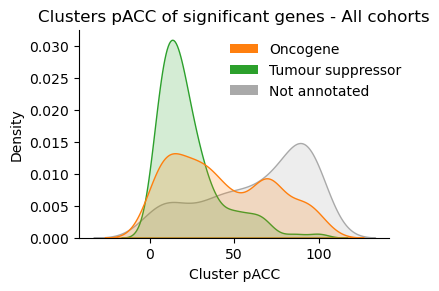

In [785]:
lut = {"Act": '#ff7f0e', 
       "LoF": '#2ca02c',
       "ambiguous" : "#b300b2",
       "NA": 'darkgray'}

## Plot 
plt.figure(figsize=(4, 2.7))
palette = {'Act': '#ff7f0e', 'LoF': '#2ca02c', "ambiguous" : "#b300b2", 'NA': 'darkgray'}
sns.kdeplot(data=cluster_info, x='pACC', hue='Gene_action', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Add labels and a legend
plt.xlabel('Cluster pACC')
plt.ylabel('Density')
plt.title("Clusters pACC of significant genes - All cohorts", fontsize=12)

handles = [mpatches.Patch(facecolor=lut["Act"], label="Oncogene"),
           mpatches.Patch(facecolor=lut["LoF"], label="Tumour suppressor"),
           mpatches.Patch(facecolor=lut["NA"], label="Not annotated")]
plt.legend(handles=handles, frameon=False, bbox_to_anchor=[0,0,1.08,1])
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
#plt.savefig("pacc_cluster_distribution_by_action.png", dpi=300, bbox_inches='tight')
plt.show()

In [597]:
lut = {"Act": '#ff7f0e', 
       "LoF": '#2ca02c',
       "ambiguous" : "#b300b2",
       "NA": 'darkgray'}

## Plot 
plt.figure(figsize=(4, 2.7))
palette = {'Act': '#ff7f0e', 'LoF': '#2ca02c', "ambiguous" : "#b300b2", 'NA': 'darkgray'}
sns.kdeplot(data=cluster_info, x='pLDDT', hue='Gene_action', fill=True, common_norm=False, palette=palette, alpha=0.2)

# Add labels and a legend
plt.xlabel('Cluster pLDDT')
plt.ylabel('Density')
plt.title("Clusters pLDDT of significant genes - All cohorts", fontsize=12)

handles = [mpatches.Patch(facecolor=lut["Act"], label="Oncogene"),
           mpatches.Patch(facecolor=lut["LoF"], label="Tumour suppressor"),
           mpatches.Patch(facecolor=lut["NA"], label="Not annotated")]
plt.legend(handles=handles, loc="upper left", frameon=False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.savefig("plddt_cluster_distribution_by_action.png", dpi=300, bbox_inches='tight')
plt.show()

NameError: name 'cluster_info' is not defined

<Figure size 400x270 with 0 Axes>

/tmp/jobs/spellegrini/9964934/ipykernel_1413/1621273303.py:29: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.kdeplot(data=cluster_info, x='PAE', fill=True, common_norm=False, palette=palette, alpha=0.2, color="skyblue")


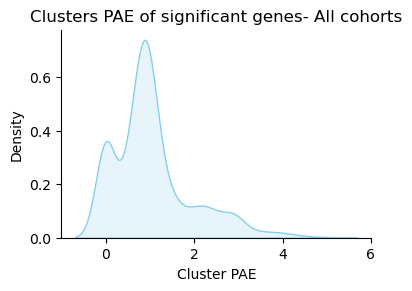

In [794]:
lut = {"Act": '#ff7f0e', 
       "LoF": '#2ca02c',
       "ambiguous" : "#b300b2",
       "NA": '#7f7f7f'}

# ## Plot 
# plt.figure(figsize=(6, 4))
# palette = {'Act': '#ff7f0e', 'LoF': '#2ca02c', "ambiguous" : "#b300b2", 'NA': '#7f7f7f'}
# sns.kdeplot(data=cluster_info, x='PAE', hue='Gene_action', fill=True, common_norm=False, palette=palette, alpha=0.2)

# # Add labels and a legend
# plt.xlabel('Cluster PAE')
# plt.ylabel('Density')
# plt.title("Clusters PAE of significant genes - All cohorts", fontsize=12)

# handles = [mpatches.Patch(facecolor=lut["Act"], label="Act"),
#            mpatches.Patch(facecolor=lut["LoF"], label="LoF"),
#            mpatches.Patch(facecolor=lut["ambiguous"], label="ambiguous"),
#            mpatches.Patch(facecolor=lut["NA"], label="NA")]
# plt.legend(handles=handles)
# plt.gca().spines['top'].set_visible(False)
# plt.gca().spines['right'].set_visible(False)
# plt.savefig("pae_cluster_distribution_by_action.png", dpi=300, bbox_inches='tight')
# plt.show()

## Plot 
plt.figure(figsize=(4, 2.7))
#palette = {'Act': lut["Act"], 'LoF': lut["LoF"], "ambiguous" : lut["ambiguous"], 'NA': lut["NA"]}
sns.kdeplot(data=cluster_info, x='PAE', fill=True, common_norm=False, palette=palette, alpha=0.2, color="skyblue")

# Add labels and a legend
plt.xlabel('Cluster PAE')
plt.ylabel('Density')
plt.title("Clusters PAE of significant genes- All cohorts", fontsize=12)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.savefig("pae_cluster_distribution.png", dpi=300, bbox_inches='tight')
plt.show()